# Main Notebook

## Importing Data and Rotating Coordinates
### This section is to remain **unchanged**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.cm as cm
from sympy.interactive import printing
printing.init_printing(use_latex = True)



import astropy.coordinates as coord
from astropy.table import Table, vstack
from astropy.io import fits
import astropy.units as u
from astropy.coordinates import Angle

import pickle
import pandas as pd

coord.galactocentric_frame_defaults.set('v4.0')
import galstreams
import gala.coordinates as gc
import gala.potential as gp
import gala.dynamics as gd
from gala.units import galactic
from gala.dynamics.nbody import DirectNBody
import gala.integrate as gi

%matplotlib inline
%config InlineBackend.figure_format='retina'

from helpers.SimulationAnalysis import SimulationAnalysis, iterTrees
from helpers.SimulationAnalysis import readHlist

        Use @ instead. [gala.coordinates.sgr]
        Use @ instead. [gala.coordinates.orphan]
        Use @ instead. [gala.coordinates.magellanic_stream]


In [2]:
gsr = coord.Galactocentric() #this is for gal streams
mwsts = galstreams.MWStreams(verbose=False, implement_Off=False)

Initializing galstreams library from master_log... 


        Use @ instead. [gala.coordinates.greatcircle]


In [3]:
#Path to simulation data
path_to_data = ''

#Halo properties to load; see Section 2.4 of https://arxiv.org/abs/2008.08591 for info on Rockstar fields 
fields = ['scale','id', 'upid', 'pid', 'mvir', 'mpeak', 'rvir', 'RVmax', 'rs', 'vmax', 'vpeak', 'x', 'y', 'z', 'vx', 'vy', 'vz',
          'M200c', 'depth_first_id','scale_of_last_MM']

#Load z = 0 halo list for Halo416_16K
halos_z0 = readHlist(path_to_data+'hlist_0.97483.list',fields=fields) #hlist_0.97483.list
MW_analog = halos_z0[np.argmax(halos_z0['mvir'])]

subhalos_z0 = halos_z0[halos_z0['upid']==MW_analog['id']]
LMC_analog = subhalos_z0[np.argmax(subhalos_z0['mvir'])]


#Reading in data from dm particles
t = Table.read('snapshot_now.fits')

# ind_lmc = subhalos_z0['pid']==LMC_analog['id']
ind_lmc = np.argmax(subhalos_z0['mvir'])



In [4]:
#Here we make sure 
h = 0.7
loc_lmc = np.sqrt( ((subhalos_z0[ind_lmc]['x']) - (MW_analog['x']))**2 + 
                   ((subhalos_z0[ind_lmc]['y']) - (MW_analog['y']))**2 + 
                   ((subhalos_z0[ind_lmc]['z']) - (MW_analog['z']))**2 ) 

loc_lmc*(u.Mpc/h).to(u.kpc) #loc_lmc should be ~50 

<Quantity 58.51196081 kpc>

In [5]:
h = 0.7
ts = Table(subhalos_z0)
for comp in ['x', 'y', 'z']:
    ts[comp] = ((ts[comp] - MW_analog[comp])*u.Mpc/h).to(u.kpc)
for comp in ['vx', 'vy', 'vz']:
    ts[comp] = (ts[comp] - MW_analog[comp])*u.km/u.s

In [6]:
ind_massive = (ts['mvir'] > 10**7)

### Taking the hlist data and reading in the 3D pos. & vel. to rotate the cdm subhalos.

In [7]:
c = coord.Galactocentric(x=ts['x'][ind_massive], y=ts['y'][ind_massive], z=ts['z'][ind_massive],
                         v_x=ts['vx'][ind_massive], v_y=ts['vy'][ind_massive], v_z=ts['vz'][ind_massive])
ceq = c.transform_to(coord.ICRS()) 

ceq_lmc = coord.ICRS(ra=78.76*u.deg, dec=-69.19*u.deg, distance=(10**(0.2*18.50+1)*u.pc).to(u.kpc), 
                     radial_velocity=262.2*u.km/u.s, pm_ra_cosdec=1.91*u.mas/u.yr, pm_dec=0.229*u.mas/u.yr)
c_lmc = ceq_lmc.transform_to(coord.Galactocentric()) #galactocentric coordinates

In [8]:
vsim = np.array([c.x.value[ind_lmc], c.y.value[ind_lmc], c.z.value[ind_lmc]]) #this is the u vector 
vsim = vsim / np.linalg.norm(vsim)

vtrue = np.array([c_lmc.x.value, c_lmc.y.value, c_lmc.z.value]) #this is the v vector 
vtrue = vtrue / np.linalg.norm(vtrue)

vpole = np.cross(vsim, vtrue)
vpole = vpole / np.linalg.norm(vpole)

In [9]:
theta = np.arccos(np.dot(vsim,vtrue)/(np.linalg.norm(vsim)*np.linalg.norm(vtrue)))

#ROTATION MATRIX
R = np.array([[np.cos(theta) + vpole[0]**2*(1-np.cos(theta)),
              vpole[0]*vpole[1]*(1-np.cos(theta)) - vpole[2]*np.sin(theta),
              vpole[0]*vpole[2]*(1-np.cos(theta)) + vpole[1]*np.sin(theta)],
             [vpole[1]*vpole[0]*(1-np.cos(theta)) + vpole[2]*np.sin(theta),
              np.cos(theta) + vpole[1]**2*(1-np.cos(theta)),
              vpole[1]*vpole[2]*(1-np.cos(theta)) - vpole[0]*np.sin(theta)],
             [vpole[2]*vpole[0]*(1-np.cos(theta)) - vpole[1]*np.sin(theta),
              vpole[2]*vpole[1]*(1-np.cos(theta)) + vpole[0]*np.sin(theta),
              np.cos(theta) + vpole[2]**2*(1-np.cos(theta))]])

In [10]:
trot = Table(subhalos_z0[ind_massive])
N = len(trot)
trot['x'] = np.zeros(N)#*u.kpc
trot['y'] = np.zeros(N)#*u.kpc
trot['z'] = np.zeros(N)#*u.kpc

for i in range(N):
    temp_vec = np.array([ts['x'][ind_massive][i], ts['y'][ind_massive][i], ts['z'][ind_massive][i]])
    rot_vec = np.matmul(R, temp_vec)
    
    trot['x'][i] = rot_vec[0]#*u.kpc
    trot['y'][i] = rot_vec[1]#*u.kpc
    trot['z'][i] = rot_vec[2]#*u.kpc

In [11]:
#This is the radius from the center at which the maximum velocity occurs
trot['rs'] = (trot['RVmax'])/2.163

In [12]:
subhalo_dist=np.sqrt(trot['x']**2+trot['y']**2+trot['z']**2)

In [13]:
ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
                                     r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))


In [14]:
#Getting the Orbits of Subhalos
dt = 0.2*u.Myr
subh_orbits = []
Nstep_long=1000
for subh in range(len(ts['x'][ind_massive])): 
    #This calculates the position of the subhalos at a given time
    c_subh = coord.Galactocentric(x=ts['x'][ind_massive][subh]*u.kpc, y=ts['y'][ind_massive][subh]*u.kpc, 
                                  z=ts['z'][ind_massive][subh]*u.kpc,
                                  v_x=ts['vx'][ind_massive][subh]*u.km/u.s, 
                                  v_y=ts['vy'][ind_massive][subh]*u.km/u.s,
                                  v_z=ts['vz'][ind_massive][subh]*u.km/u.s)
    w0_subh = gd.PhaseSpacePosition(c_subh.cartesian)
    subh_orbits += [ham.integrate_orbit(w0_subh, dt=-dt, n_steps=Nstep_long)]

In [15]:
#Rotating Subhalo Position Orbits 
N = len(subh_orbits[0].pos.x)

rot_orbits=np.zeros((len(ts['x'][ind_massive]), len(subh_orbits[1].pos.x), 3))

for j, subh in enumerate(subh_orbits):
    for i in range(N):
        temp_vec = np.array([subh.pos.x[i].value, subh.pos.y[i].value, subh.pos.z[i].value])
        rot_vec = np.matmul(R, temp_vec)

        rot_orbits[j][i][0] = rot_vec[0]
        rot_orbits[j][i][1] = rot_vec[1]
        rot_orbits[j][i][2] = rot_vec[2]


In [16]:
np.shape(rot_orbits), rot_orbits

((1062, 1001, 3),
 array([[[ -12.90498432,  -93.95291494,   36.86667573],
         [ -12.89668337,  -93.97252579,   36.85132795],
         [ -12.88837968,  -93.99211661,   36.83597232],
         ...,
         [  -3.61376696, -103.5857666 ,   18.40055344],
         [  -3.60378078, -103.5853652 ,   18.37958202],
         [  -3.59379388, -103.58494331,   18.35860696]],
 
        [[  22.83354916,   49.91699363,    6.47186947],
         [  22.91415216,   49.92629918,    6.49786563],
         [  22.99473759,   49.93556646,    6.5238568 ],
         ...,
         [  93.09072873,   47.05936918,   29.33831766],
         [  93.15135302,   47.04907771,   29.35819662],
         [  93.21196003,   47.03877753,   29.37807014]],
 
        [[   8.40648924,  -14.47762624,   44.09924941],
         [   8.46899874,  -14.48974719,   44.15592388],
         [   8.53149939,  -14.501853  ,   44.21255222],
         ...,
         [  64.46748271,  -21.90951086,   85.16392496],
         [  64.51723194,  -21.91396096

In [17]:
#Rotating Subhalo Velocity Orbits 
N = len(subh_orbits[0].vel.d_x)

rot_orbits_vel=np.zeros((len(ts['vx'][ind_massive]), len(subh_orbits[1].vel.d_x), 3))

for j, subh in enumerate(subh_orbits):
    for i in range(N):
        temp_vec_vel = np.array([subh.vel.d_x.to(u.km/u.s)[i].value, 
                                 subh.vel.d_y.to(u.km/u.s)[i].value, 
                                 subh.vel.d_z.to(u.km/u.s)[i].value])
        rot_vec_vel = np.matmul(R, temp_vec_vel)

        rot_orbits_vel[j][i][0] = rot_vec_vel[0]
        rot_orbits_vel[j][i][1] = rot_vec_vel[1]
        rot_orbits_vel[j][i][2] = rot_vec_vel[2]

## Creating Data with Malhan Info

In [18]:
#Creating a data frame with Malhans information on Streams

data = [['Gjoll', 82.1, -13.95, 3.26, 23.58, -23.7, 78.73], 
        ['Leiptr', 89.11, -28.37, 7.39, 10.59, -9.9, 194.22],
        ['Hrid', 280.51, 33.3, 2.75, -5.88, 20.08, -238.77],
        ['Pal5', 229.65, 0.26, 20.16, -2.75, -2.68, -57.03],
        ['Gaia_1', 190.96, -9.16, 5.57, -14.39, -19.72, 214.91], #Gaia_1
        ['Ylgr', 173.82, -22.31, 9.72, -0.44, -7.65, 317.86], 
        ['Fjorm', 251.89, 65.38, 6.42, 3.92, 3.1, -25.37],
        ['Kshir', 205.88, 67.25, 9.57, -7.67, -3.92, -249.88],
        ['Gunnthra', 284.22, -73.49, 2.83, -15.83, -24.04, 132.26],
        ['Slidr', 160.05, 10.22, 2.99, -24.6, -6.65, -87.98],
        ['M92', 259.89, 43.08, 8.94, -5.15, -0.63, -140.66],
        ['NGC_3201', 152.46, -46.32, 4.99, 8.87, -2.22, 489.63],
        ['Atlas', 25.04, -29.81, 19.93, 0.04, -0.89, -85.65],
        ['C_7', 287.15, -50.17, 6.77, -13.79, -12.38, 55.05],
        ['Palca', 36.57, -36.15, 12.31, 0.9, -0.23, 106.32],
        ['Sylgr', 179.68, -2.44, 3.77, -13.98, -12.9, -184.8],
        ['Gaia_9', 233.27, 60.42, 4.68, -12.49, 6.37, -359.86],
        ['Gaia_10', 161.47, 15.17, 13.32, -4.14, -3.15, 289.62],
        ['Gaia_12', 41.05, 16.45, 15.71, 5.84, -5.66, -303.83],
        ['Indus', 340.12, -60.58, 14.96, 3.59, -4.89, -49.15],
        ['Jhelum', 351.95, -51.74, 11.39, 7.23, -4.37, -1.29],
        ['Phoenix', 23.96, -50.01, 16.8, 2.72, -0.07, 45.92],
        ['NGC5466', 214.41, 26.84, 14.09, -5.64, -0.72, 95.04],
        ['M5', 206.96, 13.5, 7.44, 3.5, -8.76, -42.97],
        ['C_20', 359.81, 8.63, 18.11, -0.58, 1.44, -116.87],
        ['C_19', 355.28, 28.82, 18.04, 1.25, -2.74, -193.48],
        ['Elqui', 19.77, -42.36, 51.41, 0.33, -0.49, 15.86],
        ['AliqaUma', 34.08, -33.97, 21.48, 0.24, -0.79, -42.33],
        ['Phlegethon', 319.89, -32.07, 3.29, -3.97, -37.66, 15.9],
        ['GD_1', 160.02, 45.9, 8.06, -6.75, -10.88, -101.83]
       ]
  
# Create the pandas DataFrame
streams = pd.DataFrame(data, columns=['Stream', 'ra', 'dec', 'distance', 'pm_ra_cosdec', 'pm_dec', 'radial_velocity'])


## Figuring Out the Number of Steps Needed to Represent Each Stream

The streams we use are only the ones that contain information both from Malhan and Mateau

In [19]:
#Names that go from:  Malhan ---> Mateau 

names = dict(Gjoll='NGC3201-P21',Leiptr='Leiptr-I21',
Hrid='Hrid-I21', Pal5='Pal5-PW19', 
Gaia_1='Gaia-1-I21', Ylgr='Ylgr-I21', 
Fjorm='M68-P19', Kshir='Kshir-I21', 
Gunnthra='Gunnthra-I21', Slidr='Slidr-I21', 
M92='M92-I21', NGC_3201='None',
Atlas='AAU-ATLAS-L21', C_7='C-7-I21', 
Palca='Palca-S18', Sylgr='Sylgr-I21',
Gaia_9='Gaia-9-I21', Gaia_10='Gaia-10-I21', 
Gaia_12='Gaia-12-I21', Indus='Indus-S19', 
Jhelum='Jhelum-a-B19', Phoenix='Phoenix-S19',
NGC5466='NGC5466-G06', M5='M5-G19', 
C_20='None', C_19='C-19-I21',
Elqui='Elqui-S19', AliqaUma='AAU-AliqaUma-L21', 
Phlegethon='Phlegethon-I21', GD_1='GD-1-I21') 


In [20]:
#Now we have all the information on the number of steps FORWARD 
Nstep_foward_dict = dict(Gjoll=116,Leiptr=50,
Hrid=43, Pal5=97, 
Gaia_1=16, Ylgr=49, 
Fjorm=19, Kshir=17, 
Gunnthra=7, Slidr=12, 
M92=100, NGC_3201='Unknown', 
Atlas=140, C_7=15, 
Palca='Unknown', Sylgr=28, #Discarted Palca because both datas aren't consistent with eaxh other 
Gaia_9=16, Gaia_10=97, 
Gaia_12=26, Indus=32, 
Jhelum=31, Phoenix=55,
NGC5466=275, M5=42, 
C_20='None', C_19='Unknown', #no Malhan info on C_20 (C20); C_19 (C19) is very unprecise
Elqui=350, AliqaUma='Unknown', #getting rid of AliquaUma 
Phlegethon=14, GD_1=175)

In [21]:
#Saving number of steps needed to represent the stream
Nstep_represent_dict = dict(Gjoll=200,Leiptr=145,
Hrid=57, Pal5=295, 
Gaia_1=38, Ylgr=125, 
Fjorm=450, Kshir=74, 
Gunnthra=27, Slidr=35, 
M92=165, NGC_3201='Unknown', 
Atlas=226, C_7=36,
Palca='Unknown', Sylgr=53,
Gaia_9=42, Gaia_10=138, 
Gaia_12=50, Indus=110, 
Jhelum=105, Phoenix=108,
NGC5466=330, M5=88, 
C_20='None', C_19='Unknown',  
Elqui=467, AliqaUma='Unknown', 
Phlegethon=50, GD_1=311)

<ipython-input-22-8948ec689116>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


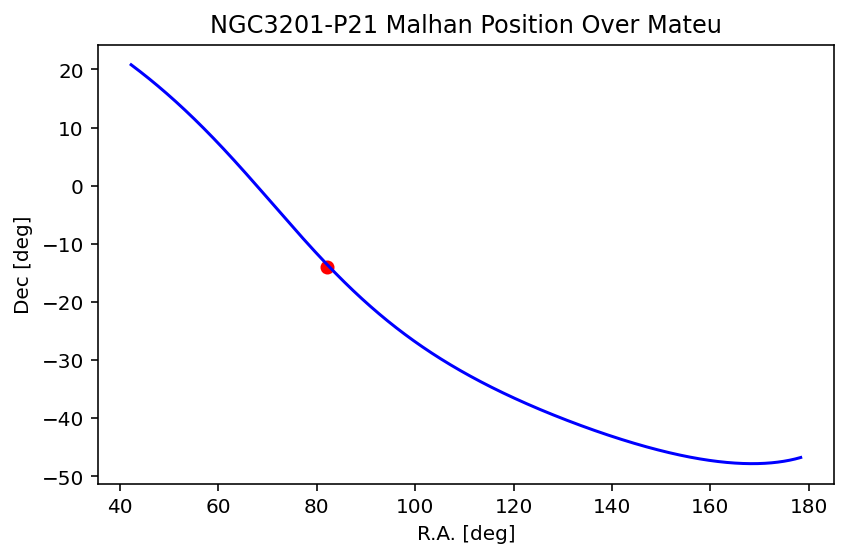

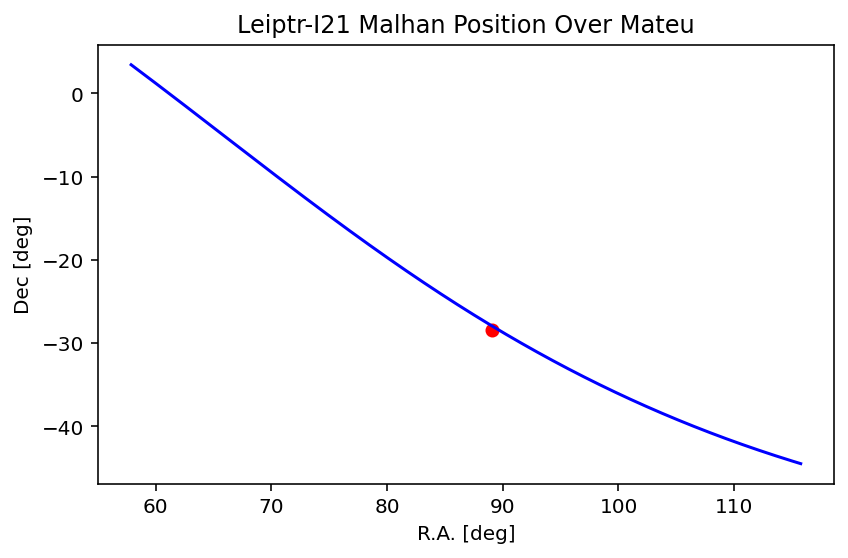

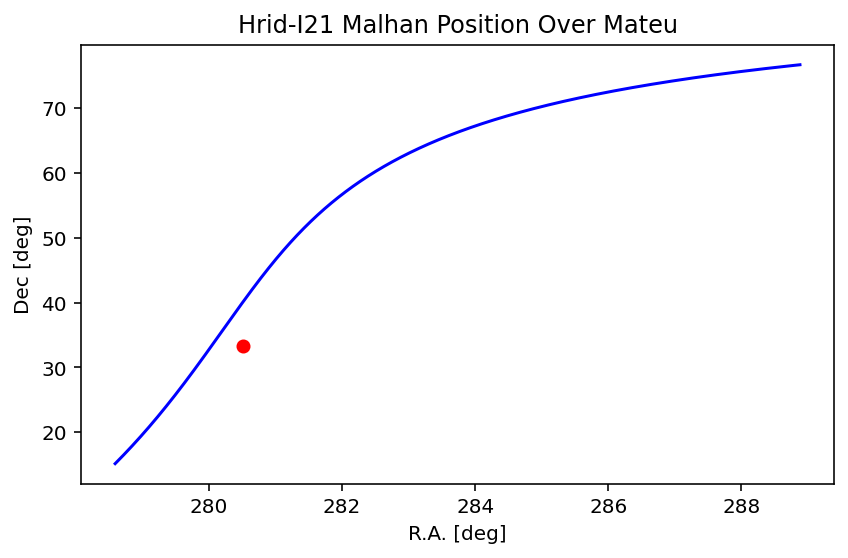

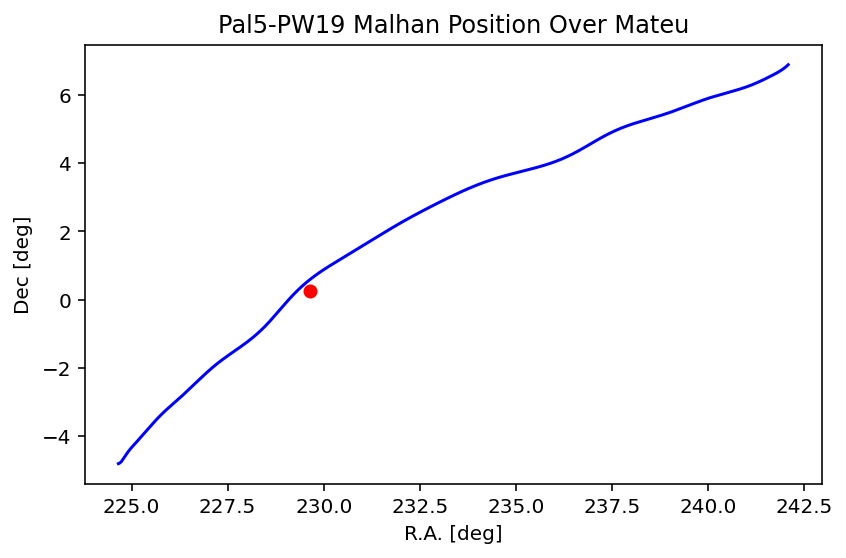

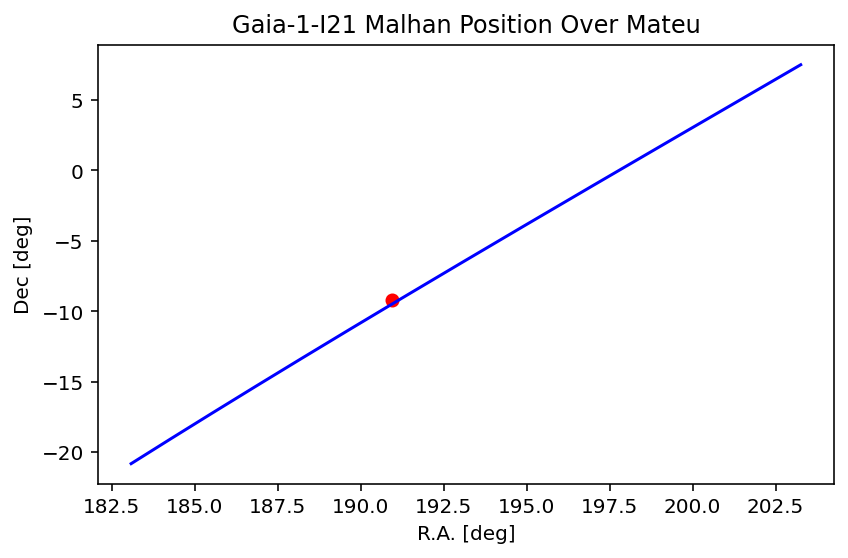

...

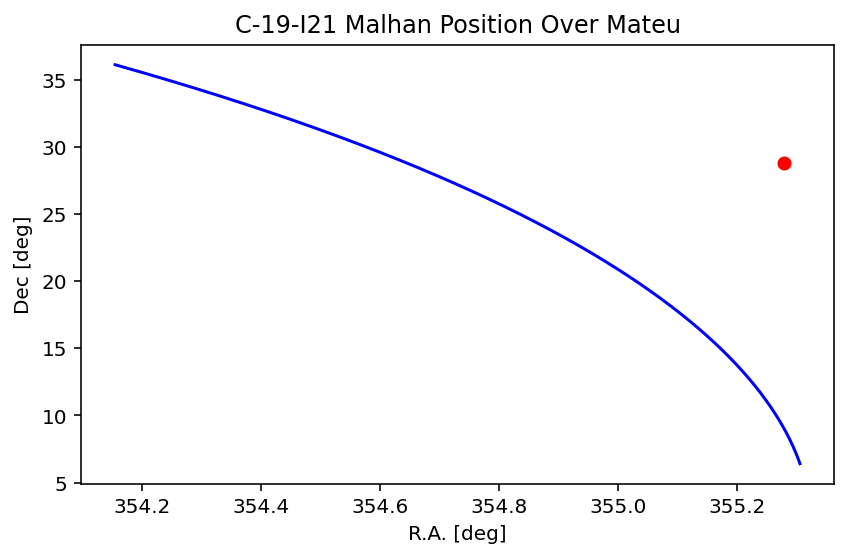

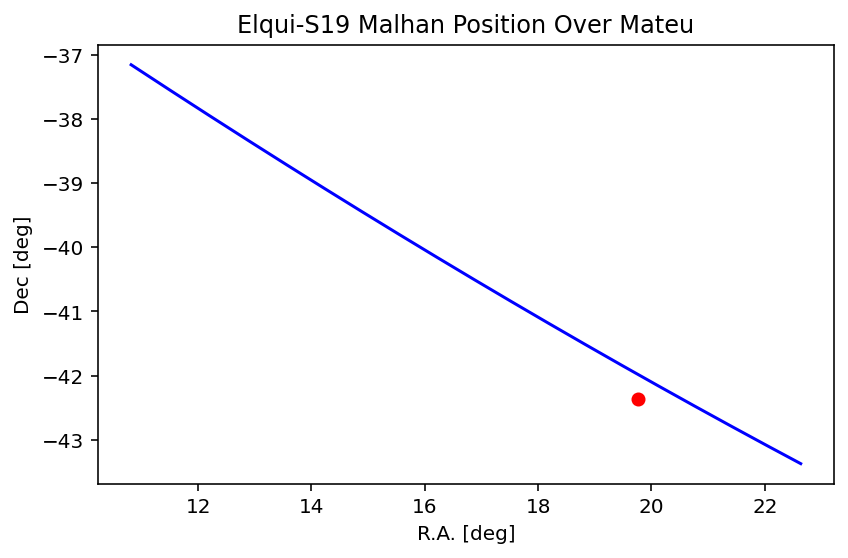

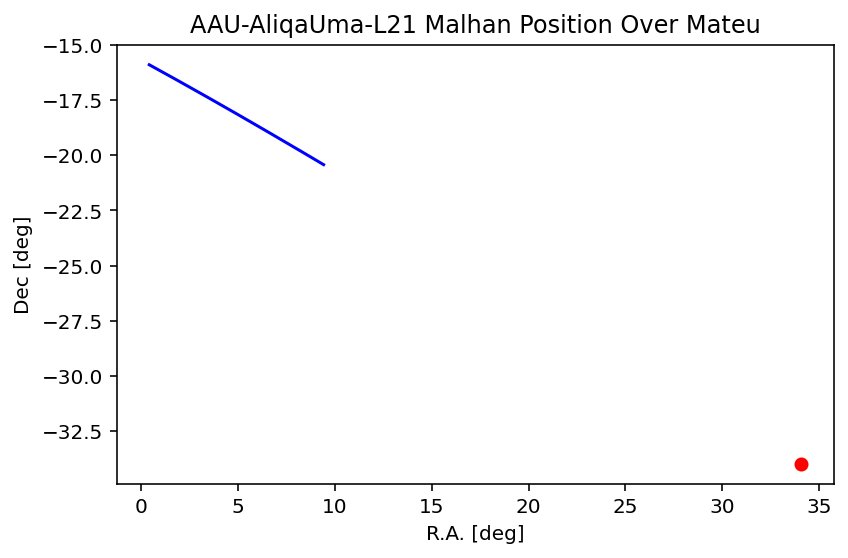

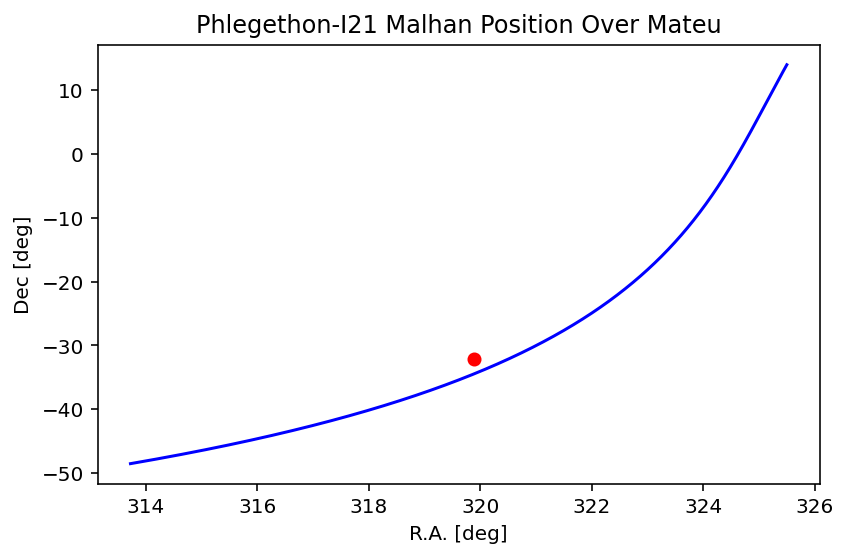

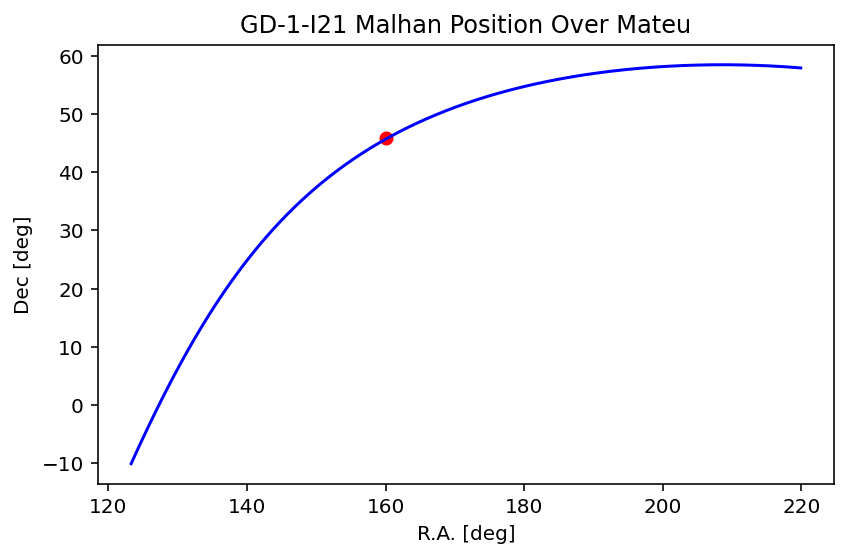

In [22]:
#This part is used to make sure that the data point from Malhan is at a reasonable location compared to Mateus stream

#Initial Point of Malhan (red) vs Stream (Mateu)

# define Galactocentric reference frame
coord.galactocentric_frame_defaults.set('v4.0')
gc_frame = coord.Galactocentric()
ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
                                     r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))

for i in range(len(names)):
    if list(names.values())[i] != 'None': #the only one cut off was C_20 because no information of it is found in Mateau
        c = coord.SkyCoord(ra=streams.iloc[i][1]*u.deg, dec=streams.iloc[i][2]*u.deg, distance=streams.iloc[i][3]*u.kpc, 
                           pm_ra_cosdec=streams.iloc[i][4]*u.mas/u.yr,pm_dec=streams.iloc[i][5]*u.mas/u.yr, 
                           radial_velocity=streams.iloc[i][6]*u.km/u.s, frame='icrs')
        w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)

        name=list(names.values())[i] #iterating though 
        plt.figure()
        plt.plot(c.ra.wrap_at(360*u.deg), c.dec, 'ro')
        plt.plot(mwsts[name].track.ra.wrap_at(360*u.deg), mwsts[name].track.dec, 'b-')
        plt.title(list(names.values())[i]+' Malhan Position Over Mateu')
        plt.xlabel('R.A. [deg]')
        plt.ylabel('Dec [deg]')
        #plt.gca().set_aspect('equal')
        plt.tight_layout()

        #plt.savefig('Creating_Streams_Steps/Original_Pos/'+name+'_Original_Pos.png', transparent=False, dpi=200)
        
        
        

<ipython-input-23-21c73dc884e2>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


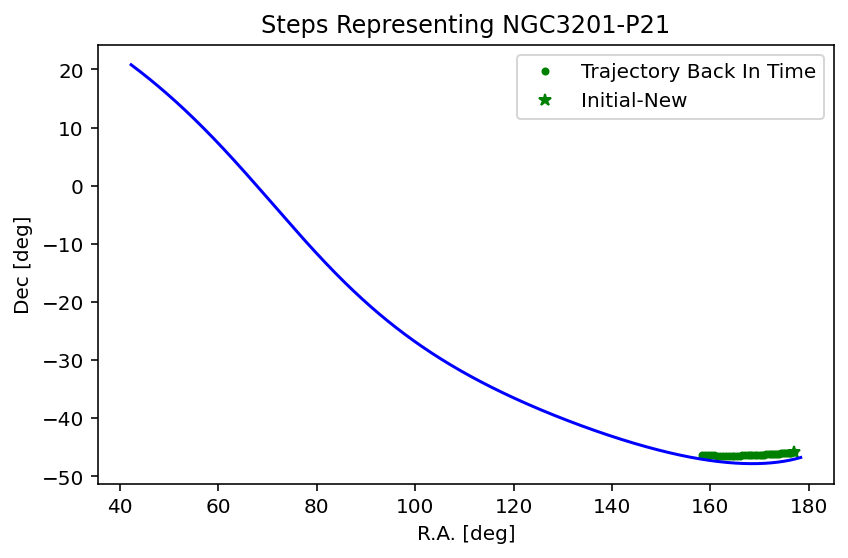

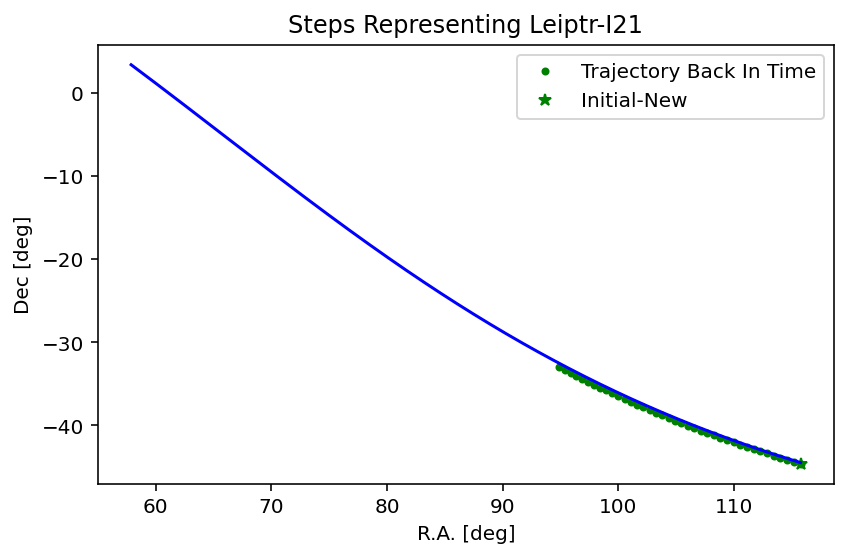

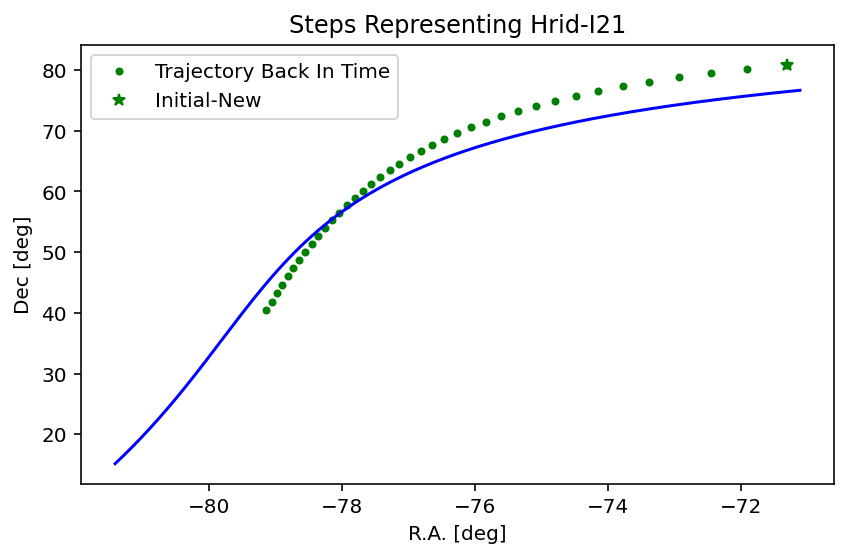

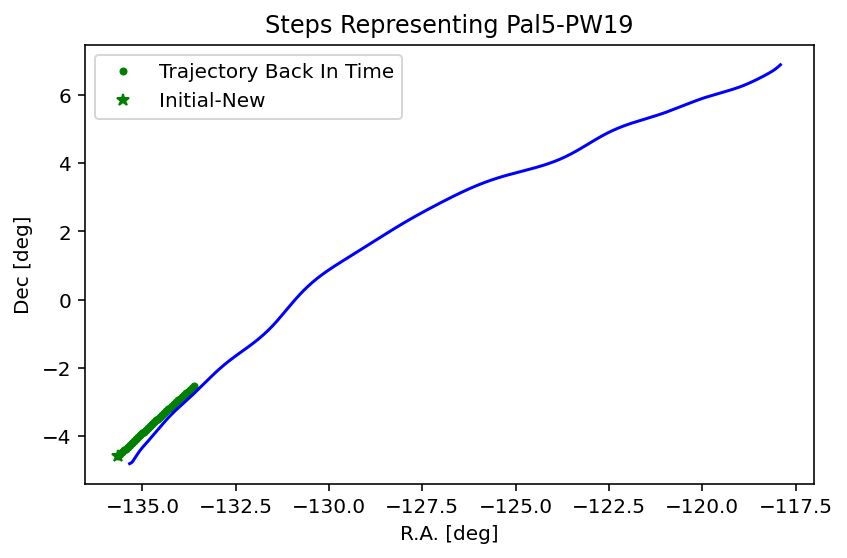

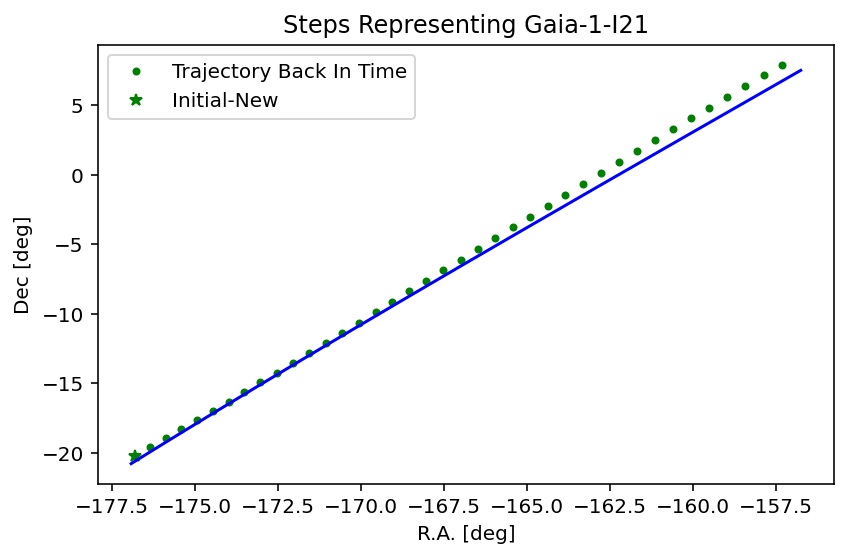

...

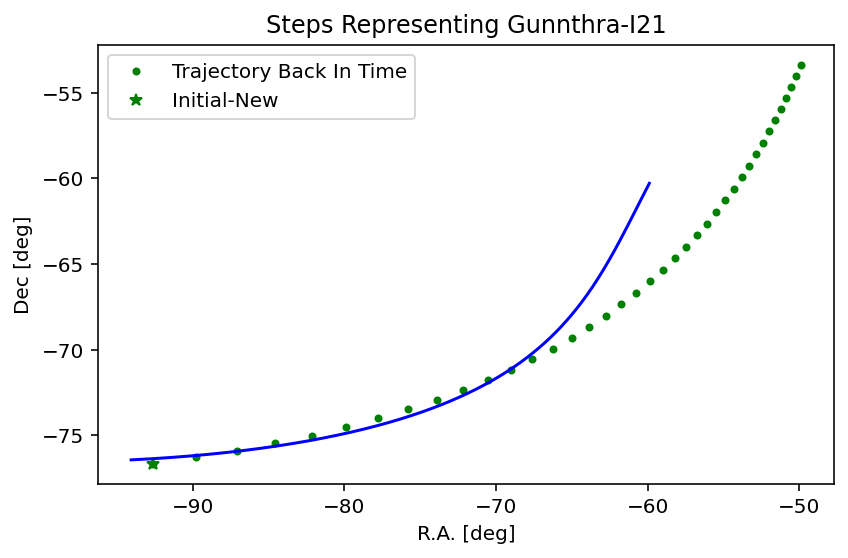

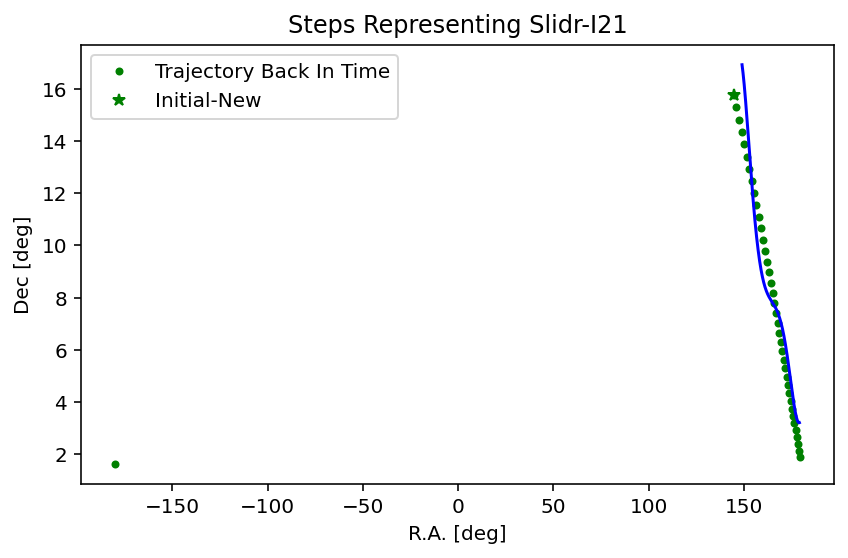

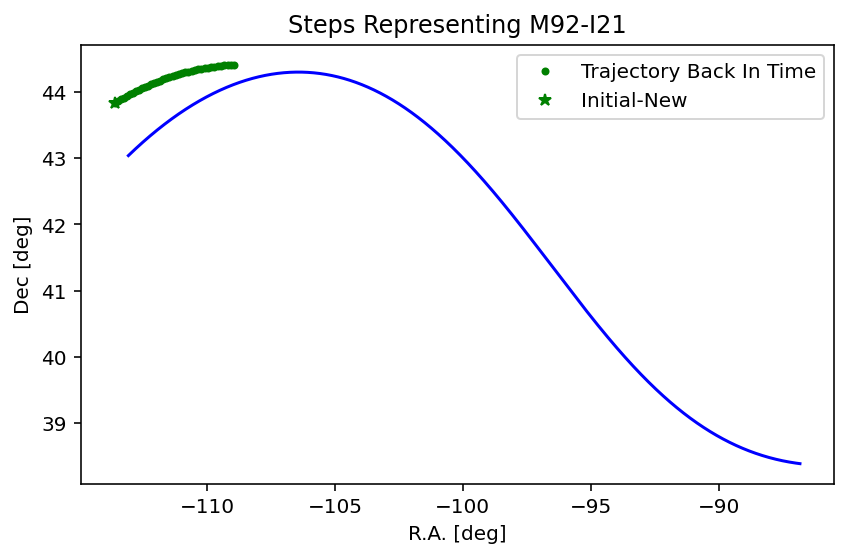

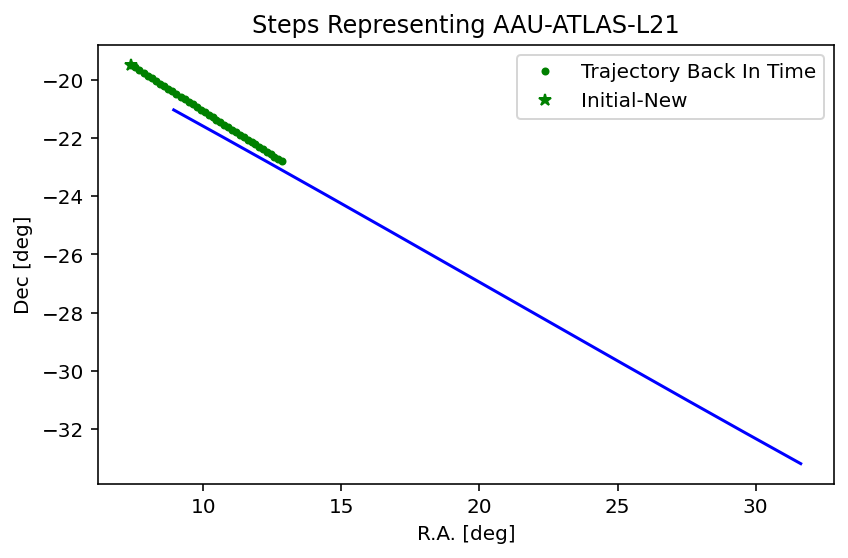

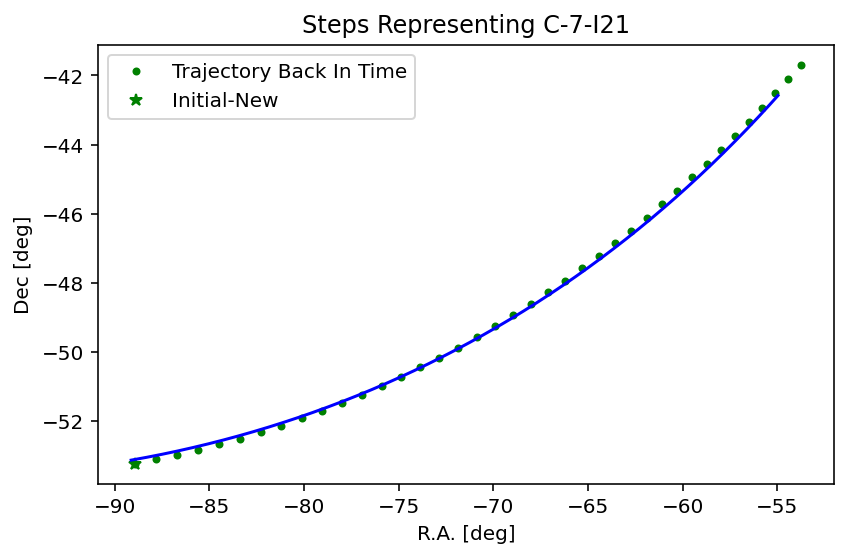

<Figure size 432x288 with 0 Axes>

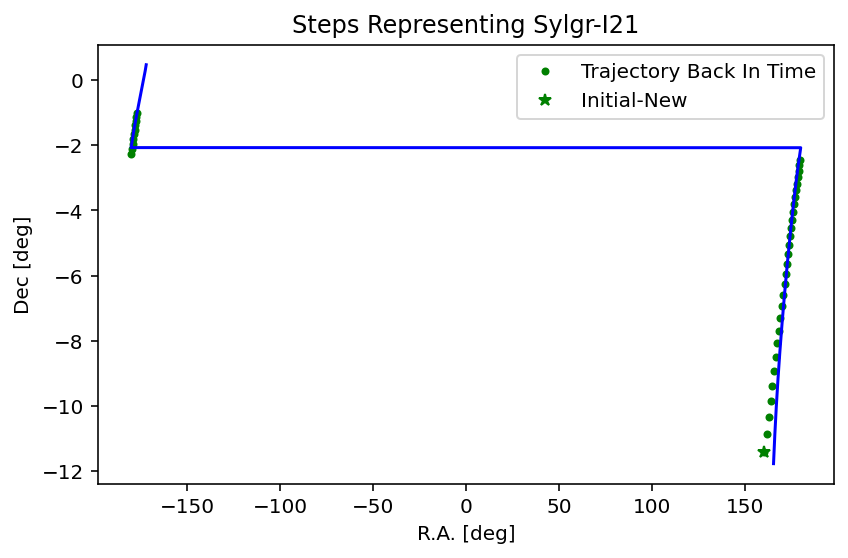

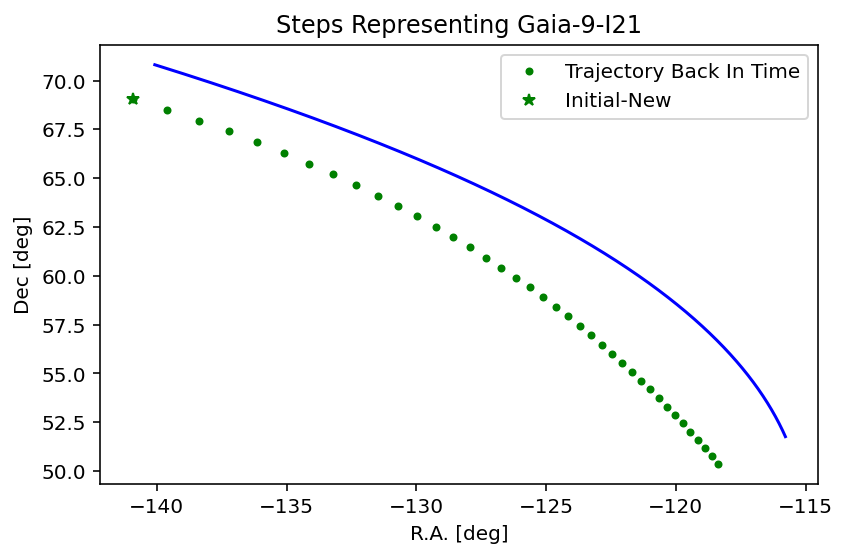

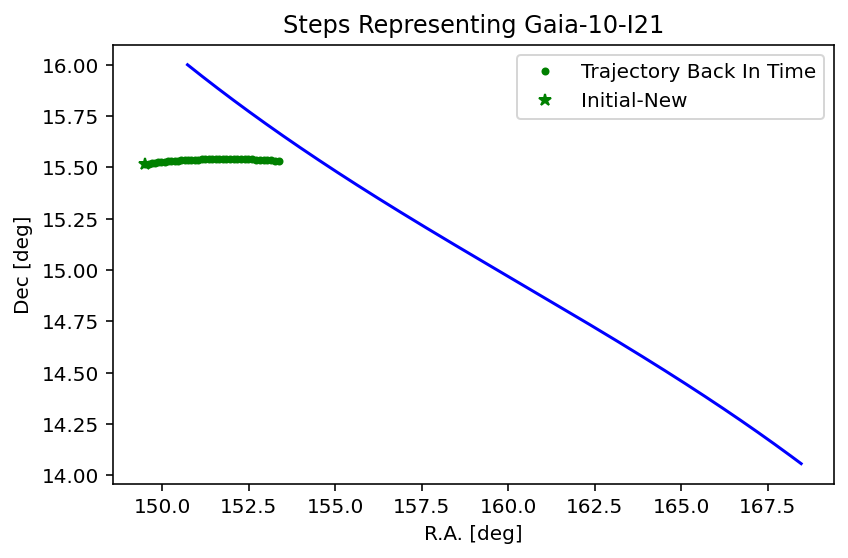

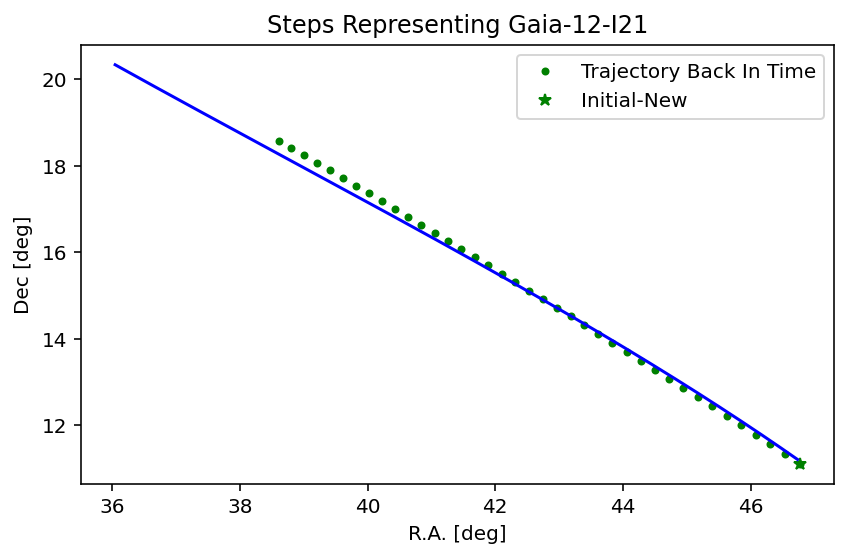

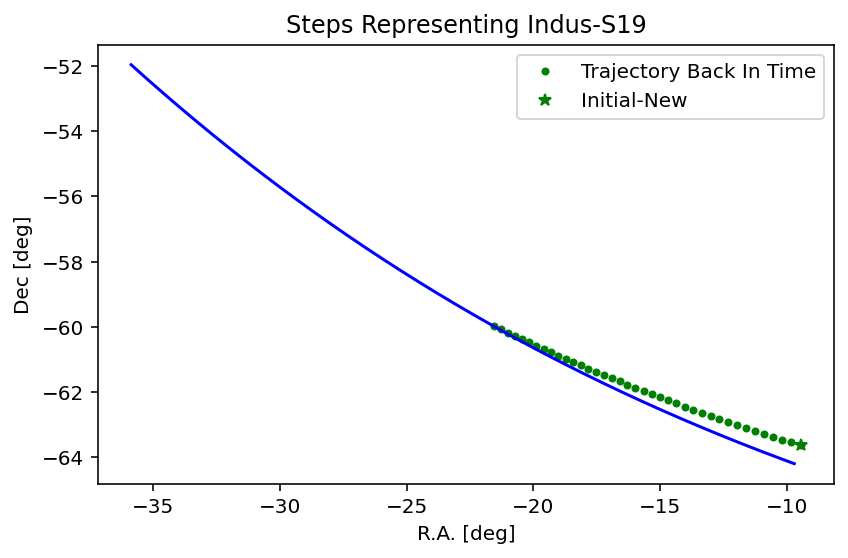

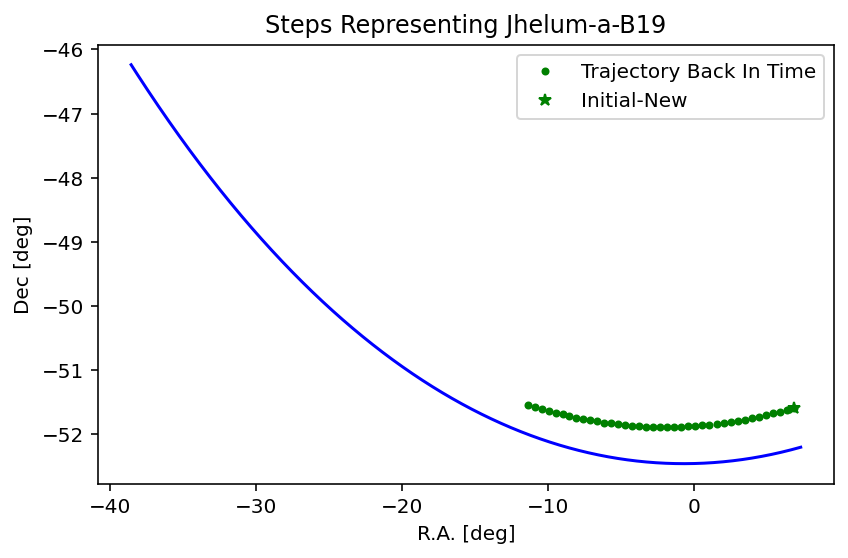

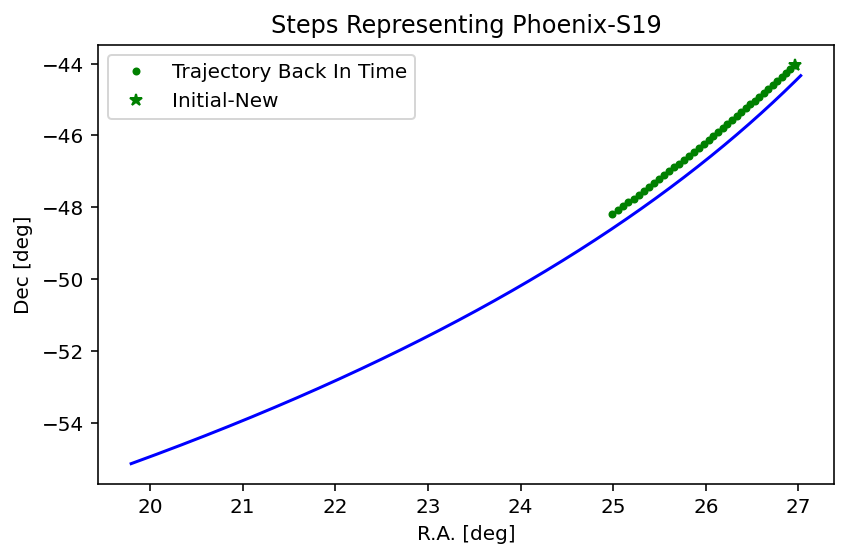

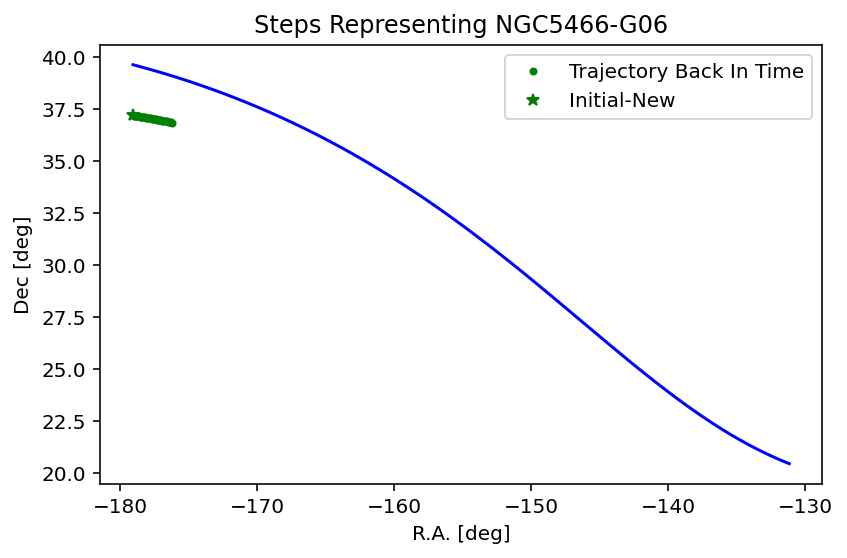

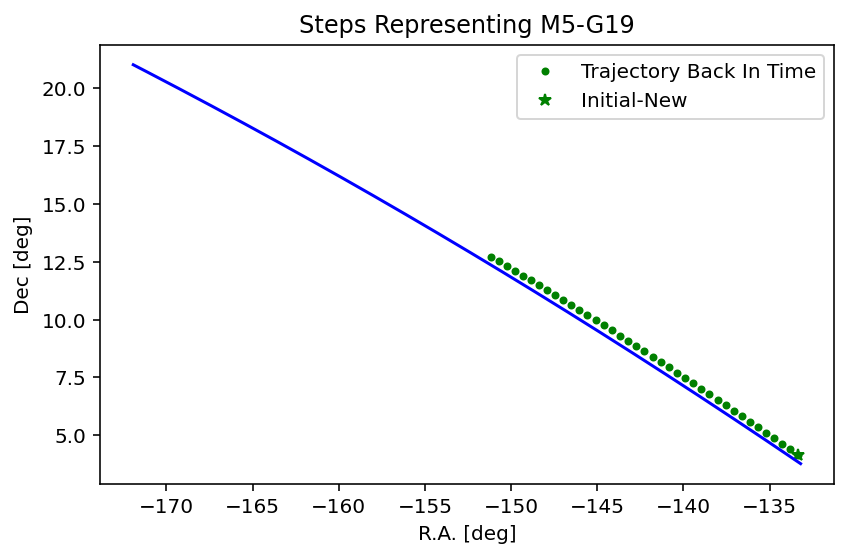

<Figure size 432x288 with 0 Axes>

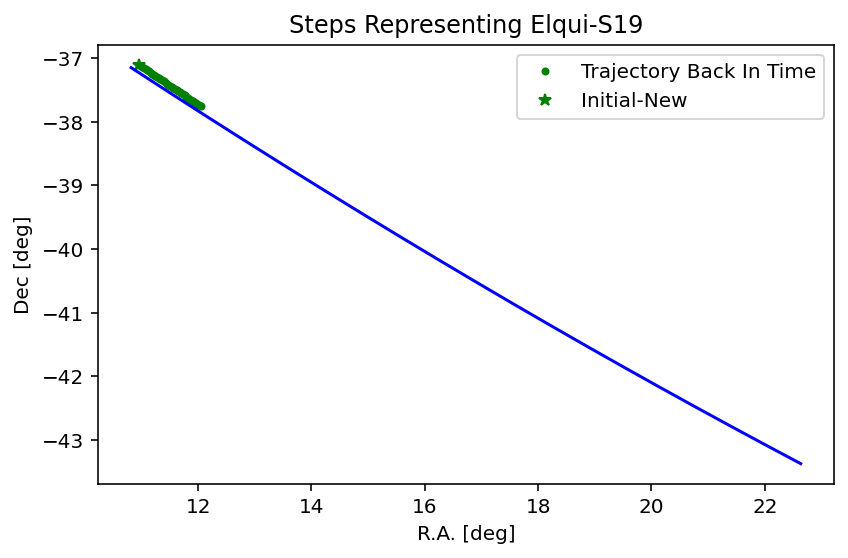

<Figure size 432x288 with 0 Axes>

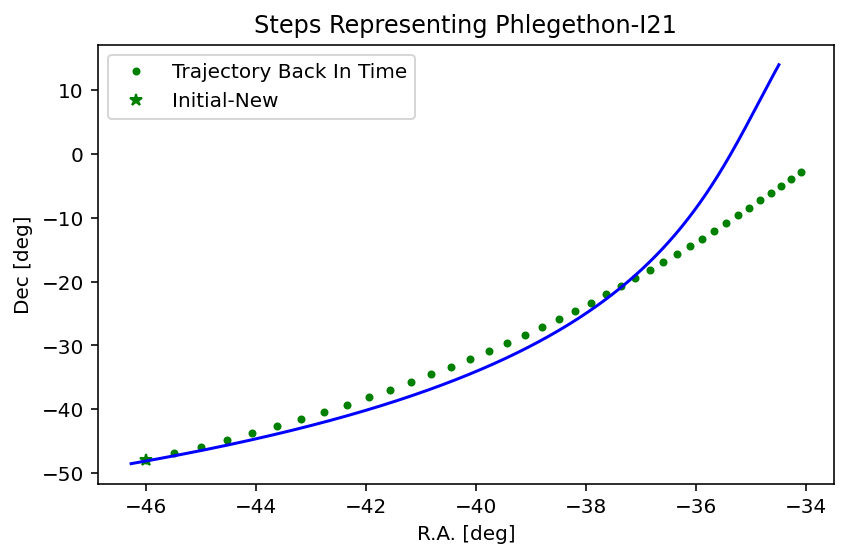

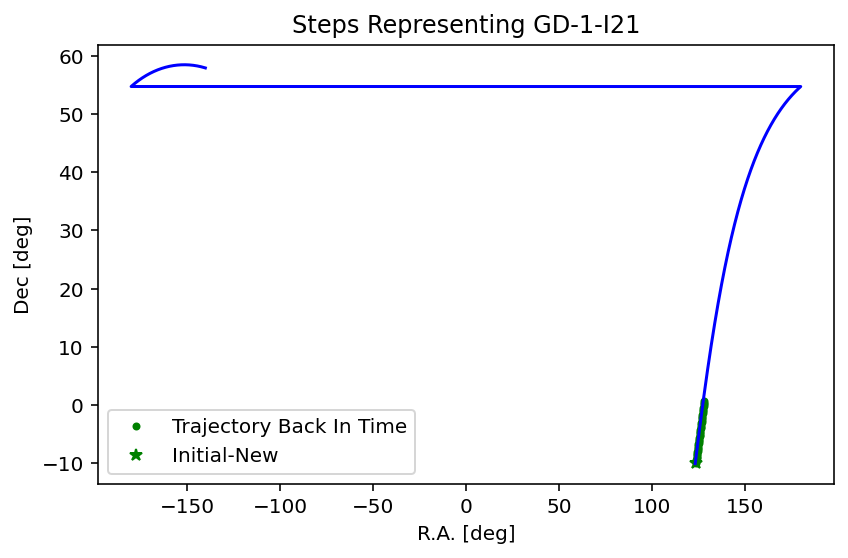

In [23]:
#Using the number of steps forward in time from the cell above. We redefine a starting point 
#Then we itierate backwards in time to see how many points are needed to represent a stream

coord.galactocentric_frame_defaults.set('v4.0')
gc_frame = coord.Galactocentric()
ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
                                     r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))

for i in range(len(names)):
    if list(names.values())[i] != 'None':
        c = coord.SkyCoord(ra=streams.iloc[i][1]*u.deg, dec=streams.iloc[i][2]*u.deg, distance=streams.iloc[i][3]*u.kpc, 
                           pm_ra_cosdec=streams.iloc[i][4]*u.mas/u.yr,pm_dec=streams.iloc[i][5]*u.mas/u.yr, 
                           radial_velocity=streams.iloc[i][6]*u.km/u.s, frame='icrs')
        w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)

        name=list(names.values())[i] 
        
        plt.figure()
        dt = 0.2*u.Myr
        if type(list(Nstep_foward_dict.values())[i]) != str:
            Nstep_foward = list(Nstep_foward_dict.values())[i]
            orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
            orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())

            w0_start = gd.PhaseSpacePosition(orbit_foward.pos[-1], orbit_foward.vel[-1])
            Nstep = 38 #this is a value to guess 
            orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
            orbit_sky = orbit.to_coord_frame(coord.ICRS())

            plt.plot(orbit_sky.ra.wrap_at(180*u.deg), orbit_sky.dec, '.g', label='Trajectory Back In Time')
            plt.plot(orbit_sky.ra.wrap_at(180*u.deg)[0], orbit_sky.dec[0], '*g', label='Initial-New')
            plt.plot(mwsts[name].track.ra.wrap_at(180*u.deg), mwsts[name].track.dec, 'b-')
            plt.legend(loc='best')
            plt.title('Steps Representing '+name)
            plt.xlabel('R.A. [deg]')
            plt.ylabel('Dec [deg]')
            plt.tight_layout()
            #plt.savefig('Creating_Streams_Steps/New_Trajectory/'+name+'_New_Initial_Pos.png', transparent=False, dpi=200)

            

All of this data is now used for the large function below

## Creating and Running Function for Distance, Time, and Velocity

In [24]:
# coord.galactocentric_frame_defaults.set('v4.0')
# gc_frame = coord.Galactocentric()
# ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
#                                      r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))

# def Closest_Dist_Time_Vel(streams):
#     #Information for Stream 
#     closest = pd.DataFrame()
#     #first check if number of steps are a float and defined
#     for stream in range(len(names)):
#         if ((list(names.values())[i] != 'None') & (list(Nstep_foward_dict.values())[i] != 'None') 
#                                                 & (list(Nstep_foward_dict.values())[i] !='Unknown')):
            
            
#             c = coord.SkyCoord(ra=streams.iloc[stream][1]*u.deg, dec=streams.iloc[stream][2]*u.deg, distance=streams.iloc[stream][3]*u.kpc, 
#                                pm_ra_cosdec=streams.iloc[stream][4]*u.mas/u.yr,pm_dec=streams.iloc[stream][5]*u.mas/u.yr, 
#                                radial_velocity=streams.iloc[stream][6]*u.km/u.s, frame='icrs')
#             w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)

            
            
#             dt = 0.2*u.Myr #this is the time step of integration
#             Nstep_foward = list(Nstep_foward_dict.values())[stream]
#             orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
#             orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())

#             w0_start = gd.PhaseSpacePosition(orbit_foward.pos, orbit_foward.vel)
#             Nstep = list(Nstep_represent_dict.values())[stream] 
#             orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
#             orbit_sky = orbit.to_coord_frame(coord.ICRS())
            
            
#             #Going back for 1 Gyr 
#             Nstep_long = 1000
#             orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)

    
#             #create a pd where every stream info will be stored: this creates the rows
#             data_new = {'Stream':[str(streams.iloc[stream]['Stream'])]}
#             data_temp = pd.DataFrame(data=data_new)
            
            
            
#             for subh in range(len(trot['x'])): #subh stands for individual subhalo
                
#                 Npoint = np.shape(orbit_long.pos)[1]
#                 shape = np.shape(orbit_long.pos)
#                 #creating individual arrays to store information 
#                 distances_x = np.empty(shape)
#                 distances_y = np.empty(shape)
#                 distances_z = np.empty(shape)
#                 vel_x = np.empty(shape)
#                 vel_y = np.empty(shape)
#                 vel_z = np.empty(shape)
                
                
#                 for point in range(Npoint):
#                     distances_x[:, point] = orbit_long.pos.x[:,point] - rot_orbits[subh,:,0]*u.kpc
#                     distances_y[:, point] = orbit_long.pos.y[:,point] - rot_orbits[subh,:,1]*u.kpc
#                     distances_z[:, point] = orbit_long.pos.z[:,point] - rot_orbits[subh,:,2]*u.kpc

#                 rel_dist = np.sqrt((distances_x**2)+(distances_y**2)+(distances_z**2)) 
            
#                 nrow = rel_dist.shape[0]
#                 ncol = rel_dist.shape[1]
#                 ind_min = np.argmin(rel_dist)
#                 ind_min_time = ind_min//ncol
#                 ind_min_dist = ind_min%ncol

#                 #For time of nearest approach
#                 time_occurance = -dt * ind_min_time

#                 closest_dist2 = rel_dist[ind_min_time, ind_min_dist]
#                 delta_vx = orbit_long.vel.d_x.to(u.km/u.s)[ind_min_time,ind_min_dist].value - rot_orbits_vel[subh,ind_min_time,0]
#                 delta_vy = orbit_long.vel.d_y.to(u.km/u.s)[ind_min_time,ind_min_dist].value - rot_orbits_vel[subh,ind_min_time,1]
#                 delta_vz = orbit_long.vel.d_z.to(u.km/u.s)[ind_min_time,ind_min_dist].value - rot_orbits_vel[subh,ind_min_time,2]
#                 rel_vel = np.sqrt(delta_vx**2 + delta_vy**2 + delta_vz**2)
    
#                 data_temp['Subhalo_'+ str(subh)+ ' Distance (kpc)'] = [closest_dist2]
#                 data_temp['Subhalo_'+ str(subh)+ ' Time (Myr)'] = [time_occurance]
#                 data_temp['Subhalo_'+ str(subh)+ ' Relative Velocity (km/s)'] = [rel_vel]

#             closest = closest.append(data_temp, ignore_index=True)
#     return closest




In [25]:
coord.galactocentric_frame_defaults.set('v4.0')
gc_frame = coord.Galactocentric()
ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
                                     r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))

def Closest_Dist_Time_Vel(streams):
    closest = pd.DataFrame()
    #first check if number of steps are a float and defined
    for stream in range(len(names)):
        if ((list(names.values())[stream] != 'None') & (list(Nstep_foward_dict.values())[stream] != 'None') 
                                        & (list(Nstep_foward_dict.values())[stream] !='Unknown')):
            #Now we get the orbits of the streams 
            c = coord.SkyCoord(ra=streams.iloc[stream][1]*u.deg, dec=streams.iloc[stream][2]*u.deg, distance=streams.iloc[stream][3]*u.kpc, 
                               pm_ra_cosdec=streams.iloc[stream][4]*u.mas/u.yr,pm_dec=streams.iloc[stream][5]*u.mas/u.yr, 
                               radial_velocity=streams.iloc[stream][6]*u.km/u.s, frame='icrs')

            w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)
            dt = 0.2*u.Myr
            Nstep_foward = list(Nstep_foward_dict.values())[stream]
            orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
            orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())
            w0_start = gd.PhaseSpacePosition(orbit_foward.pos, orbit_foward.vel)
            Nstep = list(Nstep_represent_dict.values())[stream] 
            orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
            Nstep_long = 1000 #Going back for 1 Gyr - Anything past this, we anticipate a progenitor
            orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)


            data_new = {'Stream':[str(streams.iloc[stream]['Stream'])]}
            data_temp = pd.DataFrame(data=data_new)

            for subh in range(len(trot['x'])): #subh stands for individual subhalo len(trot['x']) = 1062
                Npoint = np.shape(orbit_long.pos)[1]
                shape = np.shape(orbit_long.pos)
                #creating individual arrays to store information 
                distances_x = np.empty(shape)
                distances_y = np.empty(shape)
                distances_z = np.empty(shape)
#                 velocity_x = np.empty(shape)
#                 velocity_y = np.empty(shape)
#                 velocity_z = np.empty(shape)

            ########## creating a temporary array that stores the location of the stars in the stream  ########
            #taking the distance from a given stream point to the subhalos#
                for point in range(Npoint):

                    distances_x[:, point] = orbit_long.pos.x.to(u.kpc)[:,point] - rot_orbits[subh,:,0]*u.kpc
                    distances_y[:, point] = orbit_long.pos.y.to(u.kpc)[:,point] - rot_orbits[subh,:,1]*u.kpc
                    distances_z[:, point] = orbit_long.pos.z.to(u.kpc)[:,point] - rot_orbits[subh,:,2]*u.kpc

#                     velocity_x[:, point] = orbit_long.vel.d_x.to(u.km/u.s)[:,point] - rot_orbits_vel[subh,:,0]*(u.km/u.s)
#                     velocity_y[:, point] = orbit_long.vel.d_y.to(u.km/u.s)[:,point] - rot_orbits_vel[subh,:,1]*(u.km/u.s)
#                     velocity_z[:, point] = orbit_long.vel.d_z.to(u.km/u.s)[:,point] - rot_orbits_vel[subh,:,2]*(u.km/u.s)
                    
                rel_dist = np.sqrt((distances_x**2)+(distances_y**2)+(distances_z**2)) 
            
                nrow = rel_dist.shape[0]
                ncol = rel_dist.shape[1]
                ind_min = np.argmin(rel_dist)
                ind_min_time = ind_min//ncol
                ind_min_dist = ind_min%ncol

                #For time of nearest approach
                time_occurance = -dt * ind_min_time

                closest_dist2 = rel_dist[ind_min_time, ind_min_dist]
                delta_vx = orbit_long.vel.d_x.to(u.km/u.s)[ind_min_time,ind_min_dist].value - rot_orbits_vel[subh,ind_min_time,0]
                delta_vy = orbit_long.vel.d_y.to(u.km/u.s)[ind_min_time,ind_min_dist].value - rot_orbits_vel[subh,ind_min_time,1]
                delta_vz = orbit_long.vel.d_z.to(u.km/u.s)[ind_min_time,ind_min_dist].value - rot_orbits_vel[subh,ind_min_time,2]
                rel_vel = np.sqrt(delta_vx**2 + delta_vy**2 + delta_vz**2)
    
                data_temp['Subhalo_'+ str(subh)+ ' Distance (kpc)'] = [closest_dist2]
                data_temp['Subhalo_'+ str(subh)+ ' Time (Myr)'] = [time_occurance]
                data_temp['Subhalo_'+ str(subh)+ ' Relative Velocity (km/s)'] = [rel_vel]

            closest = closest.append(data_temp, ignore_index=True)
    return closest
                    
                

### This function saves the closest encounter between the subhalo and stream, along with its relative velocity and time of encounter.

In [26]:
# pb_test = Closest_Dist_Time_Vel(streams)

In [27]:
# pb_past = pd.read_csv('Closest_Distance_Subhalo_to_All_Streams.csv')
# pb_past = pb_past.drop("Unnamed: 0",axis=1)

# pb_test.to_csv('Closest_Distance_Time_Vel_perSubhalo_to_All_Streams.csv', index=False)
pb = pd.read_csv('Closest_Distance_Time_Vel_perSubhalo_to_All_Streams.csv')

In [28]:
pb

,Stream,Subhalo_0 Distance (kpc),Subhalo_0 Time (Myr),Subhalo_0 Relative Velocity (km/s),Subhalo_1 Distance (kpc),Subhalo_1 Time (Myr),Subhalo_1 Relative Velocity (km/s),Subhalo_2 Distance (kpc),Subhalo_2 Time (Myr),Subhalo_2 Relative Velocity (km/s),...,Subhalo_1058 Relative Velocity (km/s),Subhalo_1059 Distance (kpc),Subhalo_1059 Time (Myr),Subhalo_1059 Relative Velocity (km/s),Subhalo_1060 Distance (kpc),Subhalo_1060 Time (Myr),Subhalo_1060 Relative Velocity (km/s),Subhalo_1061 Distance (kpc),Subhalo_1061 Time (Myr),Subhalo_1061 Relative Velocity (km/s)
0,Gjoll,94.051296,-0.0 Myr,412.461911,61.996427,-0.0 Myr,661.803658,44.863267,-0.0 Myr,736.410325,...,58.817230,93.515077,-0.0 Myr,408.898194,55.168300,-44.2 Myr,458.903915,174.313123,-99.4 Myr,241.520126
1,Leiptr,94.290280,-0.0 Myr,432.795644,66.160983,-0.0 Myr,695.475028,49.475181,-0.0 Myr,749.193348,...,59.548735,95.452994,-0.0 Myr,443.718931,57.542537,-42.0 Myr,519.147458,169.067592,-153.0 Myr,243.057715
2,Hrid,101.451584,-200.0 Myr,135.732037,56.390540,-0.0 Myr,287.200537,48.916353,-0.0 Myr,383.475955,...,485.530640,91.767822,-0.0 Myr,308.485557,56.731402,-0.0 Myr,91.068230,179.634747,-0.0 Myr,479.392631
3,Pal5,96.546175,-0.0 Myr,253.231923,52.845049,-0.0 Myr,381.126529,32.986898,-0.0 Myr,385.236203,...,195.517934,103.665467,-0.0 Myr,292.574847,63.681240,-102.4 Myr,407.470188,190.352891,-0.0 Myr,240.350790
4,Gaia_1,95.758795,-0.0 Myr,554.807028,56.828223,-43.2 Myr,455.941144,43.863928,-0.0 Myr,574.952068,...,339.144390,98.138456,-0.0 Myr,468.918728,59.153508,-47.6 Myr,490.005371,174.479150,-102.4 Myr,362.558275
5,Ylgr,90.760810,-0.0 Myr,397.369242,64.651951,-0.0 Myr,617.243850,41.368617,-0.0 Myr,601.729429,...,176.548770,102.617730,-0.0 Myr,508.935139,67.524220,-13.600000000000001 Myr,572.632314,177.730459,-114.60000000000001 Myr,251.890508
6,Fjorm,79.464190,-200.0 Myr,52.092325,54.034442,-0.0 Myr,492.642878,47.847635,-0.0 Myr,387.008691,...,559.166077,90.782961,-0.0 Myr,615.043796,55.652807,-0.0 Myr,474.272614,177.279055,-0.0 Myr,398.949530
7,Kshir,103.241661,-0.0 Myr,320.292077,55.575655,-0.0 Myr,377.447038,45.963715,-0.0 Myr,450.550283,...,211.273621,93.974489,-0.0 Myr,257.418784,58.070538,-60.800000000000004 Myr,215.854137,176.507700,-11.4 Myr,330.483772
8,Gunnthra,99.896958,-0.0 Myr,242.540859,59.592260,-0.0 Myr,425.519024,49.160239,-0.0 Myr,504.525796,...,174.278192,93.419689,-0.0 Myr,205.348268,55.249277,-47.0 Myr,231.045787,185.545163,-0.0 Myr,286.136062
9,Slidr,95.270778,-51.800000000000004 Myr,313.907427,60.587302,-0.0 Myr,281.513111,47.013554,-0.0 Myr,113.935924,...,568.566694,95.052182,-0.0 Myr,566.848588,60.168838,-0.0 Myr,436.567895,183.215981,-0.0 Myr,475.240040


## Velocity vs Distance Graph

<ipython-input-29-6c73f899f278>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


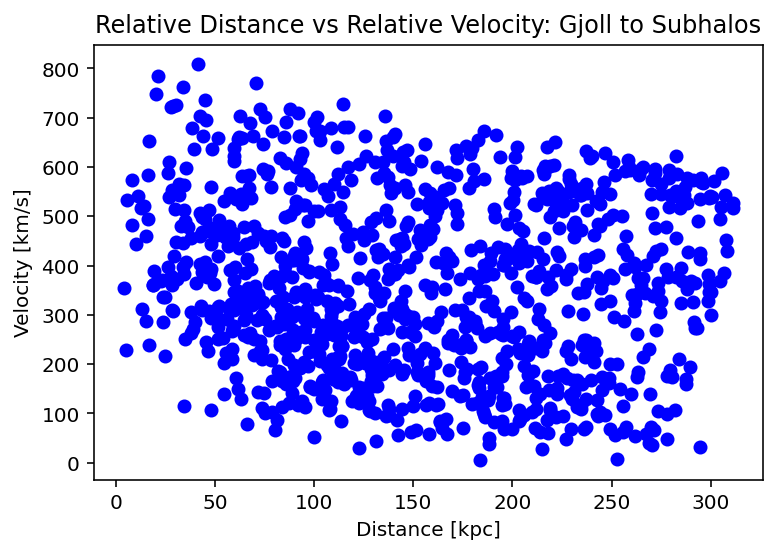

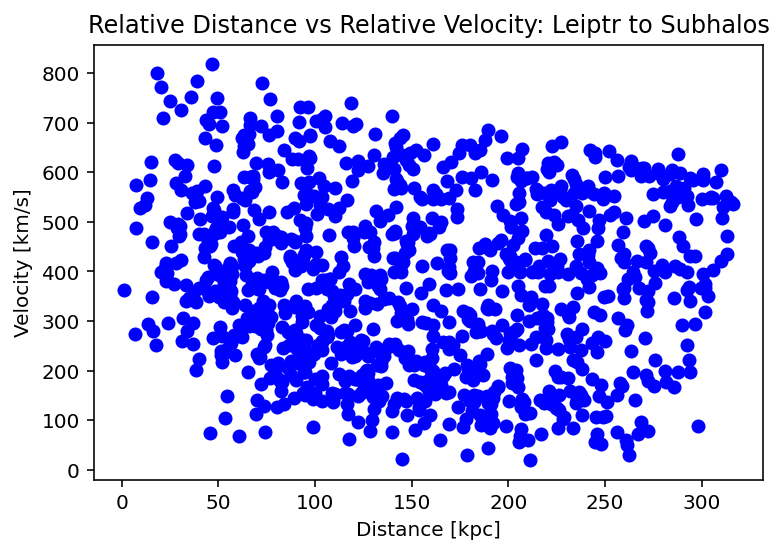

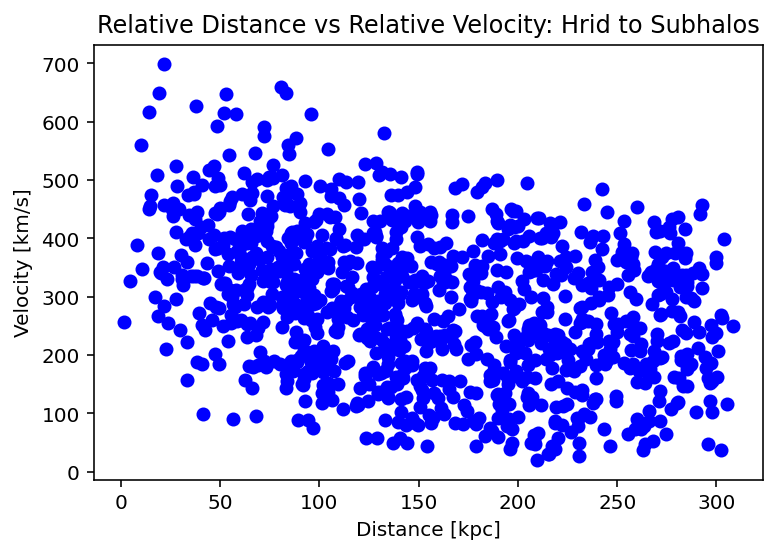

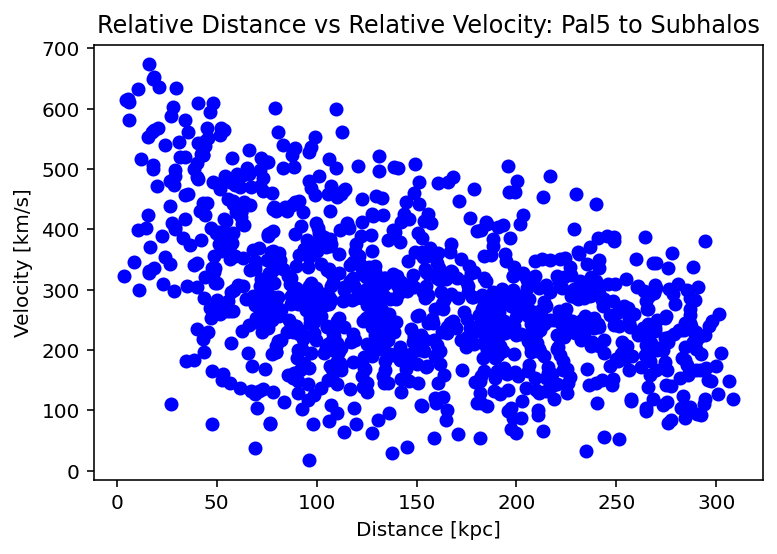

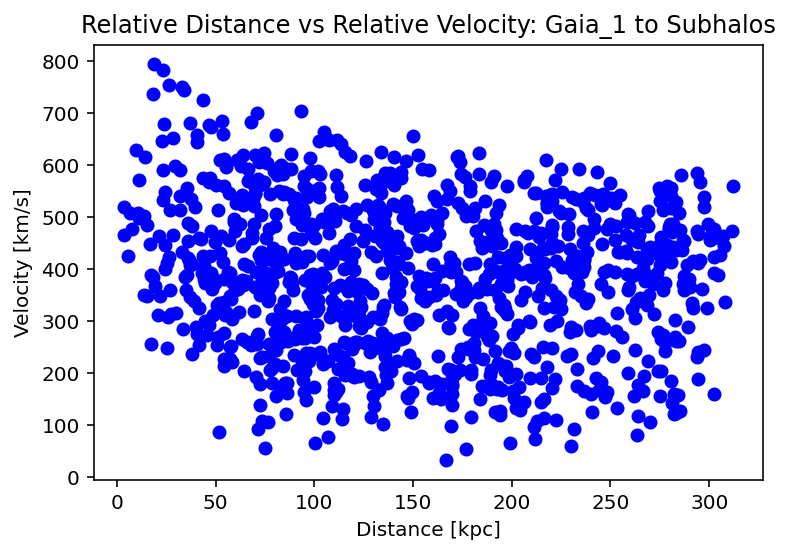

...

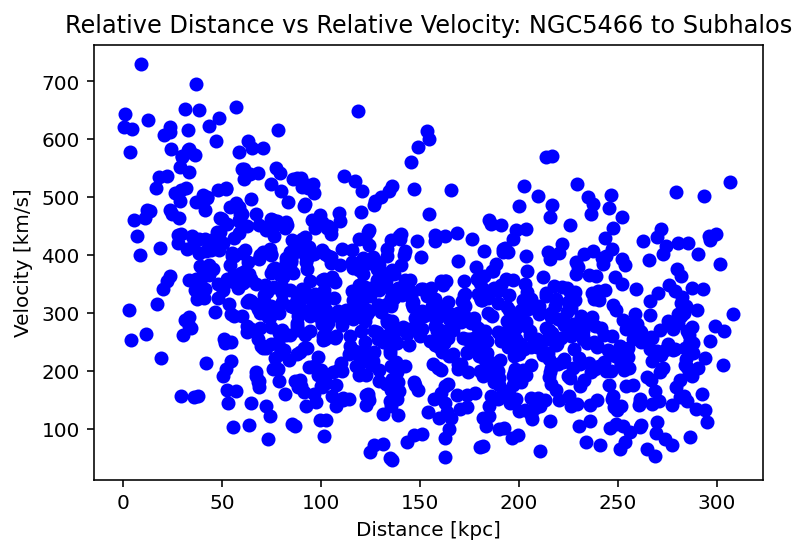

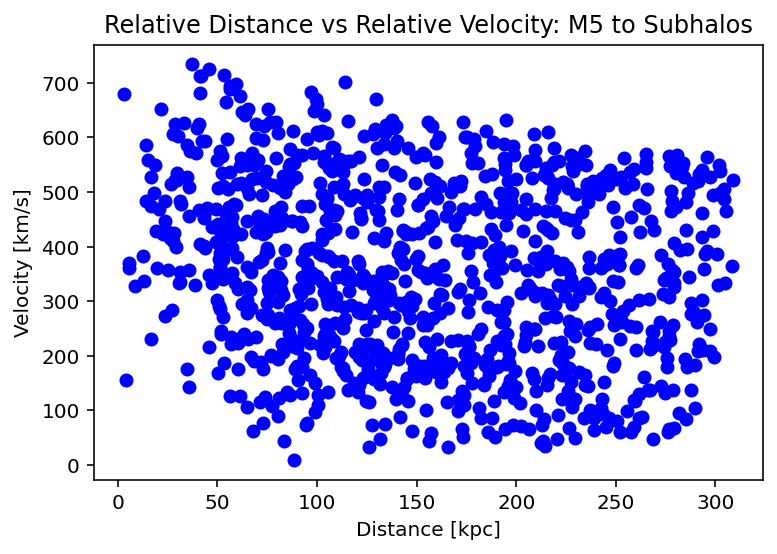

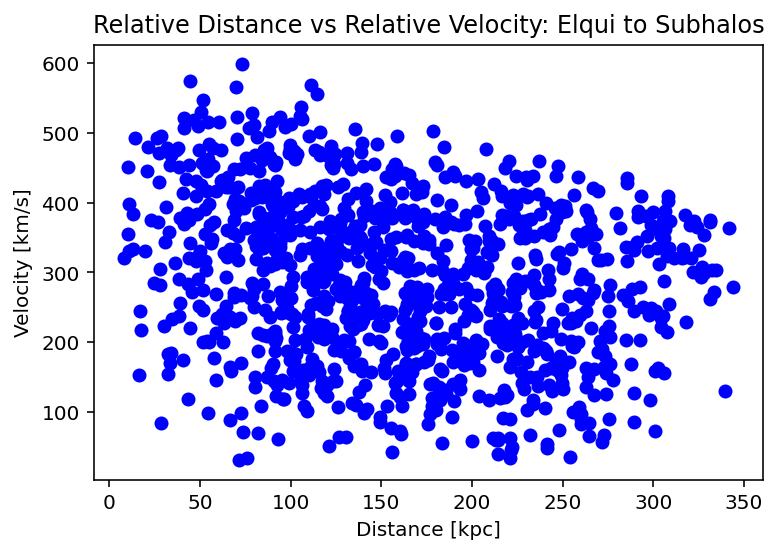

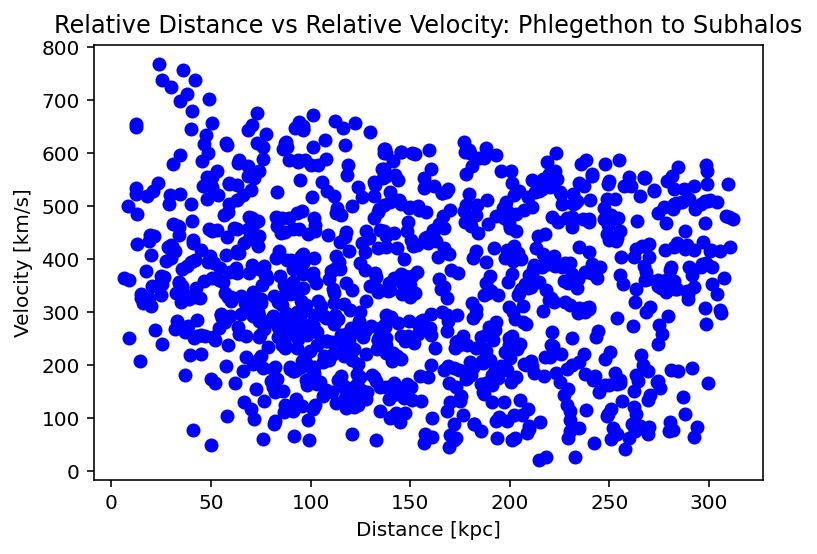

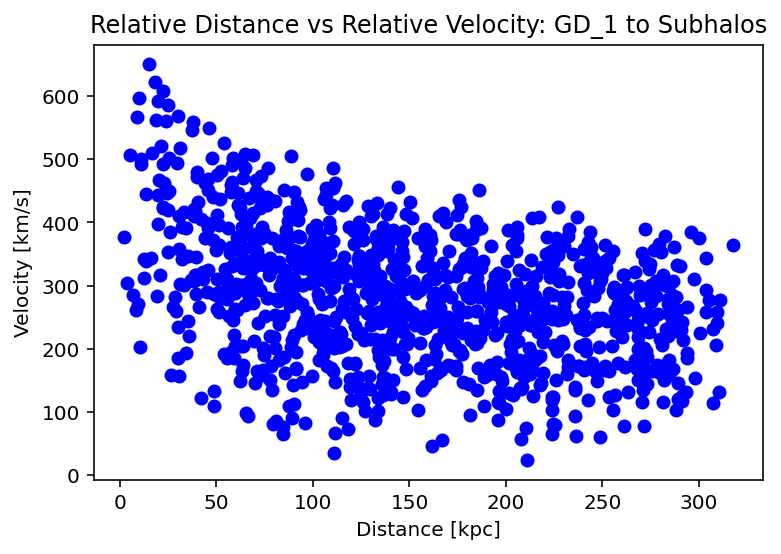

In [29]:
#Creating Visualization of Subhalo impact on streams (distance vs velocity kick)
for i in range(len(pb)):
    plt.figure()
    for subh in range(len(trot)):
        plt.scatter(pb['Subhalo_'+str(subh)+' Distance (kpc)'][i],pb['Subhalo_'+str(subh)+' Relative Velocity (km/s)'][i], color='blue') 
    plt.xlabel('Distance [kpc]')
    plt.ylabel('Velocity [km/s]')
    plt.title('Relative Distance vs Relative Velocity: '+str(pb.iloc[i][0])+' to Subhalos')
    plt.savefig('Distance_vs_Velocity/'+str(pb.iloc[i][0])+'.png', transparent=False, dpi=200)
    
#Trend looks like an exponential decay.

## Calculation of Vel Kick Experienced During Closest Approach

In [30]:
np.array(pb.iloc[i][1::3])*u.kpc

<Quantity [ 93.47917181,  60.33041643,  45.27867628, ...,  97.10922046,
            62.14820851, 179.37924814] kpc>

<ipython-input-31-1f6284f227ae>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<Quantity [ 63.30490919,  56.58128263,  90.05672409, 101.80877343,
            87.27025592,  65.28533946,  78.65105353, 102.62283516,
            98.89298068, 175.46200777,  85.84116897,  43.78298354,
            55.14320355, 180.4750698 , 223.58132168,  99.16751222,
            59.57097873,  75.68128141, 154.00858263,  74.67793203,
           114.03651478,  57.19171921,  39.25863458,  65.60054382,
           115.25016898] km / s>

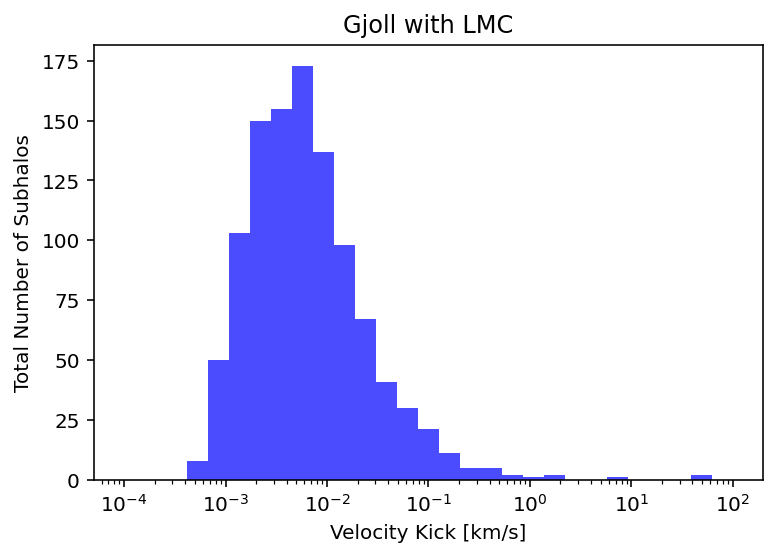

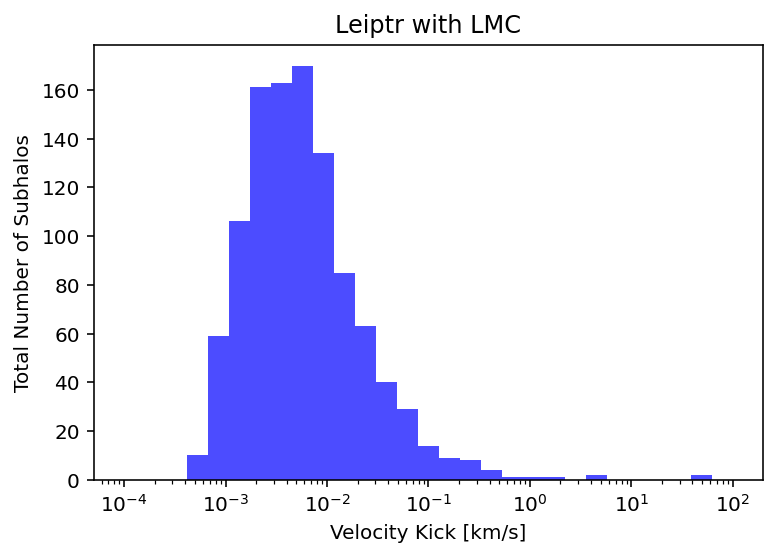

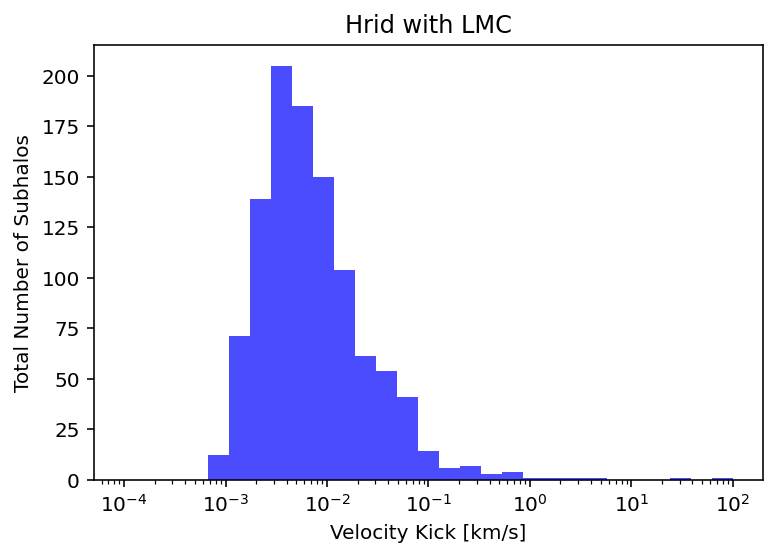

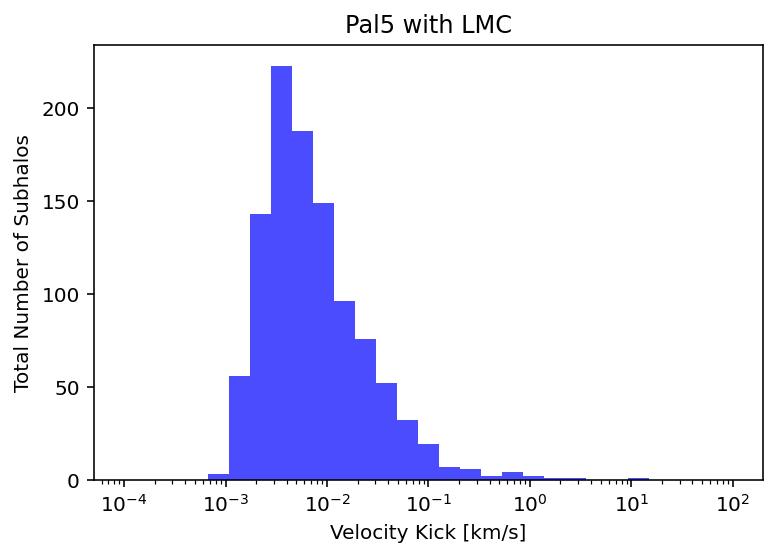

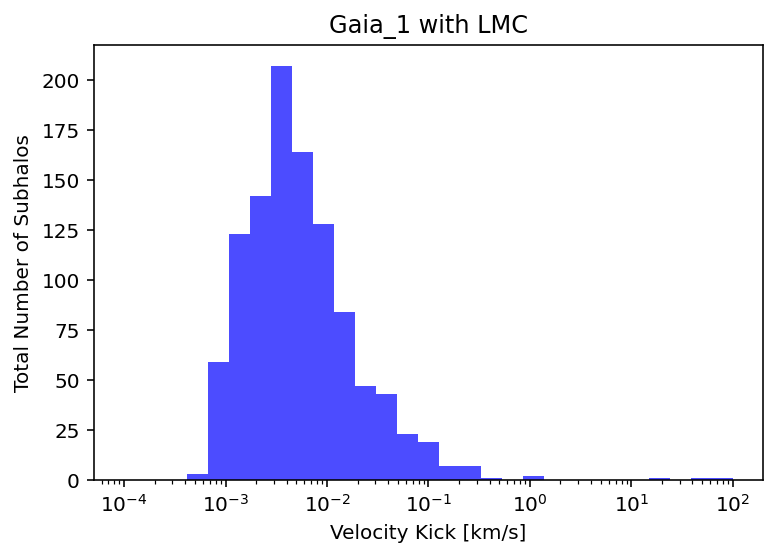

...

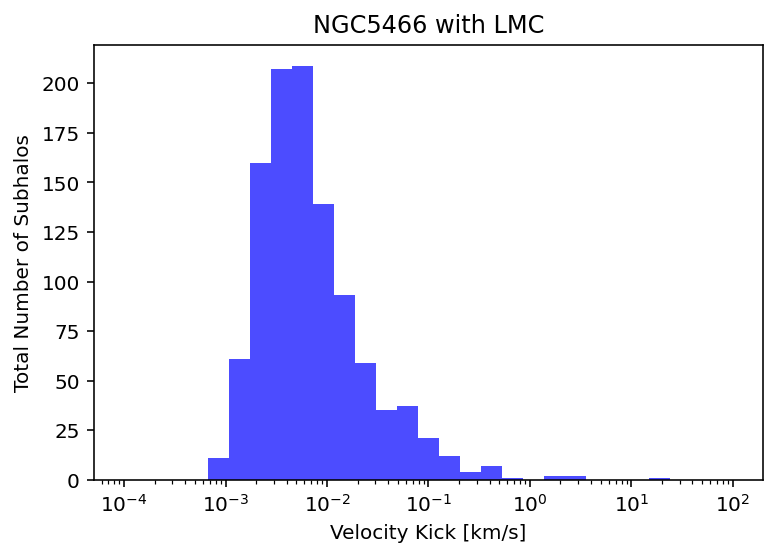

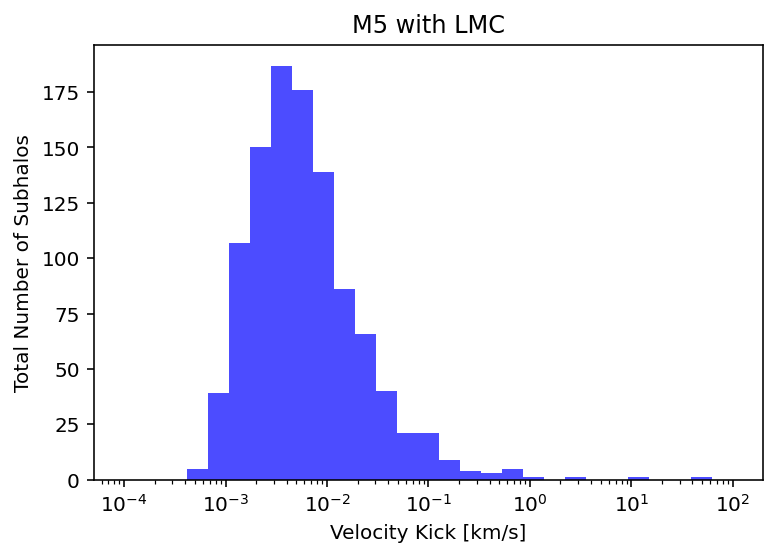

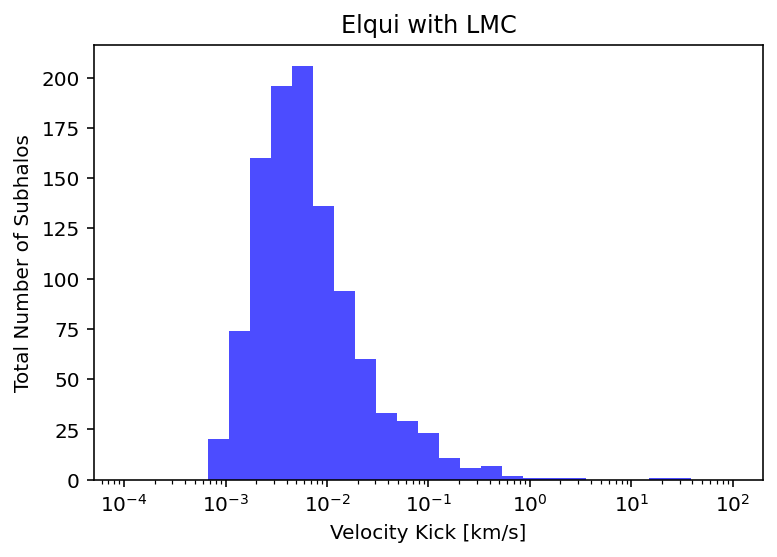

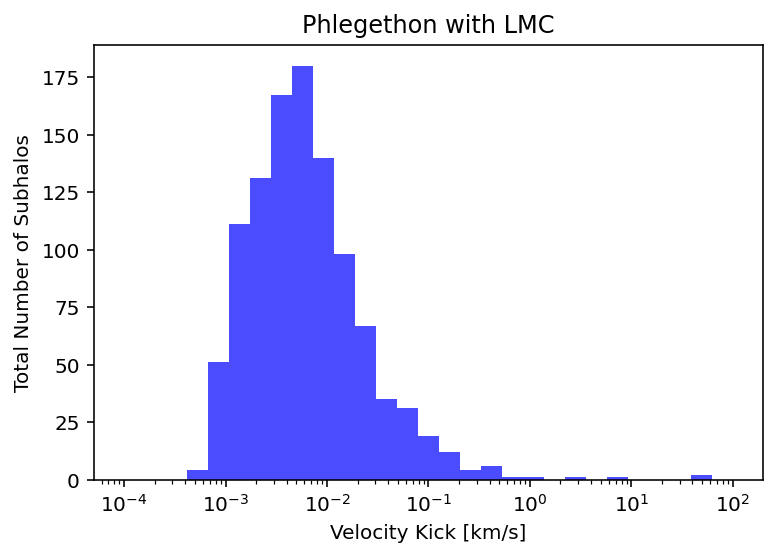

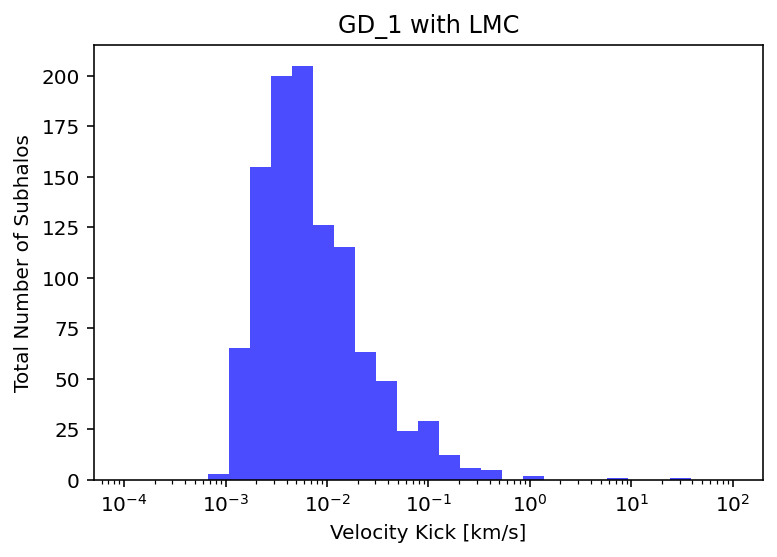

In [31]:
#Calculation of Velocity Kick WITH LMC
vel_kick = (np.empty(len(pb)))*(u.km/u.s)#*(u.m**3*u.M_sun/(u.kg*u.km*u.kpc*u.s))
#there are 1062 contributions to velocity changes per stream
data_all = pd.DataFrame()
for i in range(len(pb)): #iterating through every stream 
    #Calculating Velocity Kick 
    G = (6.6743*10**(-11))*(u.m**3/(u.kg*u.s**2)) #gravitational constant
    r_min = np.array(pb.iloc[i][1::3])*u.kpc  #smallest relative distance between subhalos and stream 
    v_rel = np.array(pb.iloc[i][3::3])*(u.km/u.s) #relative velocity btwn stream and subhalos 
    mass_subh = (np.array(ts[ind_massive]['mvir']))*u.M_sun #mass of subhalos
    delta_v = 2*G*mass_subh/(r_min*v_rel) 

    plt.figure()
    delta_v_km_new = delta_v.to(u.km/u.s)
    plt.hist(delta_v_km_new.value, bins=np.logspace(-4,2,30) , color='blue', alpha=0.7)
    plt.gca().set_xscale('log') 
    plt.xlabel('Velocity Kick [km/s]')
    plt.ylabel('Total Number of Subhalos')
    plt.title(str(pb.iloc[i][0])+' with LMC')
    plt.savefig('Vel_Kick_Histogram_with_LMC/'+str(pb.iloc[i][0])+'.png', transparent=False, dpi=200)
    
    
    vel_kick_temp = np.sqrt(np.sum(delta_v_km_new**2))
    vel_kick[i] = vel_kick_temp
vel_kick



In [32]:
pb

,Stream,Subhalo_0 Distance (kpc),Subhalo_0 Time (Myr),Subhalo_0 Relative Velocity (km/s),Subhalo_1 Distance (kpc),Subhalo_1 Time (Myr),Subhalo_1 Relative Velocity (km/s),Subhalo_2 Distance (kpc),Subhalo_2 Time (Myr),Subhalo_2 Relative Velocity (km/s),...,Subhalo_1058 Relative Velocity (km/s),Subhalo_1059 Distance (kpc),Subhalo_1059 Time (Myr),Subhalo_1059 Relative Velocity (km/s),Subhalo_1060 Distance (kpc),Subhalo_1060 Time (Myr),Subhalo_1060 Relative Velocity (km/s),Subhalo_1061 Distance (kpc),Subhalo_1061 Time (Myr),Subhalo_1061 Relative Velocity (km/s)
0,Gjoll,94.051296,-0.0 Myr,412.461911,61.996427,-0.0 Myr,661.803658,44.863267,-0.0 Myr,736.410325,...,58.817230,93.515077,-0.0 Myr,408.898194,55.168300,-44.2 Myr,458.903915,174.313123,-99.4 Myr,241.520126
1,Leiptr,94.290280,-0.0 Myr,432.795644,66.160983,-0.0 Myr,695.475028,49.475181,-0.0 Myr,749.193348,...,59.548735,95.452994,-0.0 Myr,443.718931,57.542537,-42.0 Myr,519.147458,169.067592,-153.0 Myr,243.057715
2,Hrid,101.451584,-200.0 Myr,135.732037,56.390540,-0.0 Myr,287.200537,48.916353,-0.0 Myr,383.475955,...,485.530640,91.767822,-0.0 Myr,308.485557,56.731402,-0.0 Myr,91.068230,179.634747,-0.0 Myr,479.392631
3,Pal5,96.546175,-0.0 Myr,253.231923,52.845049,-0.0 Myr,381.126529,32.986898,-0.0 Myr,385.236203,...,195.517934,103.665467,-0.0 Myr,292.574847,63.681240,-102.4 Myr,407.470188,190.352891,-0.0 Myr,240.350790
4,Gaia_1,95.758795,-0.0 Myr,554.807028,56.828223,-43.2 Myr,455.941144,43.863928,-0.0 Myr,574.952068,...,339.144390,98.138456,-0.0 Myr,468.918728,59.153508,-47.6 Myr,490.005371,174.479150,-102.4 Myr,362.558275
5,Ylgr,90.760810,-0.0 Myr,397.369242,64.651951,-0.0 Myr,617.243850,41.368617,-0.0 Myr,601.729429,...,176.548770,102.617730,-0.0 Myr,508.935139,67.524220,-13.600000000000001 Myr,572.632314,177.730459,-114.60000000000001 Myr,251.890508
6,Fjorm,79.464190,-200.0 Myr,52.092325,54.034442,-0.0 Myr,492.642878,47.847635,-0.0 Myr,387.008691,...,559.166077,90.782961,-0.0 Myr,615.043796,55.652807,-0.0 Myr,474.272614,177.279055,-0.0 Myr,398.949530
7,Kshir,103.241661,-0.0 Myr,320.292077,55.575655,-0.0 Myr,377.447038,45.963715,-0.0 Myr,450.550283,...,211.273621,93.974489,-0.0 Myr,257.418784,58.070538,-60.800000000000004 Myr,215.854137,176.507700,-11.4 Myr,330.483772
8,Gunnthra,99.896958,-0.0 Myr,242.540859,59.592260,-0.0 Myr,425.519024,49.160239,-0.0 Myr,504.525796,...,174.278192,93.419689,-0.0 Myr,205.348268,55.249277,-47.0 Myr,231.045787,185.545163,-0.0 Myr,286.136062
9,Slidr,95.270778,-51.800000000000004 Myr,313.907427,60.587302,-0.0 Myr,281.513111,47.013554,-0.0 Myr,113.935924,...,568.566694,95.052182,-0.0 Myr,566.848588,60.168838,-0.0 Myr,436.567895,183.215981,-0.0 Myr,475.240040


In [33]:
#Calculation of Velocity Kick WITH LMC
vel_kick = (np.empty(len(pb)))*(u.km/u.s)#*(u.m**3*u.M_sun/(u.kg*u.km*u.kpc*u.s))
#there are 1062 contributions to velocity changes per stream
data_all = pd.DataFrame()
for i in range(len(pb)): #iterating through every stream 
    #Calculating Velocity Kick 
    G = (6.6743*10**(-11))*(u.m**3/(u.kg*u.s**2)) #gravitational constant
    r_min = np.array(pb.iloc[i][1::3])*u.kpc  #smallest relative distance between subhalos and stream 
    v_rel = np.array(pb.iloc[i][3::3])*(u.km/u.s) #relative velocity btwn stream and subhalos 
    mass_subh = (np.array(ts[ind_massive]['mvir']))*u.M_sun #mass of subhalos
    delta_v = 2*G*mass_subh/(r_min*v_rel) 
    vel_kick_temp = np.sqrt(np.sum(delta_v_km_new**2))
    vel_kick[i] = vel_kick_temp


In [34]:
vel_kick

<Quantity [115.25016898, 115.25016898, 115.25016898, 115.25016898,
           115.25016898, 115.25016898, 115.25016898, 115.25016898,
           115.25016898, 115.25016898, 115.25016898, 115.25016898,
           115.25016898, 115.25016898, 115.25016898, 115.25016898,
           115.25016898, 115.25016898, 115.25016898, 115.25016898,
           115.25016898, 115.25016898, 115.25016898, 115.25016898,
           115.25016898] km / s>

<ipython-input-35-86513bcc2b7b>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<Quantity [ 63.30487354,  56.58124658,  90.05652519, 101.80871762,
            87.27024213,  65.28529946,  78.64853325, 102.62280489,
            98.89292217, 175.46198613,  85.84107323,  43.78280381,
            55.14317258, 180.47505029, 223.58131109,  99.1674434 ,
            59.57096146,  75.68122039, 154.00856089,  74.67787601,
           114.03638915,  57.19159236,  39.25850263,  65.60052184,
           115.25014528] km / s>

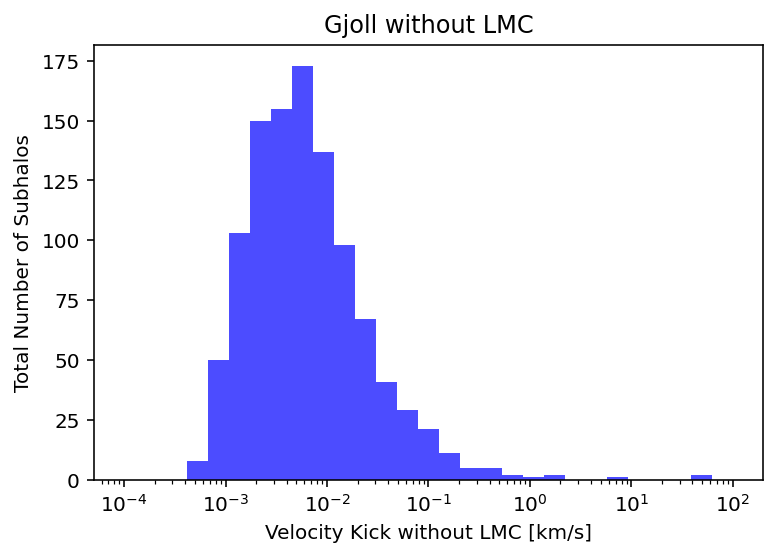

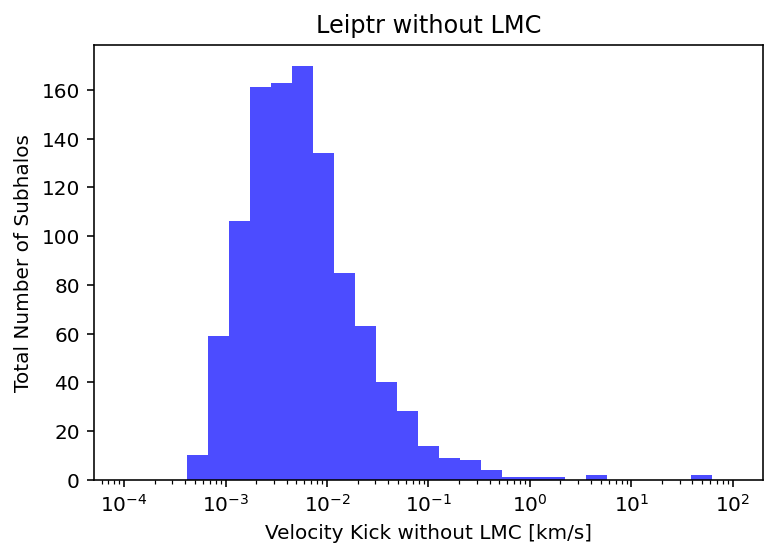

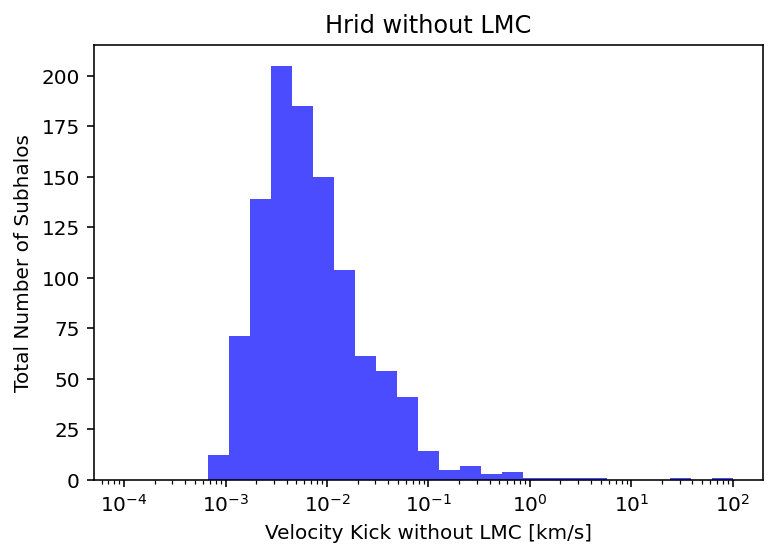

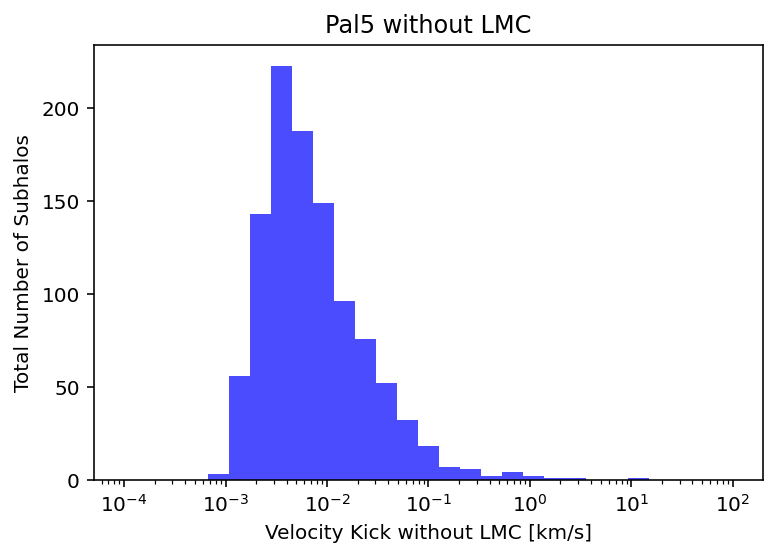

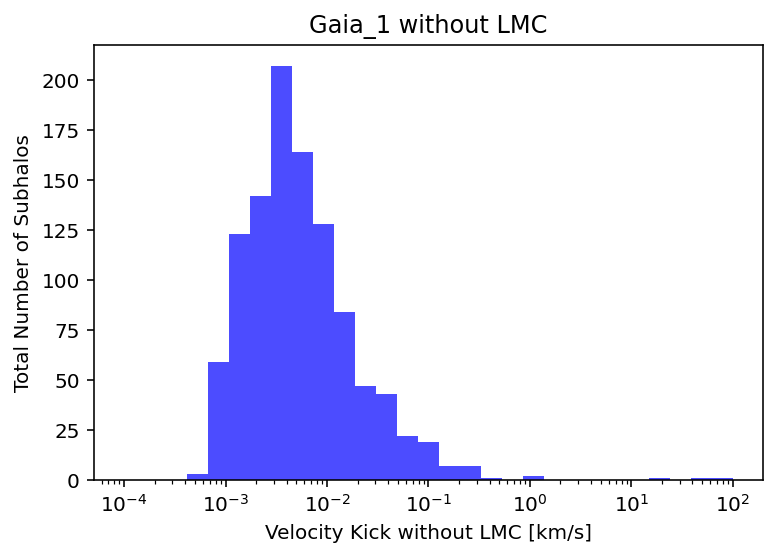

...

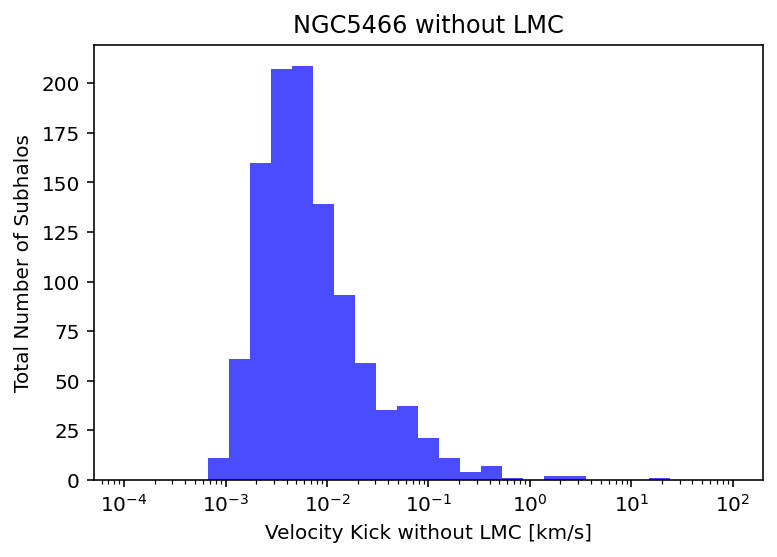

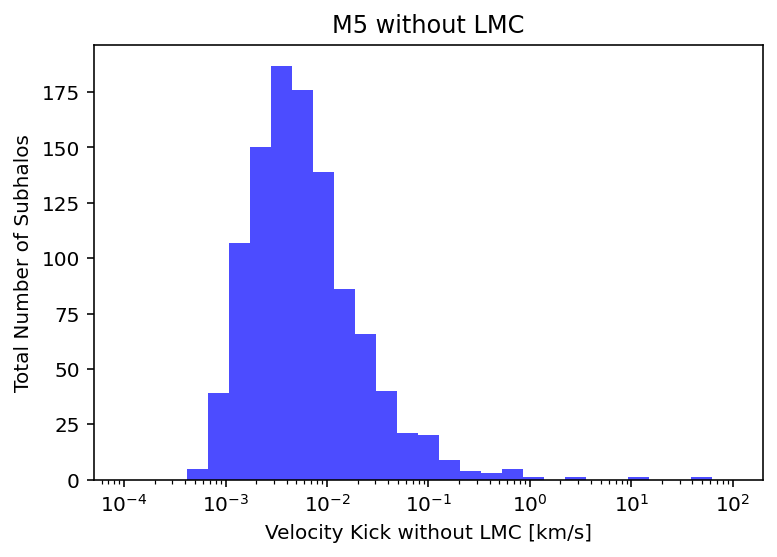

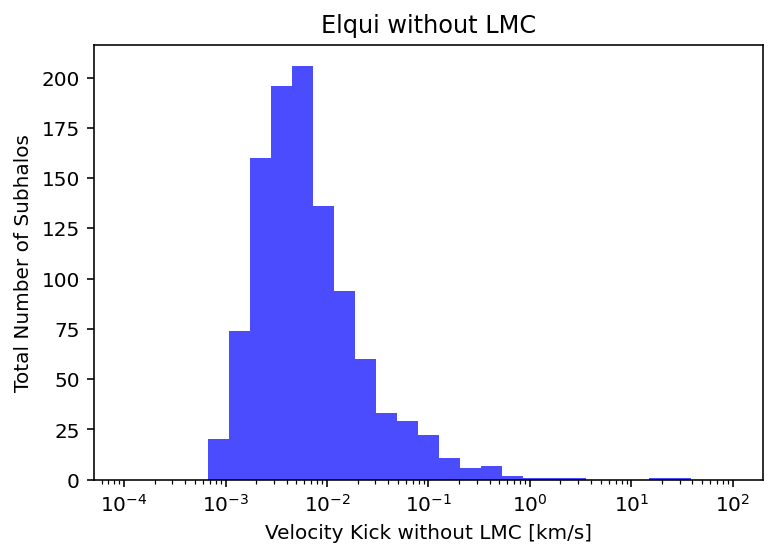

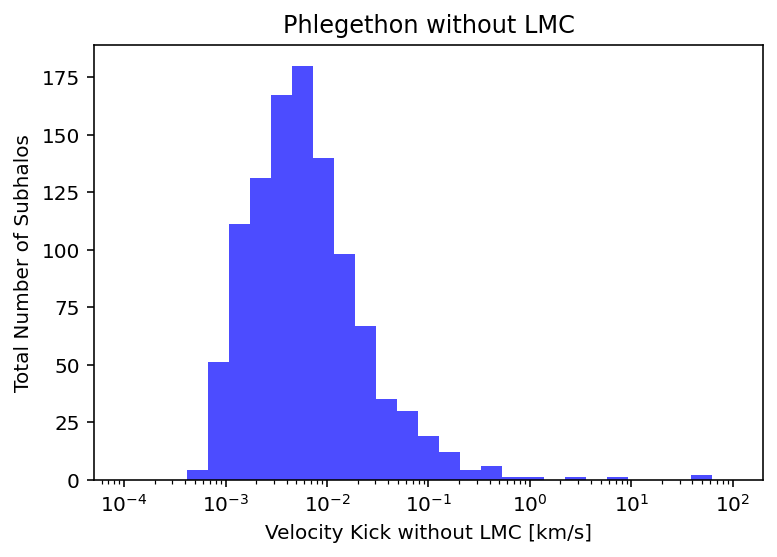

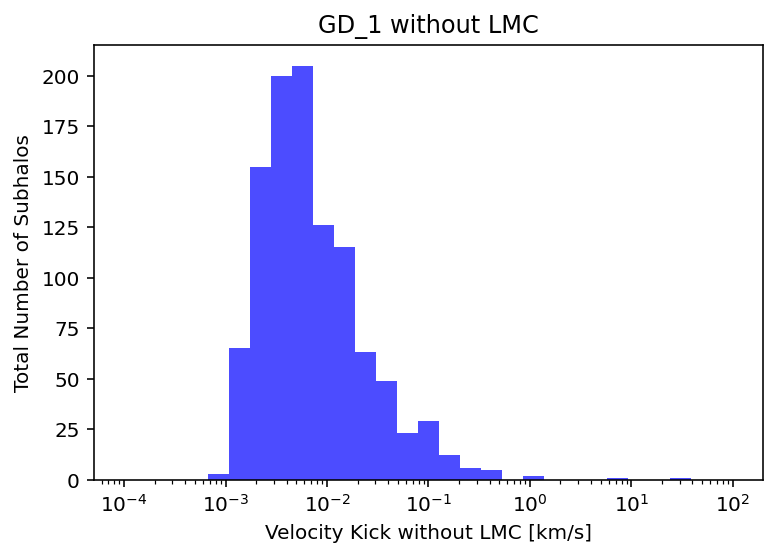

In [35]:
#Calculation of Velocity Kick Without LMC
vel_kick_no_LMC = (np.empty(len(pb)))*(u.km/u.s)#*(u.m**3*u.M_sun/(u.kg*u.km*u.kpc*u.s))
for i in range(len(pb)):
    #Calculating Velocity Kick 
    G = (6.6743*10**(-11))*(u.m**3/(u.kg*u.s**2)) #gravitational constant
    r_min = np.array(pb.iloc[i][1::3])*u.kpc  #smallest relative distance between subhalos and stream 
    v_rel = np.array(pb.iloc[i][3::3])*(u.km/u.s) #relative velocity btwn stream and subhalos 
    mass_subh = (np.array(ts[ind_massive]['mvir']))*u.M_sun #mass of subhalos
    delta_v = 2*G*mass_subh/(r_min*v_rel) 
    delta_v = delta_v[1:] #simply removing the change in velocity due to first index (LMC)
    
    plt.figure()
    delta_v_km_new = delta_v.to(u.km/u.s)
    plt.hist(delta_v_km_new.value, bins=np.logspace(-4,2,30) , color='blue', alpha=0.7)
    plt.gca().set_xscale('log') 
    plt.xlabel('Velocity Kick without LMC [km/s]')
    plt.ylabel('Total Number of Subhalos')
    plt.title(str(pb.iloc[i][0])+' without LMC')
    plt.savefig('Vel_Kick_Histogram_without_LMC/'+str(pb.iloc[i][0])+'.png', transparent=False, dpi=200) 
    
    vel_kick_temp = np.sqrt(np.sum(delta_v_km_new**2))
    vel_kick_no_LMC[i] = vel_kick_temp
vel_kick_no_LMC 



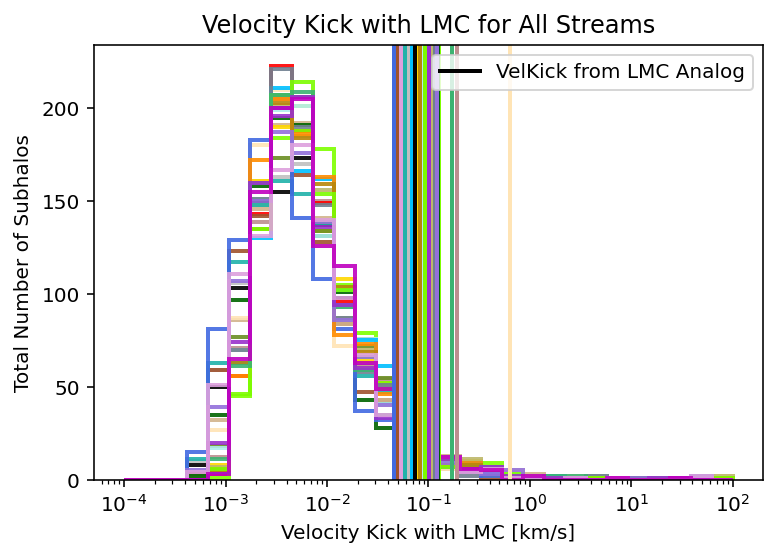

In [36]:
# Calculation of Velocity Kick With LMC: similar to above but overplotting
# With the addition of the Plot 
# the straight line shows the velocity kick due to the LMC

colors = ['black', 'silver', 'rosybrown', 'red', 'sienna',
         'tan', 'moccasin', 'gold', 'darkkhaki', 'olivedrab', 
         'chartreuse', 'darkgreen', 'lightseagreen', 'paleturquoise',
         'deepskyblue', 'slategray', 'royalblue', 'darkorange', 'darkgoldenrod',
         'lawngreen', 'mediumseagreen', 'mediumpurple', 'darkorchid', 'plum', 
         'm', 'palevioletred', 'violet', 'c', 'olive', 'lemonchiffon', 'skyblue',
         'indigo']

vel_kick = (np.empty(len(pb)))*(u.km/u.s)#*(u.m**3*u.M_sun/(u.kg*u.km*u.kpc*u.s))
for i in range(len(pb)):    
    G = (6.6743*10**(-11))*(u.m**3/(u.kg*u.s**2)) 
    r_min = np.array(pb.iloc[i][1::3])*u.kpc #CHANGED kpc to pc 
    v_rel = np.array(pb.iloc[i][3::3])*(u.km/u.s) 
    mass_subh = (np.array(ts[ind_massive]['mvir']))*u.M_sun 
    delta_v = 2*G*mass_subh/(r_min*v_rel) 

    delta_v_km_new = delta_v.to(u.km/u.s)
    
    plt.hist(delta_v_km_new.value,bins=np.logspace(-4,2,30), color=colors[i], alpha=0.9,
         histtype='step', linewidth=2)
    plt.axvline(delta_v_km_new[0].value, color=colors[i], linewidth=2) #Vel kick due to LMC
    
    plt.gca().set_xscale('log') 
    
    vel_kick_temp = np.sqrt(np.sum(delta_v_km_new**2))
    vel_kick[i] = vel_kick_temp

plt.axvline(delta_v_km_new[0].value, color='k', linewidth=2, label='VelKick from LMC Analog')

plt.xlabel('Velocity Kick with LMC [km/s]')
plt.ylabel('Total Number of Subhalos')
plt.title('Velocity Kick with LMC for All Streams')
plt.legend(loc='best')

plt.savefig('Vel_Kick_Histogram_with_LMC/All_Streams_Vel_Kick_With_LMC.png', transparent=False, dpi=200) 


## Adding Info to Streams (the dictionary)

In [37]:
#This data comes from Malhan
r_peri = dict(LMS_1=10.8, Gjoll=8.5, Leiptr=12.3, Hrid=1.1, Pal5=6.9, Orphan=15.6, 
             Gaia_1=8.2, Fimbulthul=2.4, Ylgr=11.5, Fjorm=9.1, Kshir=13.4, Cetus=14.7,
             Svol=5.9, Gunnthra=4.2, Slidr=8.7, M92=3.0, NGC_6397=3.4, NGC_3201=8.5,
             Ophiuchus=3.9, Atlas=11.7, C_7=3.5, C_3=5.7, Palca=10.8, Sylgr=8.7,
             Gaia_6=6.0, Gaia_9=8.7, Gaia_10=4.3, Gaia_12=18.5, Indus=12.6, Jhelum=8.7,
             Phoenix=11.7, NGC5466=4.8, M5=3.4, C_20=20.8, NGC7089=2.9, C_19=9.3,
             Elqui=12.1, Chenab=22.0, AliqaUma=11.6, Phlegethon=5.5, GD_1=14.1)


r_apo = dict(LMS_1=20.6, Gjoll=27.4, Leiptr=45.1, Hrid=22.0, Pal5=15.8, Orphan=41.2, 
             Gaia_1=67.6, Fimbulthul=7.2, Ylgr=20.7, Fjorm=29.1, Kshir=16.0, Cetus=35.9,
             Svol=10.0, Gunnthra=7.2, Slidr=32.3, M92=10.7, NGC_6397=6.4, NGC_3201=30.5,
             Ophiuchus=14.2, Atlas=32.4, C_7=21.0, C_3=10.0, Palca=16.5, Sylgr=24.6,
             Gaia_6=9.5, Gaia_9=20.8, Gaia_10=37.7, Gaia_12=194.3, Indus=18.9, Jhelum=24.5,
             Phoenix=18.1, NGC5466=33.7, M5=24.8, C_20=58.5, NGC7089=14.7, C_19=21.6,
             Elqui=54.0, Chenab=81.0, AliqaUma=31.9, Phlegethon=22.1, GD_1=23.0)

streams['r_apo'] = np.nan
streams['r_peri'] = np.nan

streams_copy = streams.copy()
for i in range(len(streams['Stream'][:])):
    if streams['Stream'][i] in list(r_apo.keys()):
        streams_copy['r_apo'][i] = r_apo[streams['Stream'][i]]
        streams_copy['r_peri'][i] = r_peri[streams['Stream'][i]]

#Vel kick is added with and without LMC
streams_copy_new = streams_copy.copy() # copying
streams_copy_new['vel_kick'] = np.nan
vel_kick_km_s = vel_kick.to(u.km/u.s)
j=0
for i in range(len(list(Nstep_represent_dict.values()))):
    if ((list(Nstep_foward_dict.values())[i] != 'None') & (list(Nstep_foward_dict.values())[i] !='Unknown')):
        streams_copy_new['vel_kick'][i] = vel_kick[j]
        j+=1
        
streams_copy_new_new = streams_copy_new.copy() # copying
streams_copy_new_new['vel_kick_no_LMC'] = np.nan
vel_kick_km_s = vel_kick_no_LMC.to(u.km/u.s)
j=0
for i in range(len(list(Nstep_represent_dict.values()))):
    if ((list(Nstep_foward_dict.values())[i] != 'None') & (list(Nstep_foward_dict.values())[i] !='Unknown')):
        streams_copy_new_new['vel_kick_no_LMC'][i] = vel_kick_no_LMC[j]
        j+=1

#This data comes from Mateu
length = dict(Gjoll=mwsts['NGC3201-P21'].length.deg, Leiptr=mwsts['Leiptr-I21'].length.deg, 
              Hrid=mwsts['Hrid-I21'].length.deg, Pal5=mwsts['Pal15-M17'].length.deg, #Pal5 has 2
              Gaia_1=mwsts['Gaia-1-I21'].length.deg, Ylgr=mwsts['Ylgr-I21'].length.deg, 
              Fjorm=mwsts['M68-P19'].length.deg, Kshir=mwsts['Kshir-I21'].length.deg, 
              Gunnthra=mwsts['Gunnthra-I21'].length.deg, Slidr=mwsts['Slidr-I21'].length.deg, 
              M92=mwsts['M92-I21'].length.deg, NGC_3201=mwsts['NGC3201-P21'].length.deg,
              Atlas=mwsts['AAU-ATLAS-L21'].length.deg, C_7=mwsts['C-7-I21'].length.deg, 
              Palca=mwsts['Palca-S18'].length.deg, Sylgr=mwsts['Sylgr-I21'].length.deg,
              Gaia_9=mwsts['Gaia-9-I21'].length.deg, Gaia_10=mwsts['Gaia-10-I21'].length.deg, 
              Gaia_12=mwsts['Gaia-12-I21'].length.deg, Indus=mwsts['Indus-S19'].length.deg, 
              Jhelum=mwsts['Jhelum-a-B19'].length.deg, Phoenix=mwsts['Phoenix-S19'].length.deg, #Jhelum has 2
              NGC5466=mwsts['NGC5466-G06'].length.deg, M5=mwsts['M5-G19'].length.deg, 
              C_20='0', C_19=mwsts['C-9-I21'].length.deg,
              Elqui=mwsts['Elqui-S19'].length.deg, AliqaUma=mwsts['AAU-AliqaUma-L21'].length.deg, 
              Phlegethon=mwsts['Phlegethon-I21'].length.deg, GD_1=mwsts['GD-1-I21'].length.deg)

length_values = list(length.values())

streams_copy_new_new['length [deg]'] = np.nan
for i, stream_name in enumerate(streams_copy_new_new['Stream']):
    streams_copy_new_new.loc[i, 'length [deg]'] = length_values[i]
streams_copy_new_new.to_csv('Streams_data_complete.csv', index='False')
streams_copy_new_new_new = pd.read_csv('Streams_data_complete.csv')
streams_copy_new_updated = streams_copy_new_new_new.drop("Unnamed: 0",axis=1)
# streams_copy_new_updated

<ipython-input-37-50b040e62a80>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  streams_copy['r_apo'][i] = r_apo[streams['Stream'][i]]
<ipython-input-37-50b040e62a80>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  streams_copy['r_peri'][i] = r_peri[streams['Stream'][i]]
<ipython-input-37-50b040e62a80>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  streams_copy_new['vel_kick'][i] = vel_kick[j]
<ipython-input-37-50b040e62a80>:44:

In [38]:
streams_copy_new_updated

,Stream,ra,dec,distance,pm_ra_cosdec,pm_dec,radial_velocity,r_apo,r_peri,vel_kick,vel_kick_no_LMC,length [deg]
0,Gjoll,82.10,-13.95,3.26,23.58,-23.70,78.73,27.4,8.5,63.304909,63.304874,136.860661
1,Leiptr,89.11,-28.37,7.39,10.59,-9.90,194.22,45.1,12.3,56.581283,56.581247,70.370056
2,Hrid,280.51,33.30,2.75,-5.88,20.08,-238.77,22.0,1.1,90.056724,90.056525,61.730058
3,Pal5,229.65,0.26,20.16,-2.75,-2.68,-57.03,15.8,6.9,101.808773,101.808718,1.469166
4,Gaia_1,190.96,-9.16,5.57,-14.39,-19.72,214.91,67.6,8.2,87.270256,87.270242,34.570252
5,Ylgr,173.82,-22.31,9.72,-0.44,-7.65,317.86,20.7,11.5,65.285339,65.285299,44.786315
6,Fjorm,251.89,65.38,6.42,3.92,3.10,-25.37,29.1,9.1,78.651054,78.648533,133.548763
7,Kshir,205.88,67.25,9.57,-7.67,-3.92,-249.88,16.0,13.4,102.622835,102.622805,17.393372
8,Gunnthra,284.22,-73.49,2.83,-15.83,-24.04,132.26,7.2,4.2,98.892981,98.892922,20.200567
9,Slidr,160.05,10.22,2.99,-24.60,-6.65,-87.98,32.3,8.7,175.462008,175.461986,33.614165


## Covariance

In [39]:
corr_apo_peri = np.corrcoef(streams_copy_new_updated['r_apo'], streams_copy_new_updated['r_peri'])
corr_peri_velkick = np.corrcoef(streams_copy_new_updated['r_peri'], streams_copy_new_updated['vel_kick'])
corr_apo_velkick = np.corrcoef(streams_copy_new_updated['r_apo'], streams_copy_new_updated['vel_kick'])
corr_peri_velkicknoLMC = np.corrcoef(streams_copy_new_updated['r_peri'], streams_copy_new_updated['vel_kick_no_LMC'])

print('Correlation between apocenter and pericenter:', corr_apo_peri)
print('Correlation between apocenter and velocity kick:', corr_apo_velkick)
print('Correlation between pericenter and velocity kick:', corr_peri_velkick)
print('Correlation between pericenter and velocity kick with out LMC:', corr_peri_velkicknoLMC)

Correlation between apocenter and pericenter: [[1.         0.49676505]
 [0.49676505 1.        ]]
Correlation between apocenter and velocity kick: [[ 1. nan]
 [nan nan]]
Correlation between pericenter and velocity kick: [[ 1. nan]
 [nan nan]]
Correlation between pericenter and velocity kick with out LMC: [[ 1. nan]
 [nan nan]]


In [40]:
diff_velkicks = streams_copy_new_updated['vel_kick_no_LMC']- streams_copy_new_updated['vel_kick']>100
diff_velkicks[diff_velkicks>100]

Series([], dtype: bool)

### Emphasizing Streams with Largest Vel Kicks (this only consideres vel kick during closest encounter)

From this graph we see that there are ZERO differences. The LMC does not create a big change.


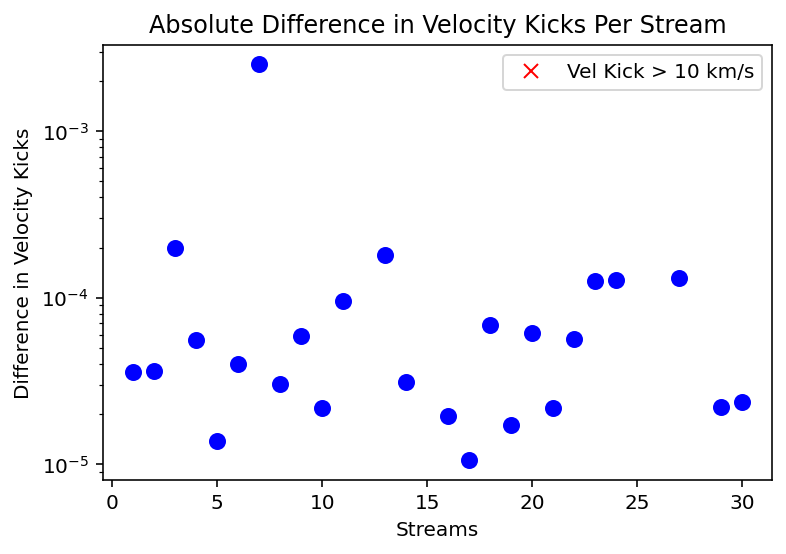

In [41]:
diff_velkicks = np.abs(streams_copy_new_updated['vel_kick_no_LMC'] - streams_copy_new_updated['vel_kick'])

x = np.linspace(1,30,30)
plt.figure()
plt.plot(x, diff_velkicks, '.b', ms=15)
plt.plot(x[diff_velkicks>100], diff_velkicks[diff_velkicks>100], 'x', 
         color= 'red', ms=7, label='Vel Kick > 10 km/s')

# feed back from lmc generically heats up the streams  
plt.xlabel('Streams')
plt.ylabel('Difference in Velocity Kicks')
plt.yscale('log')
plt.legend(loc='best')
plt.title('Absolute Difference in Velocity Kicks Per Stream')

print('From this graph we see that there are ZERO differences. The LMC does not create a big change.')

### Smallest Distance on y axis and apocenter on x axis for all streams

<ipython-input-42-92d0b2a8bd2d>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


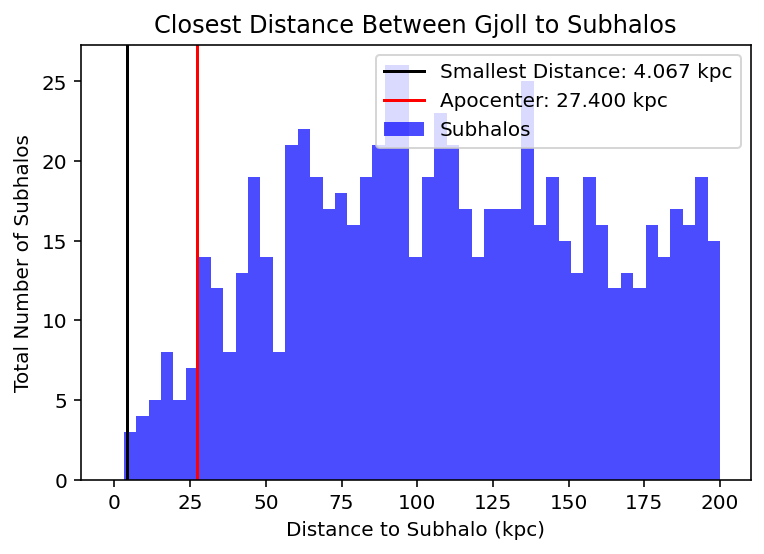

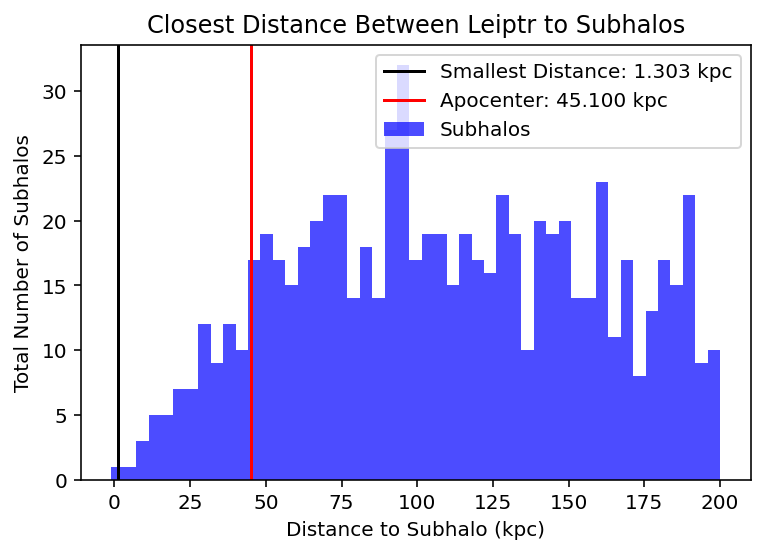

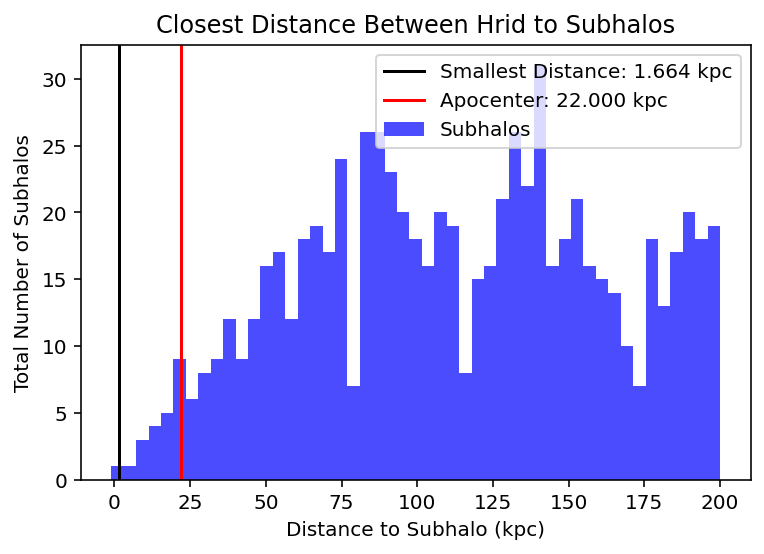

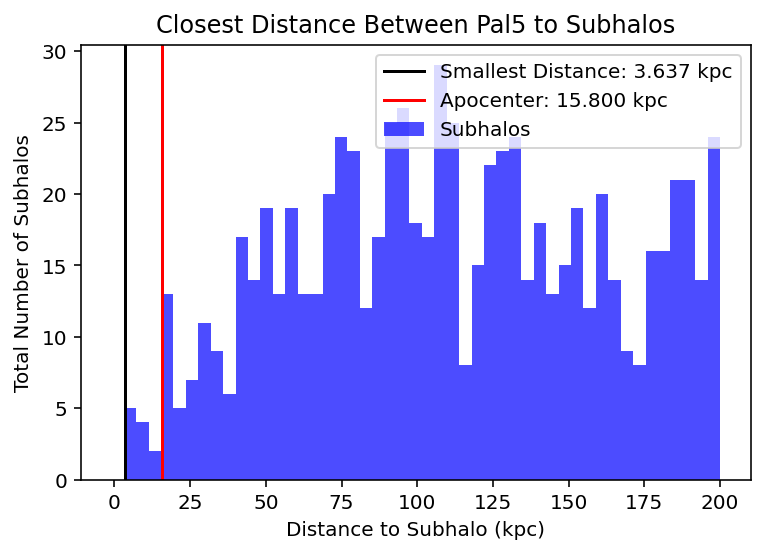

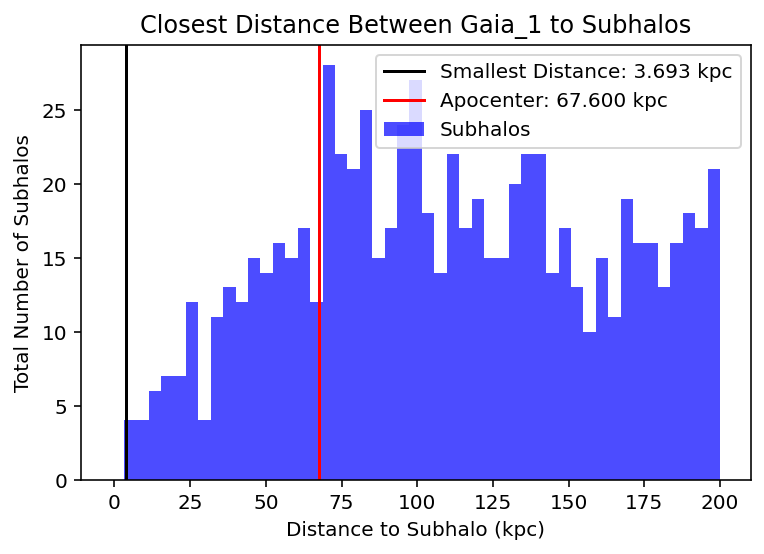

...

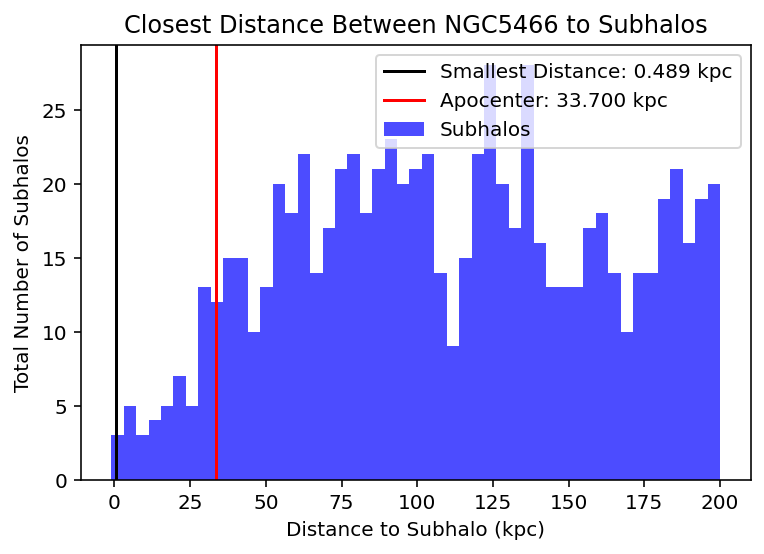

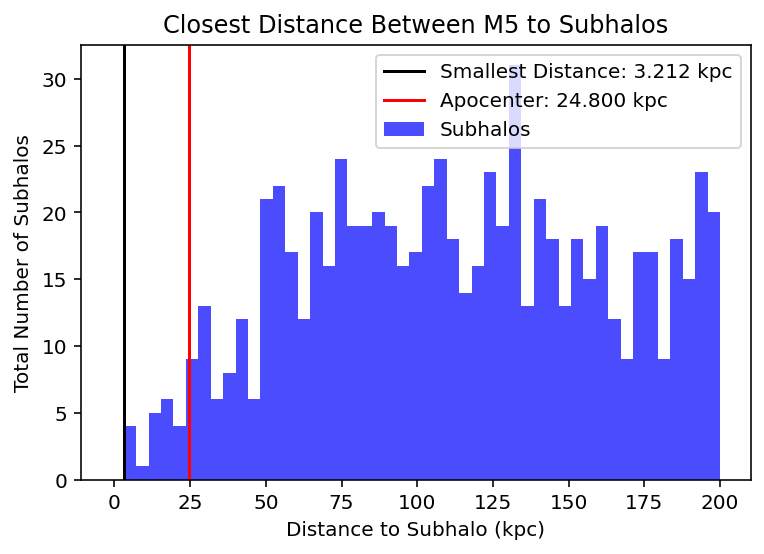

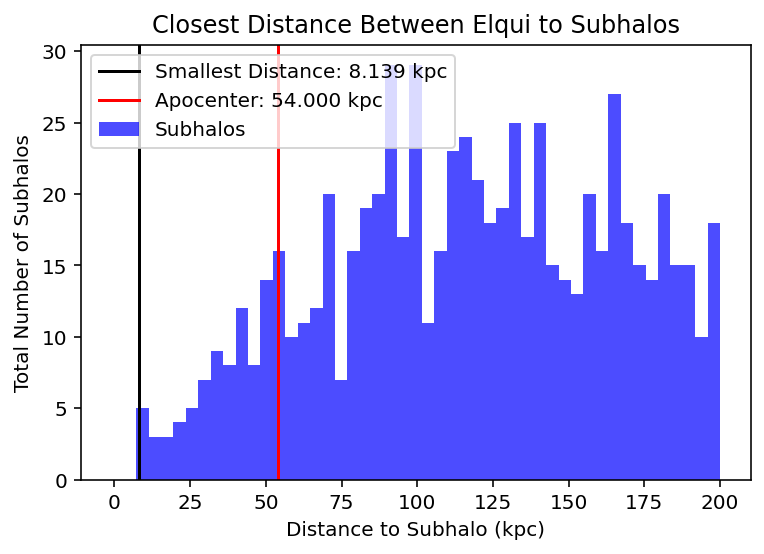

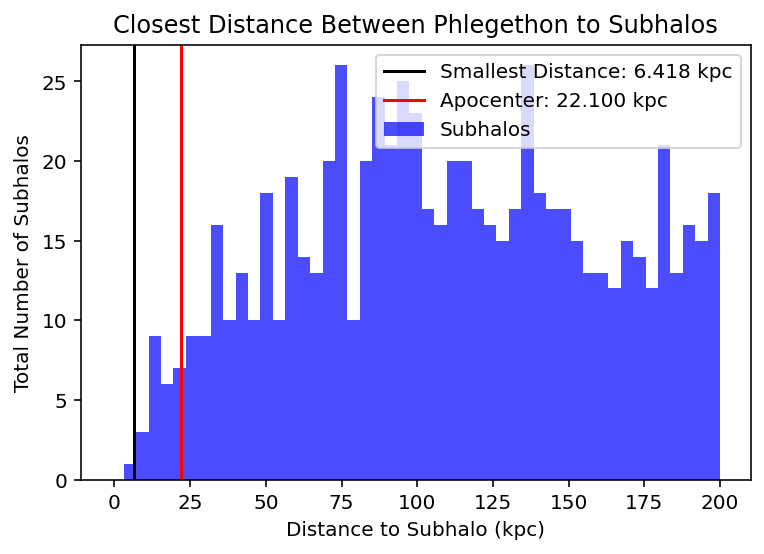

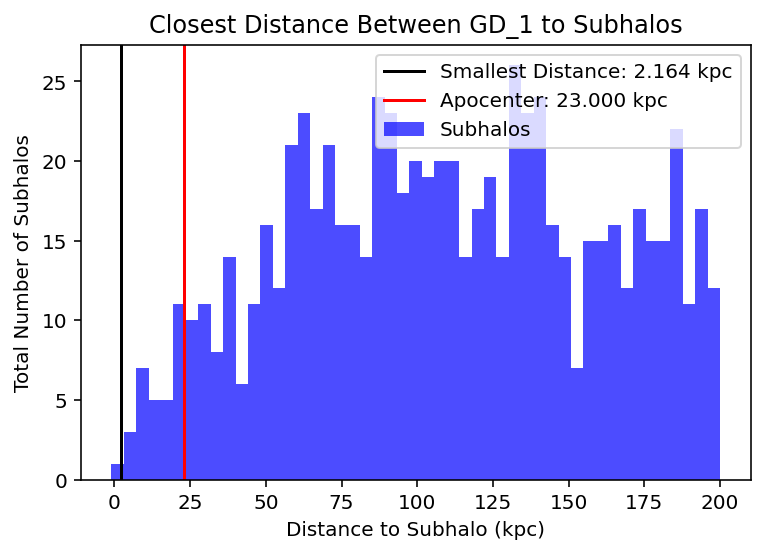

In [42]:
#Creates Histograms for All Streams 
#Include both Apocenter and Pericenter
for i in range(len(pb)):
    plt.figure()
    plt.hist(pb.iloc[i][1::3], bins=np.linspace(-1,200,50), color='blue', alpha=0.7, label='Subhalos');  
    plt.axvline(min(pb.iloc[i][1::3]), color='black', label = 'Smallest Distance: {:.3f} kpc'.format(min(pb.iloc[i][1::3])))
    for key in range(len(r_apo.keys())):
        if pb.iloc[i][0] == list(r_apo.keys())[key]:
            plt.axvline(r_apo[pb.iloc[i][0]], color='red', label = 'Apocenter: {:.3f} kpc'.format(r_apo[pb.iloc[i][0]]))
    plt.title('Closest Distance Between {:s} to Subhalos'.format(pb.iloc[i][0]))
    plt.xlabel('Distance to Subhalo (kpc)')
    plt.ylabel('Total Number of Subhalos')
    plt.legend(loc='best')
    plt.savefig('Stream_to_Subhalo_Histograms/'+str(pb.iloc[i][0])+'.png', transparent=False, dpi=200)
    
    

# 

## Old Paper Plots - does not necessarily need to be ran

### Streams Distance to Galactic Center

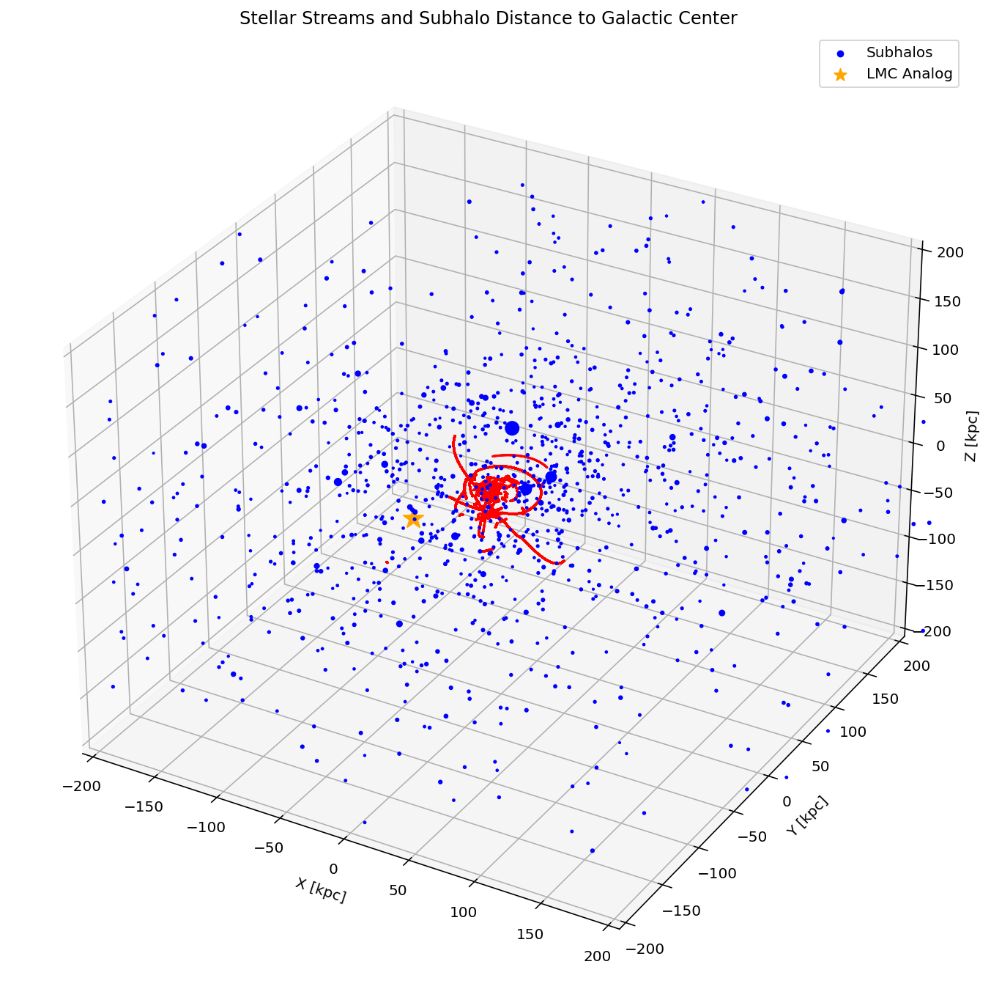

In [43]:
#%matplotlib notebook
#enable notebook for interactive
fig = plt.figure(1,figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
for st in mwsts.keys():
    ax.scatter3D(mwsts[st].track.transform_to(gsr).x,mwsts[st].track.transform_to(gsr).y,
                 mwsts[st].track.transform_to(gsr).z,
                 marker='.', color='red', s=1, c=None, alpha=1)
ax.scatter3D(rot_orbits[1:,0,0], rot_orbits[1:,0,1], rot_orbits[1:,0,2], color='blue', label='Subhalos', s=10*(trot['rs'][1:]), alpha=1)    
ax.scatter3D(rot_orbits[0,0,0], rot_orbits[0,0,1], rot_orbits[0,0,2], marker='*', color='orange', s=400*trot['rs'][0], 
             label='LMC Analog', alpha=1)

ax.set_xlim3d(-200, 200)
ax.set_ylim3d(-200, 200)
ax.set_zlim3d(-200, 200)
ax.set_xlabel('X [kpc]')
ax.set_ylabel('Y [kpc]')
ax.set_zlabel('Z [kpc]')
plt.legend(loc='best', markerscale=0.6)
plt.title('Stellar Streams and Subhalo Distance to Galactic Center')
plt.savefig('Stellar_Streams_and_Subhalo_Distance_to_Galactic_Center.png', transparent=False, dpi=200)
                 

### Orbit of Gaia-1 in Past 3 Gyrs

In [44]:
#Orbit time step for Gaia-1

# define Galactocentric reference frame
coord.galactocentric_frame_defaults.set('v4.0')
gc_frame = coord.Galactocentric()

ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
                                     r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))

name = 'Gaia-1-I21'
c = coord.SkyCoord(ra=190.96*u.deg, dec=-9.16*u.deg, distance=5.57*u.kpc, pm_ra_cosdec=-14.39*u.mas/u.yr,
                   pm_dec=-19.72*u.mas/u.yr, radial_velocity=214.91*u.km/u.s, frame='icrs')

w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)

dt = 0.2*u.Myr
Nstep_foward = list(Nstep_foward_dict.values())[4]
orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())

w0_start = gd.PhaseSpacePosition(orbit_foward.pos[-1], orbit_foward.vel[-1])
Nstep = list(Nstep_represent_dict.values())[4]
orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
orbit_sky = orbit.to_coord_frame(coord.ICRS())

#LONG ORBIT: going backwards in time
Nstep_long = 3000
orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)

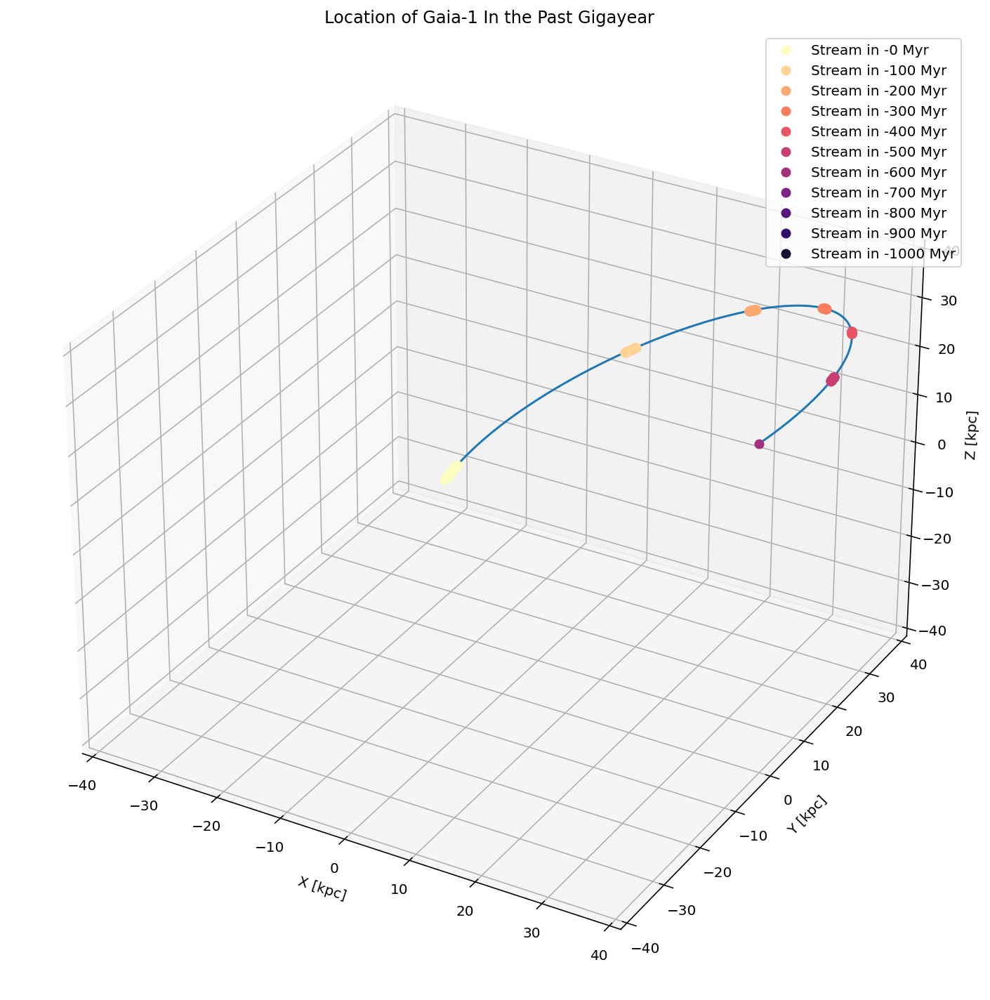

In [45]:
#%matplotlib notebook
f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)

ax = plt.axes(projection='3d')

ax.plot(orbit_long.pos.x.to(u.kpc), orbit_long.pos.y.to(u.kpc), orbit_long.pos.z.to(u.kpc), '-')
ax.set_xlabel('X [kpc]')
ax.set_ylabel('Y [kpc]')
ax.set_zlabel('Z [kpc]')

#orbital segments of past positions of the stream
times = np.linspace(0,1000,11)*u.Myr

colors = [mpl.cm.magma_r(x/11) for x in range(11)] #creating a list of 11 colors 

for i, tm in enumerate(times):
    t = int((tm/dt).decompose())
    ax.plot(orbit_long.pos.x.to(u.kpc)[t:t+Nstep], orbit_long.pos.y.to(u.kpc)[t:t+Nstep],
            orbit_long.pos.z.to(u.kpc)[t:t+Nstep], 'o', lw=8, color=colors[i],
            label='Stream in {:g}'.format(-tm))
plt.legend(loc='best')
ax.set_xlim(-40,40)
ax.set_ylim(-40,40)
ax.set_zlim(-40,40)
plt.title('Location of Gaia-1 In the Past Gigayear')
plt.tight_layout()
plt.savefig('Location_of_Stellar_Stream_in_the_Past_Gigayear.png', transparent=True)


### Vel Kick Contribution on Gaia-1

In [46]:
#Calculating Individual Velocity Kicks Cause by Subhalos to Gaia-1 at  
i=4 #Gaia-1 is Index 4
G = (6.6743*10**(-11))*(u.m**3/(u.kg*u.s**2)) #gravitational constant
r_min = np.array(pb.iloc[i][1::3])*u.pc  #smallest distance between subhalos and stream 
v_rel = np.array(pb.iloc[i][3::3])*(u.km/u.s) #relative vel. between stream and subhalos 
mass_subh = (np.array(ts[ind_massive]['mvir']))*u.M_sun #mass of subhalos
delta_v = 2*G*mass_subh/(r_min*v_rel)
delta_v_km_new_Gaia1 = delta_v.to(u.km/u.s)
np.array(delta_v_km_new_Gaia1.value)

array([49.05836816, 75.02857022, 28.82779305, ...,  2.07480494,
        3.06556169,  1.39513768])

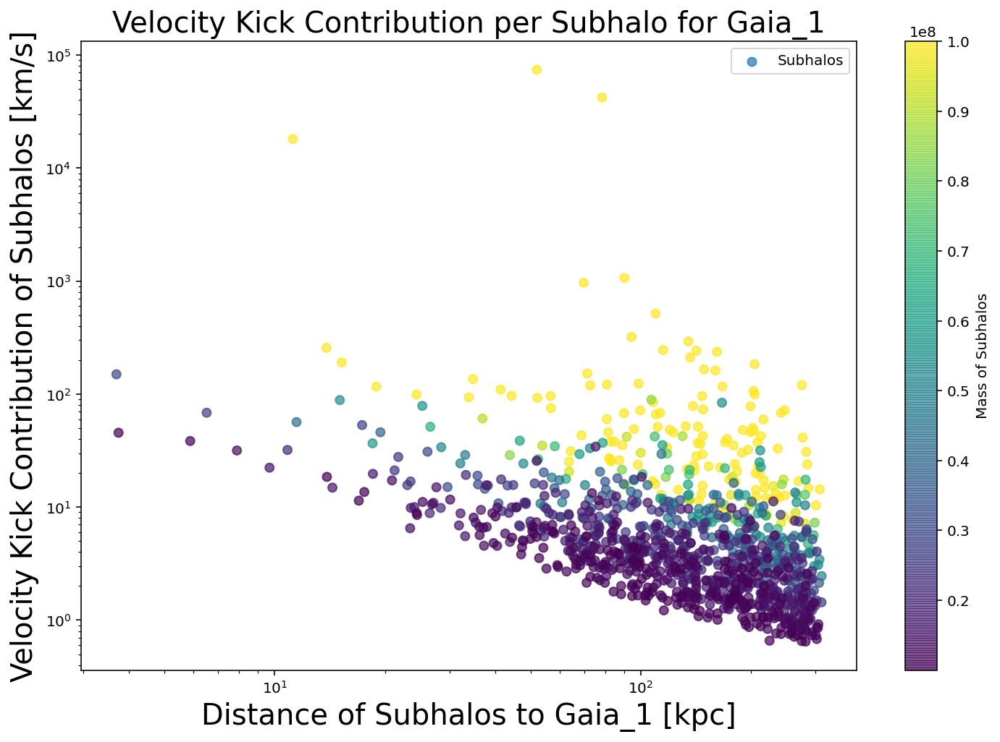

In [47]:
#want to have distance to gaia-1 vs velocity kick contribution of subhalo
plt.figure(figsize=(12,8))
plt.scatter(np.array(pb.iloc[4][1::3]), np.array(delta_v_km_new_Gaia1.value),
         c=np.array(ts[ind_massive]['mvir']), vmax=1e+8,
         alpha=0.7, label='Subhalos') #Darker color -> lighter; lighter color -> heavier

plt.xlabel('Distance of Subhalos to Gaia_1 [kpc]', fontsize=20)
plt.ylabel('Velocity Kick Contribution of Subhalos [km/s]', fontsize=20)
plt.title('Velocity Kick Contribution per Subhalo for Gaia_1', fontsize=20)
plt.colorbar(label='Mass of Subhalos', orientation='vertical')
plt.legend(loc='best')
plt.xscale('log')
plt.yscale('log')
plt.savefig('Velocity_Kick_Contribution_per_Subhalo_for_Gaia_1.png', transparent=False, dpi=200)

### Plotting Length vs Apocenter & Length vs Num of Kicks 

In [48]:
#Obtaining Values with no Nan from the streams pandas data frame
ind_finite = np.isfinite(streams_copy_new_updated['vel_kick'])

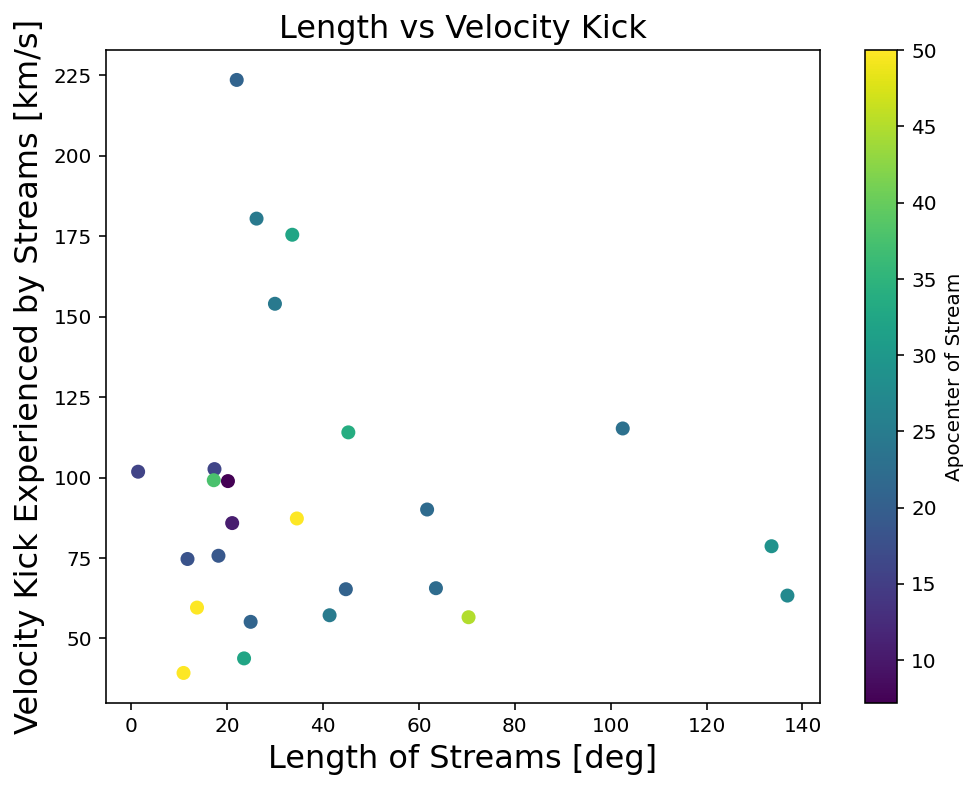

In [49]:
#X - axis apocenter & Y - axis Number of streams that give a velocity larger than 1 km/s - detectable impacts  (scatter plot)
plt.figure(figsize=(8,6))
plt.scatter(streams_copy_new_updated['length [deg]'][ind_finite], np.array(vel_kick_no_LMC.to(u.km/u.s)), 
            c = streams_copy_new_updated['r_apo'][ind_finite], vmax=50)

plt.colorbar(label='Apocenter of Stream', orientation='vertical')
plt.xlabel('Length of Streams [deg]', fontsize=16)
plt.ylabel('Velocity Kick Experienced by Streams [km/s]', fontsize=16) #No LMC Analog
plt.title('Length vs Velocity Kick', fontsize=16)
plt.show()



### Plotting Velocity Kick vs Subhalo Mass, color coded by closest distance

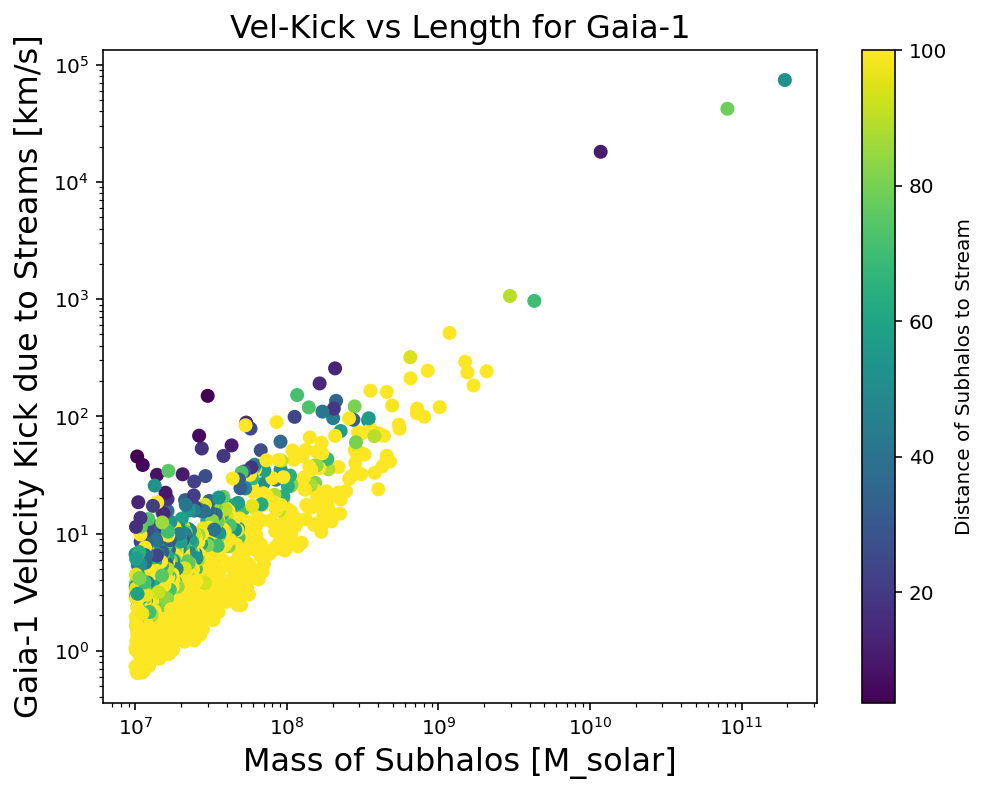

In [50]:
plt.figure(figsize=(8,6))
plt.scatter(ts[ind_massive]['mvir']*u.Msun, delta_v_km_new_Gaia1,
            c = pb.iloc[4][1::3], vmax=100)
#Darker color -> closer; lighter -> further away
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Mass of Subhalos [M_solar]', fontsize=16)
plt.ylabel('Gaia-1 Velocity Kick due to Streams [km/s]', fontsize=16)
plt.title('Vel-Kick vs Length for Gaia-1', fontsize=16)
plt.colorbar(label='Distance of Subhalos to Stream', orientation='vertical')
plt.show()


# Figures for Paper

## Figure 1

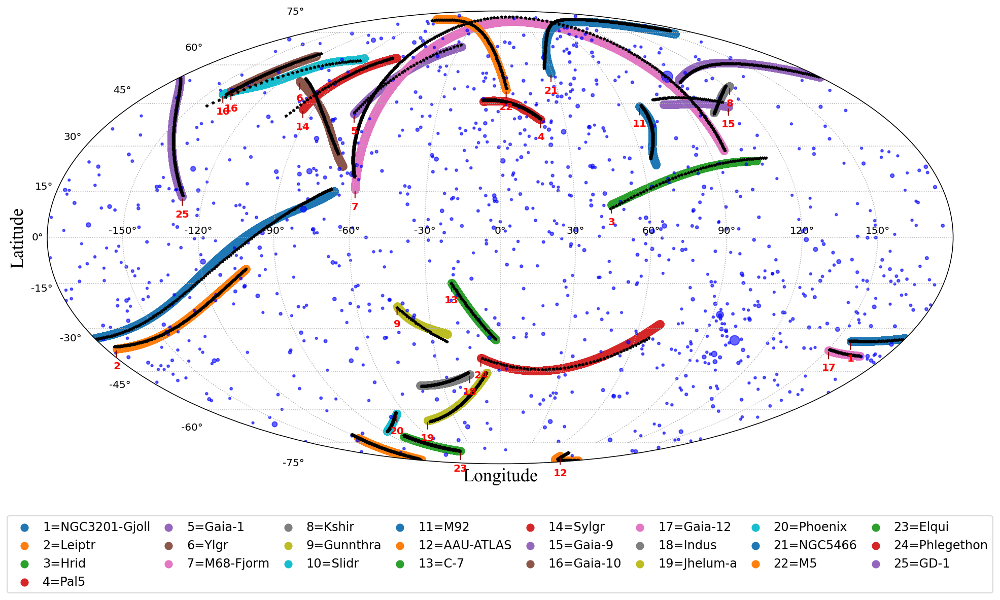

In [51]:
c = coord.Galactocentric(x=rot_orbits[:,0,0]*u.kpc, y=rot_orbits[:,0,1]*u.kpc, z=rot_orbits[:,0,2]*u.kpc)
c_eq = c.transform_to(coord.ICRS)
cgal = c_eq.transform_to(coord.Galactic)

fig = plt.figure(1,figsize=(16,11))
ax = fig.add_subplot(111, projection='mollweide')
ind_massive_temp = (trot['mvir'] > 10**7) 


#Plotting the stellar streams from Mateu
counter = 1
for i in range(len(names)): #iterating through each stream
    if ((list(names.values())[i] != 'None') & (list(Nstep_foward_dict.values())[i] != 'None') 
                                            & (list(Nstep_foward_dict.values())[i] !='Unknown')):
        ax.scatter(mwsts[list(names.values())[i]].track.galactic.l.wrap_at(180*u.deg).rad, 
                   mwsts[list(names.values())[i]].track.galactic.b.rad, marker='.', s=200, 
                    label="{ID:.0f}={Name}".format(ID=counter,
                              Name=mwsts[list(names.values())[i]].stream_name))
        xo = mwsts[list(names.values())[i]].end_points.galactic.l.wrap_at(180*u.deg)[0].rad
        yo = mwsts[list(names.values())[i]].end_points.galactic.b[0].rad  
        # Specify font properties including 'weight' for bold
        font_props = {'weight': 'bold'}

        # Annotate with bold text
        ax.annotate(counter, xy=(xo, yo),
                    xycoords='data', color='r',
                    arrowprops=dict(arrowstyle="-", color='darkred'),
                    horizontalalignment='center', verticalalignment='center',
                    xytext=(0, -17), textcoords='offset points',
                    fontproperties=font_props)  # Set font properties
        counter += 1


#Plotting the stellar streams from Malhan
for i in range(len(names)): #iterating through each stream
    if ((list(names.values())[i] != 'None') & (type(list(Nstep_foward_dict.values())[i]) != str)):       
        
        dt = 0.2*u.Myr
        c = coord.SkyCoord(ra=streams.iloc[i][1]*u.deg, dec=streams.iloc[i][2]*u.deg, distance=streams.iloc[i][3]*u.kpc, 
                           pm_ra_cosdec=streams.iloc[i][4]*u.mas/u.yr,pm_dec=streams.iloc[i][5]*u.mas/u.yr, 
                           radial_velocity=streams.iloc[i][6]*u.km/u.s, frame='icrs')
        w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)
        
        
        Nstep_foward = list(Nstep_foward_dict.values())[i]
        orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
        orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())


        w0_start = gd.PhaseSpacePosition(orbit_foward.pos[-1], orbit_foward.vel[-1])
        Nstep = list(Nstep_represent_dict.values())[i]
        orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
        orbit_sky = orbit.to_coord_frame(coord.ICRS())
        over_plot_malhan = orbit_sky.transform_to(coord.Galactic)
        
        
        ax.plot(over_plot_malhan.l.wrap_at(180*u.deg).rad, over_plot_malhan.b.rad, 
                '*',color='black', ms=3)         
            
            
#plotting the subhalos
sc = ax.scatter(cgal.l.wrap_at(180*u.deg).rad[ind_massive_temp], cgal.b.rad[ind_massive_temp], 
                c='blue', alpha=0.6, 
                s=trot['rvir'][ind_massive_temp], zorder=1)



#labeling the figure
csfont = {'fontname':'Times New Roman'}
ax.legend(ncol=8,loc='center', columnspacing=0.5, handletextpad=0.5, 
          bbox_to_anchor=(0.50,-0.20), 
          markerscale=1, fontsize='large')

ax.grid(ls=':')
ax.tick_params(axis='y', colors='black')
plt.xlabel('Longitude', fontsize='18', **csfont)
plt.ylabel('Latitude', fontsize='18', **csfont)
ax.xaxis.label.set_color('black')
ax.yaxis.label.set_color('black')


plt.savefig('Official_Subhalos_Over_Streams_In_Galactic_Coordinates.png', dpi = 250)


## Figure 2

Relative distance between all the subhalos as a function of time. 
Every line would be the distance between a stream and a subhalo. 
The number of lines will be the same as the number of subhalos. 

### Code below must be rerun for 1000 time steps instead of 3000

In [52]:
#THE PURPOSE of having this code here is in case anything was over ran above. 'We start from zero.'

#Getting the Orbits of Subhalos
dt = 0.2*u.Myr
subh_orbits = []
Nstep_long=1000
for subh_ in range(len(ts['x'][ind_massive])): 
    #This calculates the position of the subhalos at a given time
    c_subh = coord.Galactocentric(x=ts['x'][ind_massive][subh_]*u.kpc, y=ts['y'][ind_massive][subh_]*u.kpc, 
                                  z=ts['z'][ind_massive][subh_]*u.kpc,
                                  v_x=ts['vx'][ind_massive][subh_]*u.km/u.s, 
                                  v_y=ts['vy'][ind_massive][subh_]*u.km/u.s,
                                  v_z=ts['vz'][ind_massive][subh_]*u.km/u.s)
    w0_subh = gd.PhaseSpacePosition(c_subh.cartesian)
    subh_orbits += [ham.integrate_orbit(w0_subh, dt=-dt, n_steps=Nstep_long)]

#Rotating Subhalo Position Orbits 
N = len(subh_orbits[0].pos.x)

rot_orbits=np.zeros((len(ts['x'][ind_massive]), len(subh_orbits[1].pos.x), 3))

for j, subh in enumerate(subh_orbits):
    for i in range(N):
        temp_vec = np.array([subh.pos.x[i].value, subh.pos.y[i].value, subh.pos.z[i].value])
        rot_vec = np.matmul(R, temp_vec)

        rot_orbits[j][i][0] = rot_vec[0]
        rot_orbits[j][i][1] = rot_vec[1]
        rot_orbits[j][i][2] = rot_vec[2]
        
#Rotating Subhalo Velocity Orbits 
N = len(subh_orbits[0].vel.d_x)

rot_orbits_vel=np.zeros((len(ts['vx'][ind_massive]), len(subh_orbits[1].vel.d_x), 3))

for j, subh in enumerate(subh_orbits):
    for i in range(N):
        temp_vec_vel = np.array([subh.vel.d_x.to(u.km/u.s)[i].value, 
                                 subh.vel.d_y.to(u.km/u.s)[i].value, 
                                 subh.vel.d_z.to(u.km/u.s)[i].value])
        rot_vec_vel = np.matmul(R, temp_vec_vel)

        rot_orbits_vel[j][i][0] = rot_vec_vel[0]
        rot_orbits_vel[j][i][1] = rot_vec_vel[1]
        rot_orbits_vel[j][i][2] = rot_vec_vel[2]

In [53]:
# define Galactocentric reference frame
coord.galactocentric_frame_defaults.set('v4.0')
gc_frame = coord.Galactocentric()

#define hamiltonian
#once again, our potential is using the MW potential defined by the CDM simulation
ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']/h*u.Msun, 
                                     r_s=(MW_analog['rs'])/h*u.kpc, units=galactic))

def RelativeDist_Gaia(streams):
    #Information for Stream 
    rel_distance = pd.DataFrame()
    c = coord.SkyCoord(ra=streams.iloc[4][1]*u.deg, dec=streams.iloc[4][2]*u.deg, distance=streams.iloc[4][3]*u.kpc, 
                       pm_ra_cosdec=streams.iloc[4][4]*u.mas/u.yr,pm_dec=streams.iloc[4][5]*u.mas/u.yr, 
                       radial_velocity=streams.iloc[4][6]*u.km/u.s, frame='icrs')
    
    w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)
    dt = 0.2*u.Myr
    Nstep_foward = list(Nstep_foward_dict.values())[4]
    orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
    orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())
    w0_start = gd.PhaseSpacePosition(orbit_foward.pos, orbit_foward.vel)
    Nstep = list(Nstep_represent_dict.values())[4] 
    orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
    #Going back for 1 Gyr - Anything past this, we anticipate a progenitor
    Nstep_long = 1000
    orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)

    data_new = {'Stream':[str(streams.iloc[4]['Stream'])]}
    data_temp = pd.DataFrame(data=data_new)

    for subh in range(len(trot['x'])): #subh stands for individual subhalo
        Npoint = np.shape(orbit_long.pos)[1]
        shape = np.shape(orbit_long.pos)

        #creating individual arrays to store information 
        distances_x = np.empty(shape)
        distances_y = np.empty(shape)
        distances_z = np.empty(shape)

        for point in range(Npoint):
            distances_x[:, point] = orbit_long.pos.x.to(u.kpc)[:,point] - rot_orbits[subh,:,0]*u.kpc
            distances_y[:, point] = orbit_long.pos.y.to(u.kpc)[:,point] - rot_orbits[subh,:,1]*u.kpc
            distances_z[:, point] = orbit_long.pos.z.to(u.kpc)[:,point] - rot_orbits[subh,:,2]*u.kpc

        rel_dist = np.sqrt((distances_x**2)+(distances_y**2)+(distances_z**2)) 

        data_temp['Subhalo_'+ str(subh)+ ' Relative Distance (kpc)'] = [rel_dist]


    rel_distance = rel_distance.append(data_temp, ignore_index=True)
    return rel_distance




In [54]:
rel_dist_gaia1 = RelativeDist_Gaia(streams)
rel_dist_gaia1

,Stream,Subhalo_0 Relative Distance (kpc),Subhalo_1 Relative Distance (kpc),Subhalo_2 Relative Distance (kpc),Subhalo_3 Relative Distance (kpc),Subhalo_4 Relative Distance (kpc),Subhalo_5 Relative Distance (kpc),Subhalo_6 Relative Distance (kpc),Subhalo_7 Relative Distance (kpc),Subhalo_8 Relative Distance (kpc),...,Subhalo_1052 Relative Distance (kpc),Subhalo_1053 Relative Distance (kpc),Subhalo_1054 Relative Distance (kpc),Subhalo_1055 Relative Distance (kpc),Subhalo_1056 Relative Distance (kpc),Subhalo_1057 Relative Distance (kpc),Subhalo_1058 Relative Distance (kpc),Subhalo_1059 Relative Distance (kpc),Subhalo_1060 Relative Distance (kpc),Subhalo_1061 Relative Distance (kpc)
0,Gaia_1,"[[96.88029288263282, 96.80932724095291, 96.738...","[[60.40375423716839, 60.48079286074414, 60.557...","[[43.86392813460824, 43.868073607063565, 43.87...","[[154.37995947477833, 154.42605990189804, 154....","[[127.55863385023628, 127.49091504150215, 127....","[[71.14369144030594, 71.09574202879945, 71.048...","[[68.5199937330836, 68.49950777576942, 68.4791...","[[98.434092821713, 98.47953559122881, 98.52498...","[[55.868273116973725, 55.94430215784165, 56.02...",...,"[[219.17174221960815, 219.25545575236868, 219....","[[72.52057918000102, 72.43135170364158, 72.342...","[[104.51528182470734, 104.52992648534672, 104....","[[162.08429399663814, 162.087214728838, 162.09...","[[95.04115447395286, 95.13031329111622, 95.219...","[[129.02546630425073, 128.97985878167867, 128....","[[175.3710313822292, 175.40492586901001, 175.4...","[[98.13845643127262, 98.18305023181244, 98.227...","[[63.11639579416272, 63.164702767491434, 63.21...","[[186.24754868058972, 186.31940481319907, 186...."


In [55]:
xaxis = np.linspace(0, len(rel_dist_gaia1.iloc[0][1]), len(rel_dist_gaia1.iloc[0][1]))

num_subhalos = len(rel_dist_gaia1.iloc[0])
num_time_steps = len(rel_dist_gaia1.iloc[0][1])


yaxis = []
for subhalo in range(1, num_subhalos): #need to start from 1 bc 0 is the name
    yaxis_subh = []
    for time in range(num_time_steps):
        yaxis_temp = rel_dist_gaia1.iloc[0][subhalo][time]
        yaxis_subh.append(yaxis_temp)
    yaxis.append(yaxis_subh) #this is the relative distance from the stream to the subhalo
    #I created this array so it was easier for me to read it and understand it

In [56]:
np.shape(yaxis)

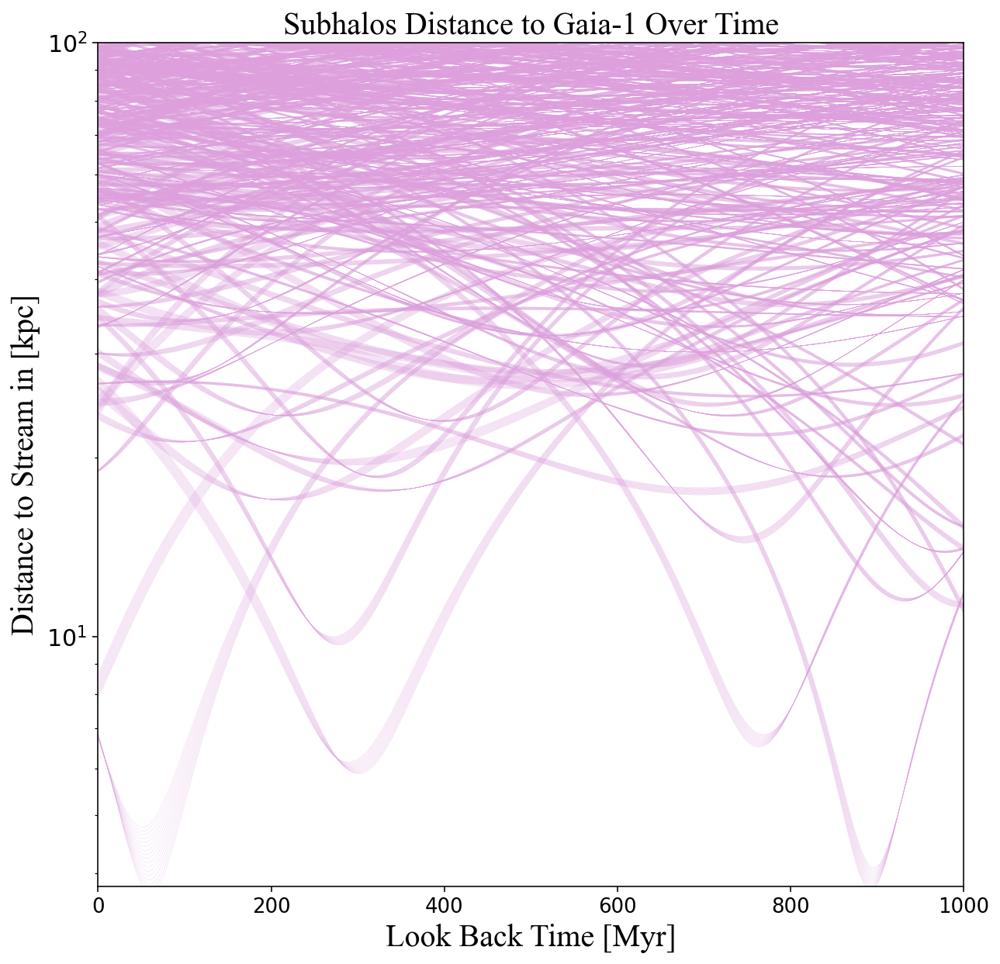

In [57]:
plt.figure(figsize=(10,10))
for subhalo in range(len(yaxis)):
    plt.plot(xaxis, yaxis[subhalo], color='plum', alpha=1, linewidth=0.1)
# plt.plot(xaxis, testing, color='plum', alpha=1, linewidth=1)    

csfont = {'fontname':'Times New Roman'}
plt.xlabel('Look Back Time [Myr]', fontsize='20', **csfont )
plt.xticks(fontsize=13)
plt.ylabel('Distance to Stream in [kpc]', fontsize='20', **csfont)
plt.yticks(fontsize=15)
plt.title('Subhalos Distance to Gaia-1 Over Time', fontsize='20', **csfont)
plt.xlim(0, 1000)
plt.ylim(3.8, 100)
# # plt.gca().set_xscale('log')
plt.gca().set_yscale('log')
plt.savefig('Distance_to_Stream_vs_LookBackTime.png', dpi=300)
#The bands actually represent each star in the stream

In [58]:
nearest_dist = []
for subhalo in range(len(yaxis[0])):
    nearest_dist.append(yaxis[subhalo])
    
np.min(nearest_dist)

## Figure 3

Number of Impacts per Gigayear as a function of Velocity kick Impulse

In [59]:
#creating important indices
ind_1 = ((ts['mvir'] >= 10**7) & (ts['mvir'] < 10**8))
ind_2 = ((ts['mvir'] >= 10**8) & (ts['mvir'] < 10**9))
ind_3 = (ts['mvir'] >= 10**9) 
indices = [ind_1, ind_2, ind_3]

In [60]:
def VelImpulse_Mass(streams):
    
    vel_kick1 = pd.DataFrame()
    for ind in(indices):
        #Getting the Orbits of Subhalos
        dt = 0.2*u.Myr
        subh_orbits = []
        Nstep_long=1000
        for subh_ in range(len(ts['x'][ind])): #have to use the original ts
            #This calculates the position of the subhalos at a given time
            c_subh = coord.Galactocentric(x=ts['x'][ind][subh_]*u.kpc, y=ts['y'][ind][subh_]*u.kpc, 
                                          z=ts['z'][ind][subh_]*u.kpc,
                                          v_x=ts['vx'][ind][subh_]*u.km/u.s, 
                                          v_y=ts['vy'][ind][subh_]*u.km/u.s,
                                          v_z=ts['vz'][ind][subh_]*u.km/u.s)
            w0_subh = gd.PhaseSpacePosition(c_subh.cartesian)
            subh_orbits += [ham.integrate_orbit(w0_subh, dt=-dt, n_steps=Nstep_long)]

        #Rotating Subhalo Position Orbits 
        N = len(subh_orbits[0].pos.x)

        rot_orbits=np.zeros((len(ts['x'][ind]), len(subh_orbits[1].pos.x), 3))

        for j, subh in enumerate(subh_orbits):
            for i in range(N):
                temp_vec = np.array([subh.pos.x[i].value, subh.pos.y[i].value, subh.pos.z[i].value])
                rot_vec = np.matmul(R, temp_vec)

                rot_orbits[j][i][0] = rot_vec[0]
                rot_orbits[j][i][1] = rot_vec[1]
                rot_orbits[j][i][2] = rot_vec[2]

        #Rotating Subhalo Velocity Orbits 
        N = len(subh_orbits[0].vel.d_x)

        rot_orbits_vel=np.zeros((len(ts['vx'][ind]), len(subh_orbits[1].vel.d_x), 3))

        for j, subh in enumerate(subh_orbits):
            for i in range(N):
                temp_vec_vel = np.array([subh.vel.d_x.to(u.km/u.s)[i].value, 
                                         subh.vel.d_y.to(u.km/u.s)[i].value, 
                                         subh.vel.d_z.to(u.km/u.s)[i].value])
                rot_vec_vel = np.matmul(R, temp_vec_vel)

                rot_orbits_vel[j][i][0] = rot_vec_vel[0]
                rot_orbits_vel[j][i][1] = rot_vec_vel[1]
                rot_orbits_vel[j][i][2] = rot_vec_vel[2]
                
                
                
        for i in range(len(names)):
            if ((list(names.values())[i] != 'None') & (list(Nstep_foward_dict.values())[i] != 'None') 
                                                    & (list(Nstep_foward_dict.values())[i] !='Unknown')):
                #Now we get the orbits of the streams 
                c = coord.SkyCoord(ra=streams.iloc[i][1]*u.deg, dec=streams.iloc[i][2]*u.deg, distance=streams.iloc[i][3]*u.kpc, 
                                   pm_ra_cosdec=streams.iloc[i][4]*u.mas/u.yr,pm_dec=streams.iloc[i][5]*u.mas/u.yr, 
                                   radial_velocity=streams.iloc[i][6]*u.km/u.s, frame='icrs')

                w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)
                dt = 0.2*u.Myr
                Nstep_foward = list(Nstep_foward_dict.values())[i]
                orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
                orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())
                w0_start = gd.PhaseSpacePosition(orbit_foward.pos, orbit_foward.vel)
                Nstep = list(Nstep_represent_dict.values())[i] 
                orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
                #Going back for 1 Gyr - Anything past this, we anticipate a progenitor
                Nstep_long = 1000
                orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)


                data_new = {'Stream':[str(streams.iloc[i]['Stream'])]}
                data_temp = pd.DataFrame(data=data_new)

                for subh in range(len(ts['x'][ind])): #subh stands for individual subhalo
                    Npoint = np.shape(orbit_long.pos)[1]
                    shape = np.shape(orbit_long.pos)
                    #creating individual arrays to store information 
                    distances_x = np.empty(shape)
                    distances_y = np.empty(shape)
                    distances_z = np.empty(shape)
                    velocity_x = np.empty(shape)
                    velocity_y = np.empty(shape)
                    velocity_z = np.empty(shape)

                ########## creating a temporary array that stores the location of the stars in the stream  ########
                #taking the distance from the points to a given stream#
                    for point in range(Npoint):

                        distances_x[:, point] = orbit_long.pos.x.to(u.kpc)[:,point] - rot_orbits[subh,:,0]*u.kpc
                        distances_y[:, point] = orbit_long.pos.y.to(u.kpc)[:,point] - rot_orbits[subh,:,1]*u.kpc
                        distances_z[:, point] = orbit_long.pos.z.to(u.kpc)[:,point] - rot_orbits[subh,:,2]*u.kpc

                        velocity_x[:, point] = orbit_long.vel.d_x.to(u.km/u.s)[:,point] - rot_orbits_vel[subh,:,0]*(u.km/u.s)
                        velocity_y[:, point] = orbit_long.vel.d_y.to(u.km/u.s)[:,point] - rot_orbits_vel[subh,:,1]*(u.km/u.s)
                        velocity_z[:, point] = orbit_long.vel.d_z.to(u.km/u.s)[:,point] - rot_orbits_vel[subh,:,2]*(u.km/u.s)

                        rel_dist = np.sqrt((distances_x**2)+(distances_y**2)+(distances_z**2)) 
                        rel_vel = np.sqrt(velocity_x**2 + velocity_y**2 + velocity_z**2)
                        min_ind = np.argmin(rel_dist, axis=1)
                        rel_dist_min = rel_dist[:,min_ind][:,0]
                        rel_vel_at_min = rel_vel[:,min_ind][:,0]

                        G = (6.6743*10**(-11))*(u.m**3/(u.kg*u.s**2)) 
                        r_min = rel_dist_min*u.kpc  
                        v_rel = rel_vel_at_min*(u.km/u.s) #relative vel btwn stream and subhalos at shortest distance
                        mass_subh = (np.array(ts['mvir'][ts['mvir']>10**7])[subh])*u.M_sun 
                        delta_v = 2*G*mass_subh/(r_min*v_rel) 
                        vel_kick_temp = np.sqrt(np.sum((delta_v.to(u.km/u.s))**2))

                        data_temp['Subhalo_'+ str(subh)+ ' Velocity Kick (km/s)'] = [vel_kick_temp]
                        data_temp['Subhalo_'+ str(subh)+ ' Relative Distance (kpc)'] = [rel_dist]

                vel_kick1 = vel_kick1.append(data_temp, ignore_index=True)
            
    return vel_kick1



In [61]:
#vel_impulse_with_mass = VelImpulse_Mass(streams)

In [62]:
#vel_impulse_with_mass.to_csv('Vel_impulse_with_Mass.csv', index=False)
vel_impulse_with_mass = pd.read_csv('Vel_impulse_with_Mass.csv')
vel_impulse_with_mass

,Stream,Subhalo_0 Velocity Kick (km/s),Subhalo_0 Relative Distance (kpc),Subhalo_1 Velocity Kick (km/s),Subhalo_1 Relative Distance (kpc),Subhalo_2 Velocity Kick (km/s),Subhalo_2 Relative Distance (kpc),Subhalo_3 Velocity Kick (km/s),Subhalo_3 Relative Distance (kpc),Subhalo_4 Velocity Kick (km/s),...,Subhalo_933 Velocity Kick (km/s),Subhalo_933 Relative Distance (kpc),Subhalo_934 Velocity Kick (km/s),Subhalo_934 Relative Distance (kpc),Subhalo_935 Velocity Kick (km/s),Subhalo_935 Relative Distance (kpc),Subhalo_936 Velocity Kick (km/s),Subhalo_936 Relative Distance (kpc),Subhalo_937 Velocity Kick (km/s),Subhalo_937 Relative Distance (kpc)
0,Gjoll,2.0289615433988706 km / s,[[ 50.82365671 50.77184076 50.7200037 ... ...,3.251748630627006 km / s,[[ 70.25948034 70.24823385 70.23715045 ... ...,0.9871211202659046 km / s,[[61.38883715 61.43615363 61.48359319 ... 67.4...,2.8447635591446794 km / s,[[104.62292434 104.59068751 104.55837336 ... 1...,0.9937556893316851 km / s,...,0.15375286756609108 km / s,[[128.72200065 128.70856199 128.69525424 ... 1...,0.195562804607174 km / s,[[169.16872913 169.23449819 169.30032814 ... 1...,0.11394764854997116 km / s,[[ 93.51507658 93.56910598 93.62314166 ... ...,0.14092622095073892 km / s,[[58.85594838 58.90857 58.96120245 ... 64.7...,0.07164075674649482 km / s,[[183.45834047 183.51603229 183.57377493 ... 1...
1,Leiptr,1.7583566976882283 km / s,[[ 52.11116274 52.05845419 52.00573733 ... ...,3.2920716462910526 km / s,[[ 67.32711726 67.3202796 67.31361563 ... ...,0.8528054625279572 km / s,[[59.39534244 59.45000061 59.50477283 ... 62.1...,2.6678609904424198 km / s,[[107.87509291 107.83962873 107.80409521 ... 1...,0.8881610116200072 km / s,...,0.20599241801952708 km / s,[[125.91261293 125.90309995 125.89372091 ... 1...,0.22105984953482277 km / s,[[169.79113763 169.86205714 169.93301324 ... 1...,0.1017120378420614 km / s,[[ 95.45299441 95.50809535 95.56319254 ... ...,0.1081584801516302 km / s,[[61.15791676 61.2108153 61.26371707 ... 63.6...,0.0711467648185378 km / s,[[185.94974919 186.0121638 186.0745939 ... 1...
2,Hrid,4.364164437029599 km / s,[[48.91635308 48.92394298 48.93158244 ... 49.2...,2.4558011429255115 km / s,[[ 74.90810758 74.87071382 74.83343931 ... ...,1.199120327443137 km / s,[[65.23167548 65.21124306 65.19094736 ... 64.4...,3.1842079584471077 km / s,[[ 99.55338031 99.58103046 99.60863909 ... 1...,0.9429775760277394 km / s,...,0.05266917199919809 km / s,[[133.11131658 133.07325078 133.03528352 ... 1...,0.04156132131310932 km / s,[[169.75529526 169.72298279 169.69078443 ... 1...,0.08545900359621636 km / s,[[ 91.78120253 91.7798338 91.77854214 ... ...,0.357540941529206 km / s,[[56.74002609 56.73873429 56.73755001 ... 56.7...,0.04943723777063139 km / s,[[181.72052469 181.66946962 181.61854097 ... 1...
3,Pal5,3.0819990230994536 km / s,[[ 33.3322746 33.32336393 33.31456356 ... ...,2.569475942176748 km / s,[[81.77919359 81.75851447 81.7378081 ... 79.7...,0.9958588233486864 km / s,[[83.8813516 83.87480536 83.86816154 ... 82.8...,4.062295832287595 km / s,[[82.28146555 82.29675431 82.31214037 ... 84.1...,0.9023630186636815 km / s,...,0.08921114425490968 km / s,[[137.88139614 137.86066366 137.83992021 ... 1...,0.07803321582127558 km / s,[[186.0875302 186.09586017 186.10410942 ... 1...,0.08046478644417032 km / s,[[103.66546741 103.67976188 103.69398372 ... 1...,0.11896604081882924 km / s,[[68.61258236 68.62632737 68.64000073 ... 69.5...,0.07353776280126775 km / s,[[190.35289105 190.36847994 190.38404636 ... 1...
4,Gaia_1,2.601795783002323 km / s,[[ 43.86392813 43.86807361 43.87244753 ... ...,2.420571326205246 km / s,[[ 71.14369144 71.09574203 71.04800455 ... ...,0.4944504653869566 km / s,[[ 68.51999373 68.49950778 68.47913447 ... ...,2.945159584697612 km / s,[[98.43409282 98.47953559 98.52498754 ... 99.0...,1.5955262070832785 km / s,...,0.11808172459575593 km / s,[[129.0254663 128.97985878 128.93443174 ... 1...,0.0711730538085825 km / s,[[175.37103138 175.40492587 175.43884014 ... 1...,0.10662611933340

In [63]:
vel_impulse_master_1 = vel_impulse_with_mass.iloc[:25, :]

## Testing what is wrong with units

In [64]:
# Assuming selected_columns contains the names of the columns you want to inspect
selected_columns = vel_impulse_with_mass.columns[1::2]  # Example: Select every other column

# Function to extract numerical value from a string (assumes the value format is "<number> km / s")
def extract_numerical_value(s):
    try:
        # Split the string by whitespace and take the first part (numeric value)
        return float(s.split()[0])
    except:
        return float('nan')  # Return NaN if extraction fails

numeric_values = []
for stream_index in range(len(vel_impulse_with_mass[selected_columns])):
# # Assuming stream_index is the index of the row you want to access
# stream_index = 0  # Example: Access the first row

    # Access the specific row at stream_index in selected_columns
    row_series_temp = vel_impulse_with_mass[selected_columns].iloc[stream_index]

    # Apply the extraction function to each element in the Series
    numeric_values.append(row_series_temp.apply(extract_numerical_value))

# Display the extracted numerical values
print("Extracted numerical values:")
print(np.shape(numeric_values))


Extracted numerical values:
(75, 938)


In [65]:
numeric_values1 = numeric_values[:25]
numeric_values2 = numeric_values[25:50]
numeric_values3 = numeric_values[50:75]
np.shape(numeric_values1), np.shape(numeric_values2), np.shape(numeric_values3)

In [66]:
for stream_index in range(len(numeric_values1)):
    for subhalo_index in range(len(numeric_values1[stream_index])):
        if numeric_values1[stream_index][subhalo_index] > 100:
            print('First constraint index of stream, subhalo ', stream_index, subhalo_index)
#for here we see that the velocity kicks > 100 km/s are created by subhalos 8 and 11, but also 12, 15, 16
#what this suggests is that maybe it is a property connected to the subhalo

First constraint index of stream, subhalo  0 8
First constraint index of stream, subhalo  0 11
First constraint index of stream, subhalo  1 8
First constraint index of stream, subhalo  1 11
First constraint index of stream, subhalo  2 8
First constraint index of stream, subhalo  2 11
First constraint index of stream, subhalo  3 8
First constraint index of stream, subhalo  3 11
First constraint index of stream, subhalo  4 8
First constraint index of stream, subhalo  4 11
First constraint index of stream, subhalo  5 8
First constraint index of stream, subhalo  5 11
First constraint index of stream, subhalo  6 8
First constraint index of stream, subhalo  6 11
First constraint index of stream, subhalo  7 8
First constraint index of stream, subhalo  7 11
First constraint index of stream, subhalo  8 8
First constraint index of stream, subhalo  8 11
First constraint index of stream, subhalo  9 8
First constraint index of stream, subhalo  9 11
First constraint index of stream, subhalo  9 15
Fi

In [67]:
mass_subh_LMC = np.array(ts['mvir'][ts['mvir'] > 10**7])[0] * u.M_sun
mass_subh_8 = np.array(ts['mvir'][ts['mvir'] > 10**7])[8] * u.M_sun
mass_subh_11 = np.array(ts['mvir'][ts['mvir'] > 10**7])[11] * u.M_sun
mass_subh_12 = np.array(ts['mvir'][ts['mvir'] > 10**7])[12] * u.M_sun
mass_subh_15 = np.array(ts['mvir'][ts['mvir'] > 10**7])[15] * u.M_sun
mass_subh_16 = np.array(ts['mvir'][ts['mvir'] > 10**7])[16] * u.M_sun

# Printing in scientific notation
print(f"{mass_subh_LMC:.3e} {mass_subh_8:.3e} {mass_subh_11:.3e} {mass_subh_12:.3e} {mass_subh_15:.3e} {mass_subh_16:.3e}")

3.030e+08 solMass 1.932e+11 solMass 8.068e+10 solMass 1.176e+10 solMass 2.962e+09 solMass 2.080e+09 solMass


The masses found are larger than the predicted. 
ONLINE: LMC mass is 2.5 * 10^9 M_solar

G = (6.6743*10**(-11))*(u.m ** 3/(u.kg*u.s ** 2)) 
r_min = rel_dist_min*u.kpc  
v_rel = rel_vel_at_min*(u.km/u.s) #relative vel btwn stream and subhalos at shortest distance
mass_subh = (np.array(ts['mvir'][ts['mvir']>10**7])[subh]) * u.M_sun 
delta_v = 2*G*mass_subh/(r_min*v_rel) 
vel_kick_temp = np.sqrt(np.sum((delta_v.mto(u.km/u.s)) ** 2))

In [68]:
columns_to_drop = [
    'Subhalo_8 Velocity Kick (km/s)', 'Subhalo_8 Relative Distance (kpc)',
    'Subhalo_11 Velocity Kick (km/s)', 'Subhalo_11 Relative Distance (kpc)',
    'Subhalo_12 Velocity Kick (km/s)', 'Subhalo_12 Relative Distance (kpc)',
    'Subhalo_15 Velocity Kick (km/s)', 'Subhalo_15 Relative Distance (kpc)',
    'Subhalo_16 Velocity Kick (km/s)', 'Subhalo_16 Relative Distance (kpc)'
]

# Drop the specified columns
vel_impulse_with_mass_cleaned = vel_impulse_with_mass.drop(columns=columns_to_drop, axis=1)

# Now vel_impulse_with_mass_cleaned will have the specified columns removed

## End of testing what is wrong with units

In [69]:
# Select the first 25 rows and every other column of vel_impulse_with_mass
vel_impulse_master_1 = vel_impulse_with_mass_cleaned.iloc[:25, 1::2]
vel_impulse_master_2 = vel_impulse_with_mass_cleaned.iloc[25:50, 1::2]
vel_impulse_master_3 = vel_impulse_with_mass_cleaned.iloc[50:75, 1::2]

In [70]:
# Flatten DataFrame columns into 1D numpy arrays, extracting numeric values and converting to float
vel_impulse_sum_1 = np.array([extract_numerical_value(value) for value in vel_impulse_master_1.to_numpy().flatten()])
vel_impulse_sum_2 = np.array([extract_numerical_value(value) for value in vel_impulse_master_2.to_numpy().flatten()])
vel_impulse_sum_3 = np.array([extract_numerical_value(value) for value in vel_impulse_master_3.to_numpy().flatten()])

# Filter out NaN values (ignoring non-numeric or invalid values)
vel_impulse_sum_1_cleaned = vel_impulse_sum_1[~np.isnan(vel_impulse_sum_1)]
vel_impulse_sum_2_cleaned = vel_impulse_sum_2[~np.isnan(vel_impulse_sum_2)]
vel_impulse_sum_3_cleaned = vel_impulse_sum_3[~np.isnan(vel_impulse_sum_3)]

In [71]:
# Calculate mean values for cleaned arrays
vel_impulse_mean_1 = np.mean(vel_impulse_sum_1_cleaned)
vel_impulse_mean_2 = np.mean(vel_impulse_sum_2_cleaned)
vel_impulse_mean_3 = np.mean(vel_impulse_sum_3_cleaned)

vel_impulse_mean_1_cleaned = vel_impulse_mean_1[~np.isnan(vel_impulse_mean_1)]
vel_impulse_mean_2_cleaned = vel_impulse_mean_2[~np.isnan(vel_impulse_mean_2)]
vel_impulse_mean_3_cleaned = vel_impulse_mean_3[~np.isnan(vel_impulse_mean_3)]

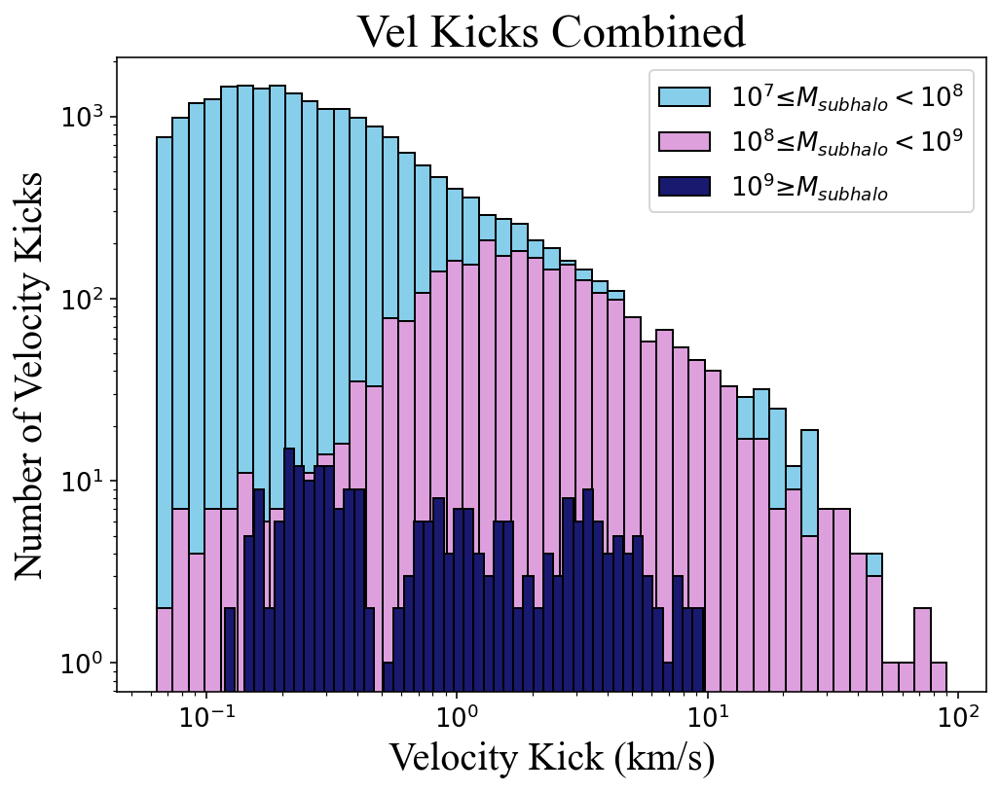

In [72]:

plt.figure(figsize=(8,6))
plt.hist(vel_impulse_sum_1_cleaned, bins=np.logspace(np.log10(vel_impulse_sum_2_cleaned.min()),np.log10(vel_impulse_sum_2_cleaned.max())), alpha=1, color='skyblue', edgecolor='black', label='$10^{7} ≤ M_{subhalo} < 10^{8}$')
plt.hist(vel_impulse_sum_2_cleaned, bins=np.logspace(np.log10(vel_impulse_sum_2_cleaned.min()),np.log10(vel_impulse_sum_2_cleaned.max())), alpha=1, color='plum', edgecolor='black', stacked=True, label='$10^{8} ≤ M_{subhalo} < 10^{9}$')
plt.hist(vel_impulse_sum_3_cleaned, bins=np.logspace(np.log10(vel_impulse_sum_3_cleaned.min()),np.log10(vel_impulse_sum_3_cleaned.max())), alpha=1, color='midnightblue', edgecolor='black', stacked=True, label='$10^{9} ≥ M_{subhalo}$')

plt.xlabel('Velocity Kick (km/s)', fontsize='20', **csfont )
plt.xticks(fontsize=13)
plt.ylabel('Number of Velocity Kicks', fontsize='20', **csfont)
plt.yticks(fontsize=13)
plt.title('Vel Kicks Combined', fontsize='24', **csfont )
plt.legend(loc='best', fontsize=13)
plt.gca().set_xscale('log')
plt.gca().set_yscale('log')
plt.savefig('Total_Velocity_Kicks_Caused_by_Subhalos_for_Gaia1.png', dpi = 250)
plt.show()

In [73]:
test1 = vel_impulse_sum_1_cleaned[vel_impulse_sum_1_cleaned>10**2]
test2 = vel_impulse_sum_2_cleaned[vel_impulse_sum_2_cleaned>10**2]
test3 = vel_impulse_sum_3_cleaned[vel_impulse_sum_3_cleaned>10**2]

In [74]:
test1, test2, test3 #this is good because there should exist no values above this one now

(array([], dtype=float64), array([], dtype=float64), array([], dtype=float64))

In [75]:
# plt.figure(figsize=(8,6))
# plt.hist(vel_impulse_sum_1_cleaned, bins=np.logspace(np.log10(vel_impulse_sum_2_cleaned.min()),np.log10(vel_impulse_sum_2_cleaned.max())), alpha=1, color='skyblue', edgecolor='black', label='$10^{7} ≤ M_{subhalo} < 10^{8}$')
# plt.hist(vel_impulse_sum_2_cleaned, bins=np.logspace(np.log10(vel_impulse_sum_2_cleaned.min()),np.log10(vel_impulse_sum_2_cleaned.max())), alpha=1, color='plum', edgecolor='black', stacked=True, label='$10^{8} ≤ M_{subhalo} < 10^{9}$')
# plt.hist(vel_impulse_sum_3_cleaned, bins=np.logspace(np.log10(vel_impulse_sum_3_cleaned.min()),np.log10(vel_impulse_sum_3_cleaned.max())), alpha=1, color='midnightblue', edgecolor='black', stacked=True, label='$10^{9} ≥ M_{subhalo}$')

# plt.xlabel('Velocity Kick (km/s)', fontsize='20', **csfont )
# plt.xticks(fontsize=13)
# plt.ylabel('Number of Velocity Kicks', fontsize='20', **csfont)
# plt.yticks(fontsize=13)
# plt.title('Vel Kicks Combined', fontsize='24', **csfont )
# plt.legend(loc='best', fontsize=13)
# plt.gca().set_xscale('log')
# plt.gca().set_yscale('log')
# plt.savefig('Total_Velocity_Kicks_Caused_by_Subhalos_for_Gaia1.png', dpi = 250)
# plt.show()

In [76]:
numeric_values1[4]

Subhalo_0 Velocity Kick (km/s)      2.601796
Subhalo_1 Velocity Kick (km/s)      2.420571
Subhalo_2 Velocity Kick (km/s)      0.494450
Subhalo_3 Velocity Kick (km/s)      2.945160
Subhalo_4 Velocity Kick (km/s)      1.595526
                                      ...   
Subhalo_933 Velocity Kick (km/s)    0.118082
Subhalo_934 Velocity Kick (km/s)    0.071173
Subhalo_935 Velocity Kick (km/s)    0.106626
Subhalo_936 Velocity Kick (km/s)    0.111653
Subhalo_937 Velocity Kick (km/s)    0.049703
Name: 4, Length: 938, dtype: float64

In [77]:
def std(data):
    #this takes in an array and finds the standard deviation
    numerator = data - np.mean(data)
    denominator = len(data)
    std = numerator/denominator
    return std

In [78]:
x_axis_1 = np.linspace(0, len(numeric_values1[4]), len(numeric_values1[4])+1)[1:]
x_axis_2 = np.linspace(0, len(numeric_values2[4]), len(numeric_values2[4])+1)[1:]
x_axis_3 = np.linspace(0, len(numeric_values3[4]), len(numeric_values3[4])+1)[1:]

yerr_1=std(numeric_values1[4])
yerr_2=std(numeric_values2[4])
yerr_3=std(numeric_values3[4])

In [79]:
len(yerr_1)

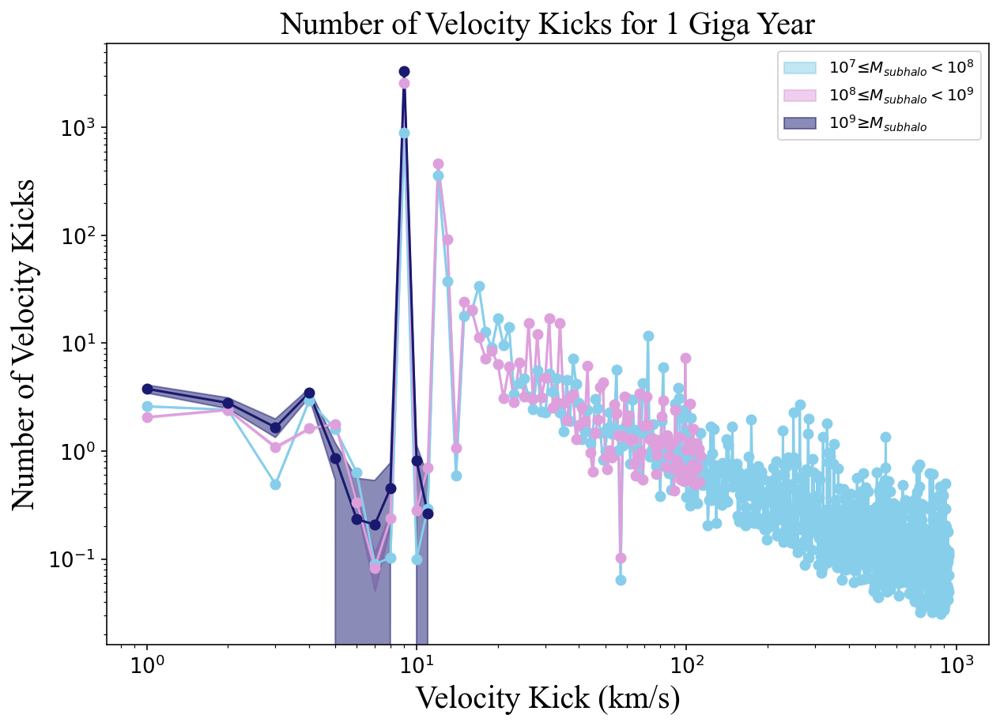

In [80]:
plt.figure(figsize=(10,7))
plt.plot(x_axis_1, numeric_values1[4], '-', color='skyblue')
plt.plot(x_axis_2, numeric_values2[4], '-', color='plum')
plt.plot(x_axis_3, numeric_values3[4], '-', color='midnightblue')
plt.fill_between(x_axis_1, numeric_values1[4]-(yerr_1), numeric_values1[4]+(yerr_1), color='skyblue', alpha=0.5, label='$10^{7} ≤ M_{subhalo} < 10^{8}$')
plt.fill_between(x_axis_2, numeric_values2[4]-(yerr_2), numeric_values2[4]+(yerr_2), color='plum', alpha=0.5, label='$10^{8} ≤ M_{subhalo} < 10^{9}$')
plt.fill_between(x_axis_3, numeric_values3[4]-(yerr_3), numeric_values3[4]+(yerr_3), color='midnightblue', alpha=0.5, label='$10^{9} ≥ M_{subhalo}$')

plt.plot(x_axis_1, numeric_values1[4], 'o', color='skyblue')
plt.plot(x_axis_2, numeric_values2[4], 'o', color='plum')
plt.plot(x_axis_3, numeric_values3[4], 'o', color='midnightblue')

plt.xlabel('Velocity Kick (km/s)', fontsize='20', **csfont )
plt.xticks(fontsize=13)
plt.ylabel('Number of Velocity Kicks', fontsize='20', **csfont)
plt.title('Number of Velocity Kicks for 1 Giga Year', fontsize='20', **csfont)
plt.yticks(fontsize=13)
# plt.xlim(1.5*10**1, 0.5*10**2)
# plt.ylim(10**(-1), 10**2)
plt.gca().set_xscale('log')
plt.gca().set_yscale('log')
plt.legend(loc='best')
plt.savefig('Number_of_Vel_Kicks_for_1Gyr.png', dpi=300)
plt.show()

### Figure 4

Number of Velocity kicks as a function of Proximity to LMC Analog

In [81]:
# #First, we need to find the location of the lmc at all times 
# lmc_loc_all_times = np.sqrt((rot_orbits_vel[0,:,0]*(u.km/u.s))**2 + (rot_orbits_vel[0,:,0]*(u.km/u.s))**2 + (rot_orbits_vel[0,:,0]*(u.km/u.s))**2)
# lmc_loc_all_times
#this is wrong bc how is this location ? idk what i was trying to say here 

In [82]:
def Distance_Streams(streams):
    dist_measurements = pd.DataFrame()
    
    for i in range(0,len(names)): 
        if ((list(names.values())[i] != 'None') & 
            (list(Nstep_foward_dict.values())[i] != 'None') & 
            (list(Nstep_foward_dict.values())[i] != 'Unknown')):
                
            c = coord.SkyCoord(ra=streams.iloc[i][1]*u.deg, dec=streams.iloc[i][2]*u.deg, 
                               distance=streams.iloc[i][3]*u.kpc, pm_ra_cosdec=streams.iloc[i][4]*u.mas/u.yr, 
                               pm_dec=streams.iloc[i][5]*u.mas/u.yr, radial_velocity=streams.iloc[i][6]*u.km/u.s, 
                               frame='icrs')

            w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)
            dt = 0.2*u.Myr
            Nstep_foward = list(Nstep_foward_dict.values())[i]
            orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
            orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())
            w0_start = gd.PhaseSpacePosition(orbit_foward.pos, orbit_foward.vel)
            Nstep = list(Nstep_represent_dict.values())[i] 
            orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)
            
            Nstep_long = 1000
            orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)

            data_new = {'Stream': [str(streams.iloc[i]['Stream'])]}
            data_temp = pd.DataFrame(data=data_new)

            Npoint = np.shape(orbit_long.pos)[1]
            shape = np.shape(orbit_long.pos)
                
            temp_distances_x = np.empty(shape)
            temp_distances_y = np.empty(shape)
            temp_distances_z = np.empty(shape)

            for point in range(Npoint):
                temp_distances_x[:, point] = orbit_long.pos.x.to(u.kpc)[:, point] - rot_orbits[0,:,0]*u.kpc
                temp_distances_y[:, point] = orbit_long.pos.y.to(u.kpc)[:, point] - rot_orbits[0,:,1]*u.kpc
                temp_distances_z[:, point] = orbit_long.pos.z.to(u.kpc)[:, point] - rot_orbits[0,:,2]*u.kpc

                rel_temp_dist = np.sqrt(temp_distances_x**2 + temp_distances_y**2 + temp_distances_z**2)
                abs_min = np.min(rel_temp_dist)

                data_temp['Closest Distance to LMC (kpc)'] = [abs_min]

        dist_measurements = dist_measurements.append(data_temp, ignore_index=True)  
    return dist_measurements

In [83]:
distances_for_streams_test1 = Distance_Streams(streams)
distances_for_streams_test1

<ipython-input-82-265b7f83b496>:41: RuntimeWarning: overflow encountered in square
  rel_temp_dist = np.sqrt(temp_distances_x**2 + temp_distances_y**2 + temp_distances_z**2)
<ipython-input-82-265b7f83b496>:41: RuntimeWarning: invalid value encountered in square
  rel_temp_dist = np.sqrt(temp_distances_x**2 + temp_distances_y**2 + temp_distances_z**2)


,Stream,Closest Distance to LMC (kpc)
0,Gjoll,94.051296
1,Leiptr,94.290280
2,Hrid,101.451584
3,Pal5,96.546175
4,Gaia_1,95.758795
5,Ylgr,90.760810
6,Fjorm,79.464190
7,Kshir,103.241661
8,Gunnthra,99.896958
9,Slidr,95.270778


In [84]:
distances_unique = distances_for_streams_test1.drop_duplicates(subset=['Stream']) #gets rid of streams with nan or unknown
filtered_streams = streams_copy_new_updated[streams_copy_new_updated['Stream'].isin(distances_unique['Stream'])]




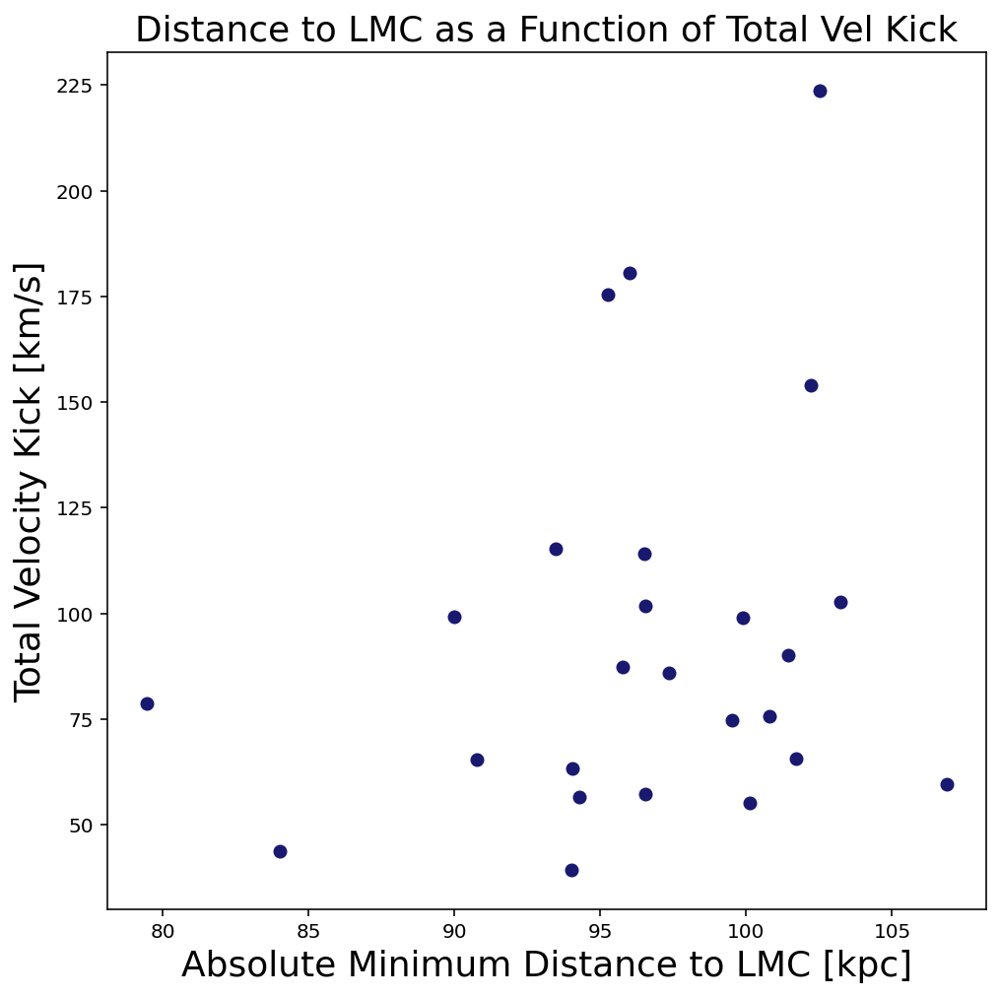

In [85]:
plt.rc('text', usetex=False)  # Turn off LaTeX rendering
plt.figure(figsize=(8,8))
plt.plot(distances_unique['Closest Distance to LMC (kpc)'], filtered_streams['vel_kick'],  'o', color='midnightblue')
plt.xlabel('Absolute Minimum Distance to LMC [kpc]', fontsize = 18)
plt.ylabel('Total Velocity Kick [km/s]', fontsize = 18)
#plt.yscale('log')
plt.title('Distance to LMC as a Function of Total Vel Kick', fontsize = 18)
plt.savefig('figure4')
plt.show()

In [86]:
mwsts.keys()

dict_keys(['20.0-1-M18', '300S-F18', 'AAU-AliqaUma-L21', 'AAU-ATLAS-L21', 'Acheron-G09', 'ACS-R21', 'Alpheus-G13', 'Aquarius-W11', 'C-19-I21', 'C-4-I21', 'C-5-I21', 'C-7-I21', 'C-8-I21', 'C-9-I21', 'Cetus-New-Y21', 'Cetus-Palca-T21', 'Cetus-Y13', 'Cocytos-G09', 'Corvus-M18', 'Elqui-S19', 'Eridanus-M17', 'Gaia-1-I21', 'Gaia-10-I21', 'Gaia-11-I21', 'Gaia-12-I21', 'Gaia-2-I21', 'Gaia-3-M18', 'Gaia-4-M18', 'Gaia-5-M18', 'Gaia-6-I21', 'Gaia-7-I21', 'Gaia-8-I21', 'Gaia-9-I21', 'GD-1-I21', 'Gunnthra-I21', 'Hermus-G14', 'Hrid-I21', 'Hyllus-G14', 'Indus-S19', 'Jet-F22', 'Jhelum-a-B19', 'Jhelum-b-B19', 'Kshir-I21', 'Kwando-G17', 'Leiptr-I21', 'Lethe-G09', 'LMS1-Y20', 'M2-I21', 'M30-S20', 'M5-G19', 'M68-P19', 'M92-I21', 'Molonglo-G17', 'Monoceros-R21', 'Murrumbidgee-G17', 'NGC1261-I21', 'NGC1851-I21', 'NGC2298-I21', 'NGC288-I21', 'NGC3201-P21', 'NGC5466-G06', 'NGC6362-S20', 'NGC6397-I21', 'OmegaCen-I21', 'Ophiuchus-C20', 'Orinoco-G17', 'Orphan-K19', 'Pal13-S20', 'Pal15-M17', 'Pal5-PW19', 'Palca-S

Text(0.5, 0.92, 'Stellar Streams and LMC Distance to Galactic Center')

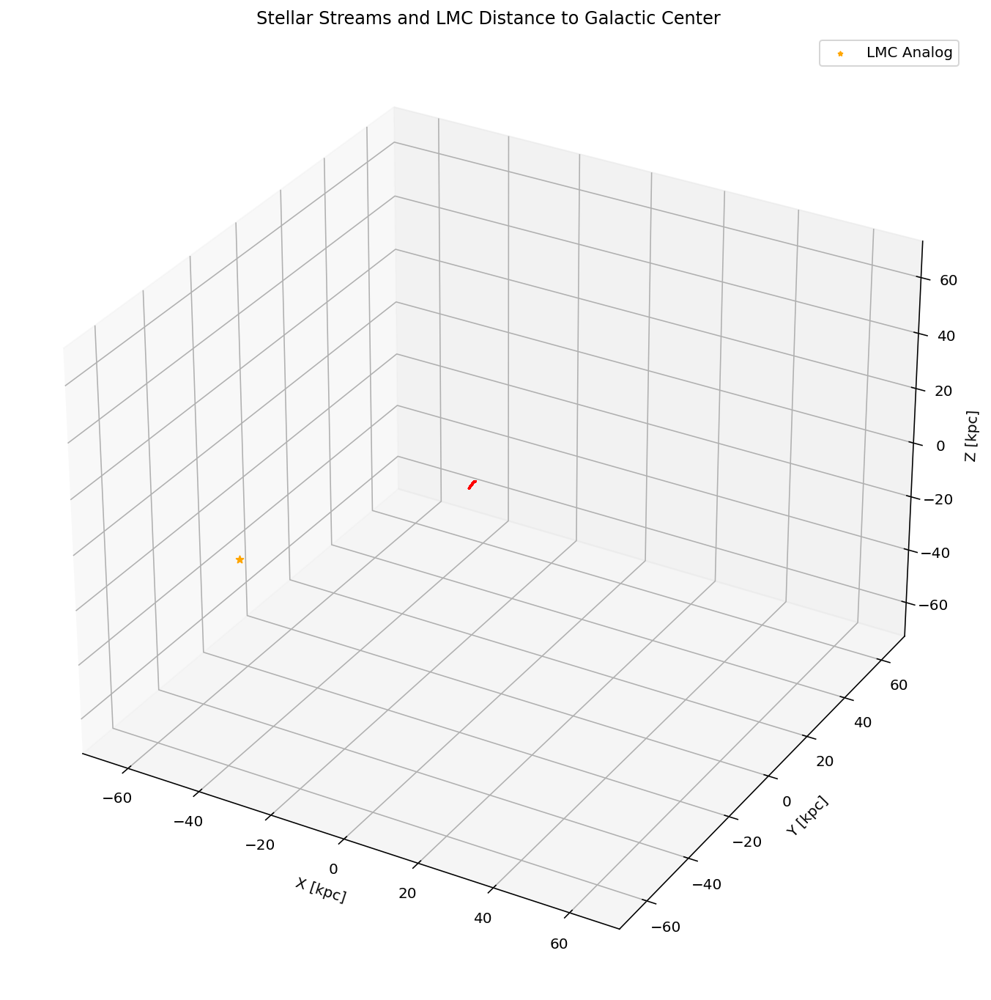

In [87]:
#%matplotlib notebook
#enable notebook for interactive
fig = plt.figure(1,figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
st = 'Gaia-1-I21'
# for st in mwsts.keys():
#     ax.scatter3D(mwsts[st].track.transform_to(gsr).x,mwsts[st].track.transform_to(gsr).y,
#                  mwsts[st].track.transform_to(gsr).z,
#                  marker='.', color='red', s=1, c=None, alpha=1)

ax.scatter3D(mwsts[st].track.transform_to(gsr).x,mwsts[st].track.transform_to(gsr).y,
             mwsts[st].track.transform_to(gsr).z,
             marker='.', color='red', s=1, c=None, alpha=1)
# ax.scatter3D(trot['x'][1:], trot['y'][1:], trot['z'][1:], color='blue', label='Subhalos', s=10*(trot['rs'][1:]), alpha=1)    
ax.scatter3D(trot['x'][0], trot['y'][0], trot['z'][0], marker='*', color='orange', s=50*trot['rs'][0], 
             label='LMC Analog', alpha=1)
ax.set_xlim3d(-70, 70)
ax.set_ylim3d(-70, 70)
ax.set_zlim3d(-70, 70)
ax.set_xlabel('X [kpc]')
ax.set_ylabel('Y [kpc]')
ax.set_zlabel('Z [kpc]')
plt.legend(loc='best', markerscale=0.6)
plt.title('Stellar Streams and LMC Distance to Galactic Center')

                 

In [88]:
i = 4
if ((list(names.values())[i] != 'None') & 
        (list(Nstep_foward_dict.values())[i] != 'None') & 
        (list(Nstep_foward_dict.values())[i] != 'Unknown')):

        c = coord.SkyCoord(ra=streams.iloc[i][1]*u.deg, dec=streams.iloc[i][2]*u.deg, 
                           distance=streams.iloc[i][3]*u.kpc, pm_ra_cosdec=streams.iloc[i][4]*u.mas/u.yr, 
                           pm_dec=streams.iloc[i][5]*u.mas/u.yr, radial_velocity=streams.iloc[i][6]*u.km/u.s, 
                           frame='icrs')

        w0 = gd.PhaseSpacePosition(c.transform_to(gc_frame).cartesian)
        dt = 0.2*u.Myr
        Nstep_foward = list(Nstep_foward_dict.values())[i]
        orbit_foward = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep_foward)
        orbit_foward_icrs = orbit_foward.to_coord_frame(coord.ICRS())
        w0_start = gd.PhaseSpacePosition(orbit_foward.pos, orbit_foward.vel)
        Nstep = list(Nstep_represent_dict.values())[i] 
        orbit = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep)

        # Going back for 1 Gyr - Anything past this, we anticipate a progenitor
        Nstep_long = 1000
        orbit_long = ham.integrate_orbit(w0_start, dt=-dt, n_steps=Nstep_long)

        data_new = {'Stream': [str(streams.iloc[i]['Stream'])]}
        data_temp = pd.DataFrame(data=data_new)

#             for subh in range(len(trot['x'])): #subh stands for individual subhalo
        Npoint = np.shape(orbit_long.pos)[1]
        shape = np.shape(orbit_long.pos)

        temp_distances_x = np.empty(shape)
        temp_distances_y = np.empty(shape)
        temp_distances_z = np.empty(shape)

        for point in range(Npoint):
            temp_distances_x[:, point] = orbit_long.pos.x.to(u.kpc)[:, point] - rot_orbits[0,:,0]*u.kpc
            temp_distances_y[:, point] = orbit_long.pos.y.to(u.kpc)[:, point] - rot_orbits[0,:,1]*u.kpc
            temp_distances_z[:, point] = orbit_long.pos.z.to(u.kpc)[:, point] - rot_orbits[0,:,2]*u.kpc

            rel_temp_dist = np.sqrt(temp_distances_x**2 + temp_distances_y**2 + temp_distances_z**2)
            dist_to_lmc_closest_approach = rel_temp_dist#[:, 0]
            abs_min = np.min(dist_to_lmc_closest_approach)

In [89]:
abs_min